# Week 4 - Univariate Analysis, part 2

# 1. Lesson - None

# 2. Weekly graph question

Below are a histogram and boxplot representation of the same data. A pharmacy is keeping a record of the prices of the drugs that it sells, and an administrator wants to know how much the more expensive drugs tend to cost, in the context of the other prices.

Please write a short explanation of the pros and cons of these two representations. Which would you choose? How would you modify the formatting, if at all, to make it more visually interesting, clear, or informative?

In [22]:
import numpy as np
import pandas as pd

np.random.seed(0)
num_data = 100
data = np.exp(np.random.uniform(size = num_data) * 4)
df = pd.DataFrame(data.T, columns = ["data"])

The 75th percentile is: data    15.457656
Name: 0.75, dtype: float64


<Axes: ylabel='Frequency'>

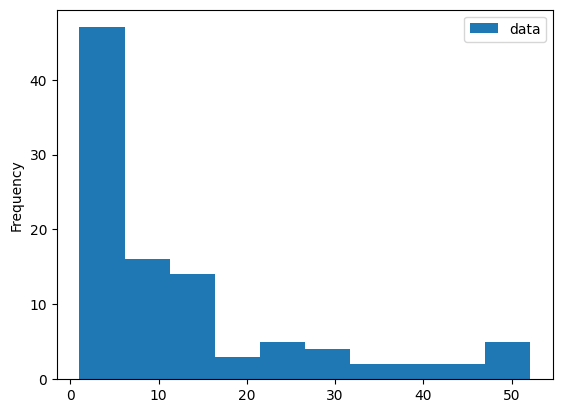

In [23]:
print("The 75th percentile is:", df.quantile(q = 0.75))
df.plot.hist()

<Axes: >

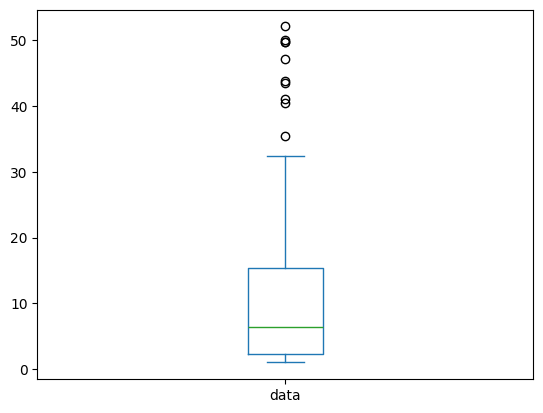

In [24]:
df.plot.box()

**Explanation**

* Histogram

**Pros:** We can vizualize the distribution of the prices and the peaks.

**Cons:** Does not provide statictics like quartiles, median, etc.in a single view. The choice of bin size can significantly impact how the histogram looks, potentially leading to a misleading representation of the data.

* Boxplot

**Pros:** Shows outliers, median, quartiles, etc.

**Cons:** Does not show the frequency distribution of the data.

**Which would I choose?**

I would choose the boxplot for this context. The administrator wants to know how much the more expensive drugs tend to cost, and the boxplot address this question more directly.

**How would I modify the formatting, if at all, to make it more visually interesting, clear, or informative?**

Histogram:

* Adjust the number of bins.

* Add labels or annotations indicating key percentiles (e.g., 75th percentile, median) for context.

Boxplot:

* Add a title that indicates the focus on high prices.

* Play with the colors to emphasize the areas of interest and draw attention to the more expensive drugs.

# 3. Homework - working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

### Here are some types of analysis you can do:

- Draw histograms and histogram variants for each feature or column.  (Swarm plot, kde plot, violin plot).

- Draw grouped histograms.  For instance, if you have tree heights for both maple and oak trees, you could draw histograms for both.

- Draw a bar plot to indicate total counts of each categorical variable in a given column.

- Find means, medians, and modes.

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If they are not useable, find some new data!

- What is the overall shape of the distribution?  Is it normal, skewed, bimodal, uniform, etc.?

- Are there any outliers present?  (Data points that are far from the others.)

- If there are multiple related histograms, how does the distribution change across different groups?

- What are the minimum and maximum values represented in each histogram?

- How do bin sizes affect the histogram?  Does changing the bin width reveal different patterns in the data?

- Does the distribution appear normal, or does it have a different distribution?

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import skew, kurtosis

In [26]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("shashwatwork/web-page-phishing-detection-dataset")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/shashwatwork/web-page-phishing-detection-dataset/versions/2


In [27]:
import pandas as pd

# Load the dataset
df = pd.read_csv(path + '/dataset_phishing.csv')

# Display the first few rows of the dataset
print(df.head())

                                                 url  length_url  \
0              http://www.crestonwood.com/router.php          37   
1  http://shadetreetechnology.com/V4/validation/a...          77   
2  https://support-appleld.com.secureupdate.duila...         126   
3                                 http://rgipt.ac.in          18   
4  http://www.iracing.com/tracks/gateway-motorspo...          55   

   length_hostname  ip  nb_dots  nb_hyphens  nb_at  nb_qm  nb_and  nb_or  ...  \
0               19   0        3           0      0      0       0      0  ...   
1               23   1        1           0      0      0       0      0  ...   
2               50   1        4           1      0      1       2      0  ...   
3               11   0        2           0      0      0       0      0  ...   
4               15   0        2           2      0      0       0      0  ...   

   domain_in_title  domain_with_copyright  whois_registered_domain  \
0                0                

**Draw histograms for each feature or column:**

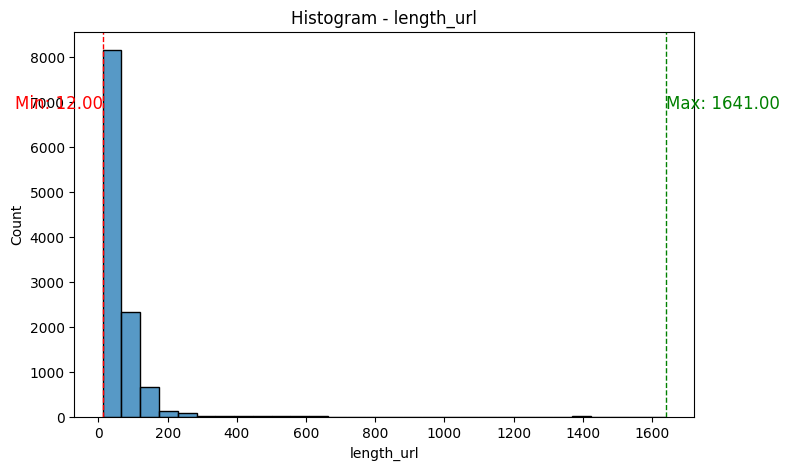

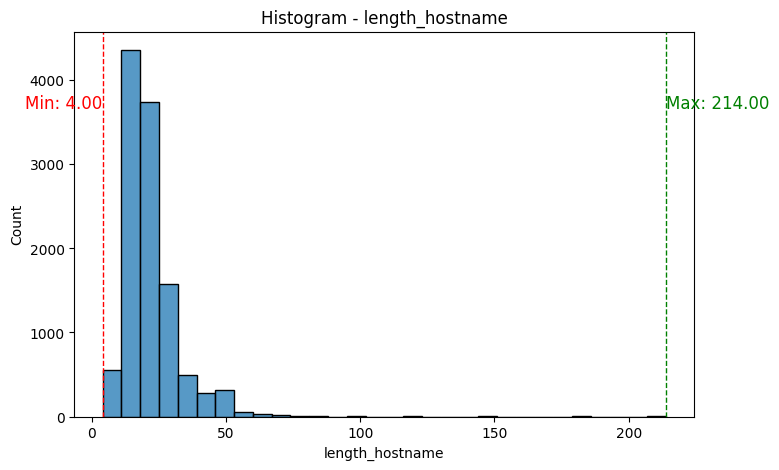

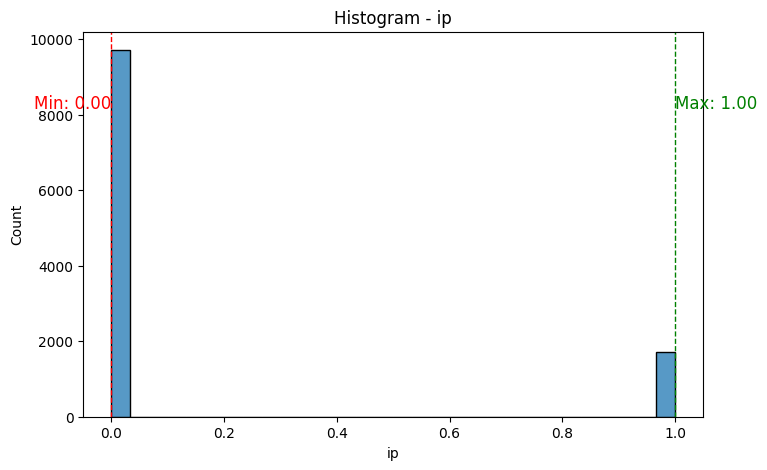

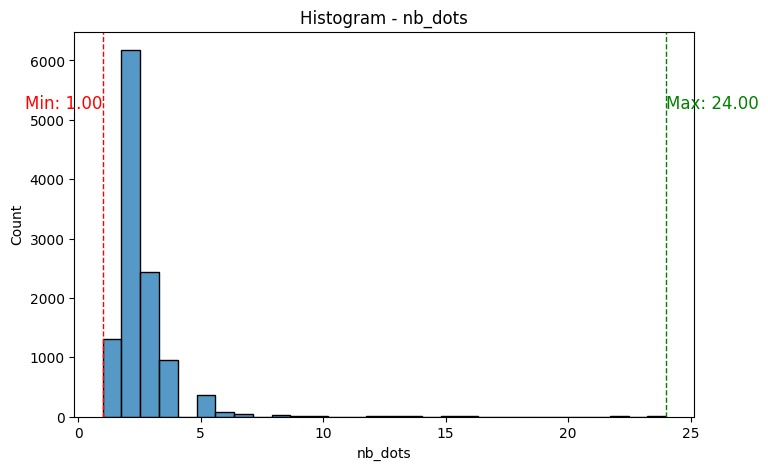

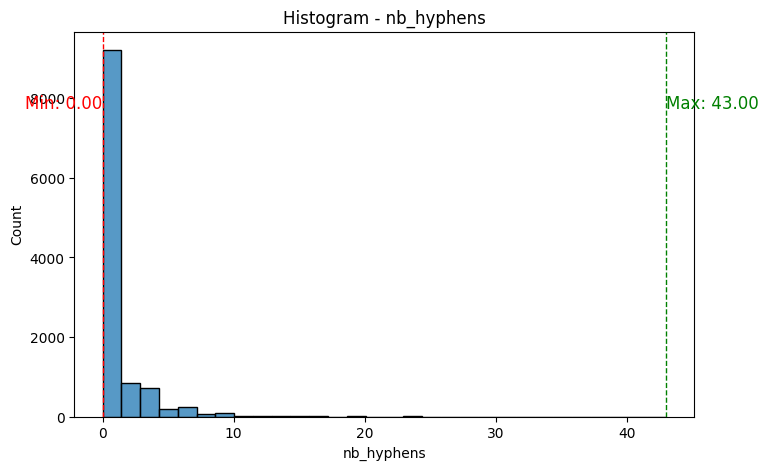

...

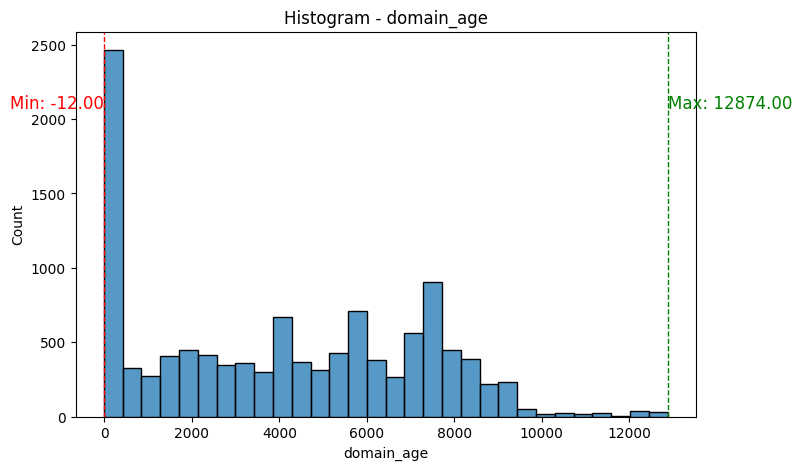

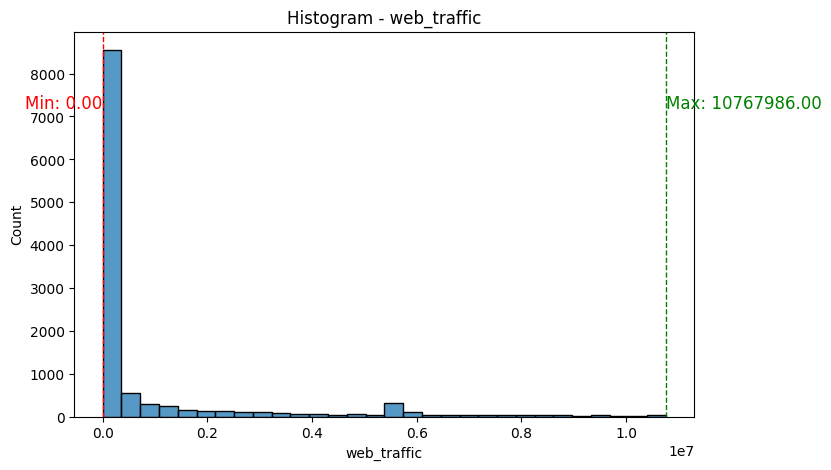

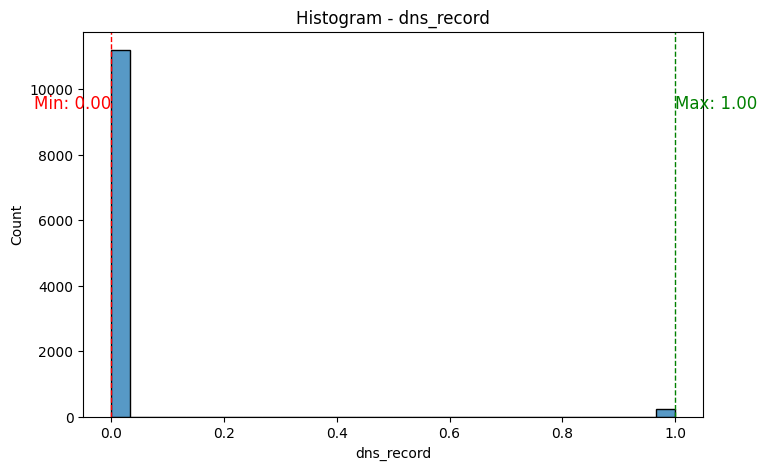

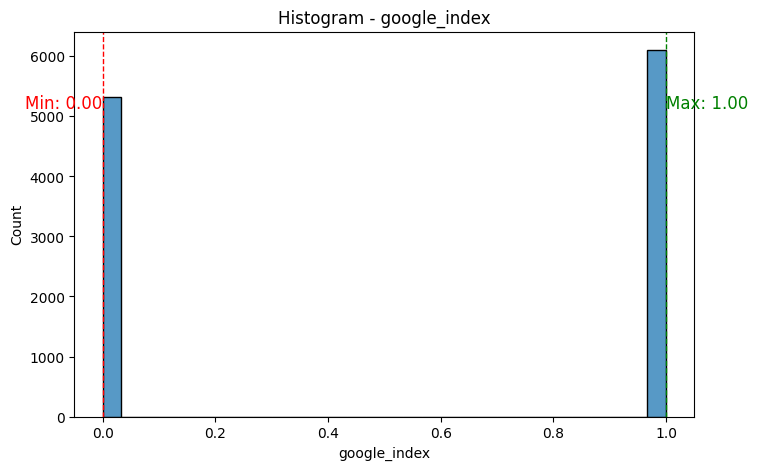

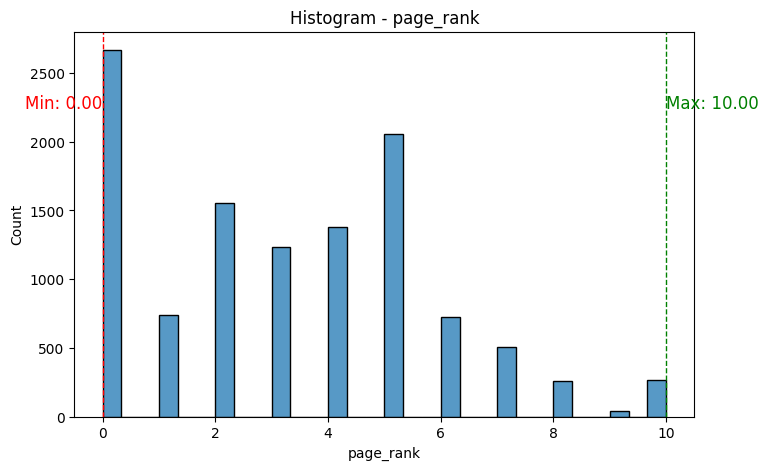

In [28]:
# Get numerical columns
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Loop through each numerical column
for col in numeric_cols:
    fig, ax = plt.subplots(figsize=(8, 5))

    # Plot Histogram
    sns.histplot(df[col], bins=30, kde=False, ax=ax)

    # Get min & max values
    min_val = df[col].min()
    max_val = df[col].max()

    # Add text annotations for min & max
    ax.axvline(min_val, color='red', linestyle='dashed', linewidth=1)
    ax.axvline(max_val, color='green', linestyle='dashed', linewidth=1)
    ax.text(min_val, ax.get_ylim()[1] * 0.8, f"Min: {min_val:.2f}", color="red", fontsize=12, ha='right')
    ax.text(max_val, ax.get_ylim()[1] * 0.8, f"Max: {max_val:.2f}", color="green", fontsize=12, ha='left')

    ax.set_title(f"Histogram - {col}")

    plt.show()

**Draw histograms and histogram variants for each feature or column.  (Swarm plot, kde plot, violin plot):**

Feature: length_url
  Skewness: 8.08  (Skewed: Right)
  Kurtosis: 144.13  (Flat: False, Peaked: True)
----------------------------------------


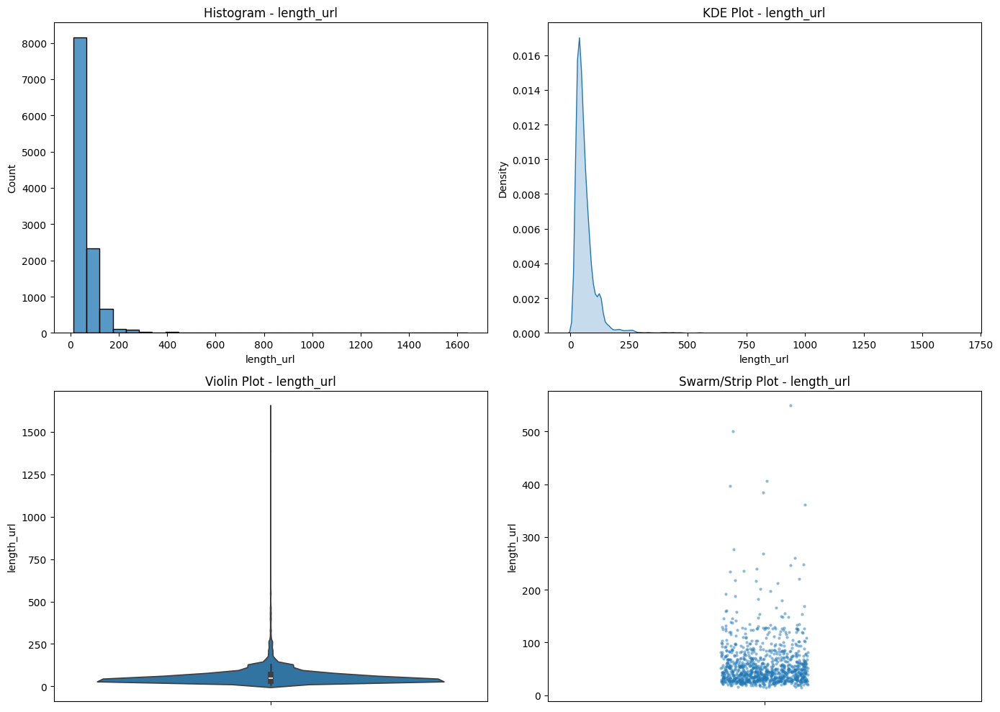

Feature: length_hostname
  Skewness: 5.16  (Skewed: Right)
  Kurtosis: 69.80  (Flat: False, Peaked: True)
----------------------------------------


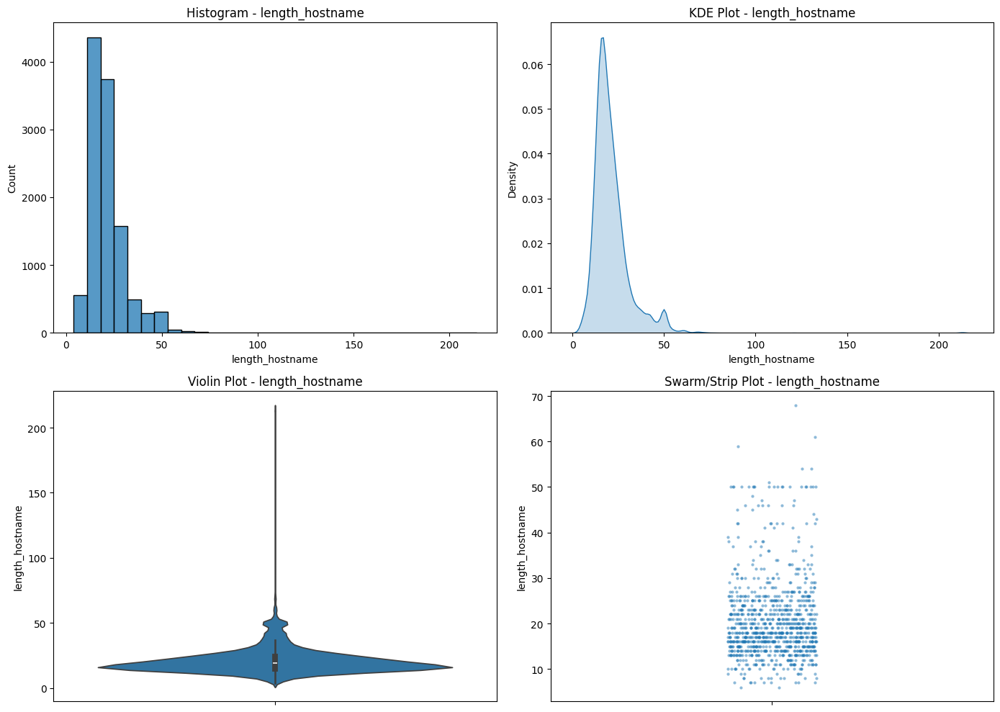

Feature: ip
  Skewness: 1.95  (Skewed: Right)
  Kurtosis: 1.82  (Flat: True, Peaked: False)
----------------------------------------


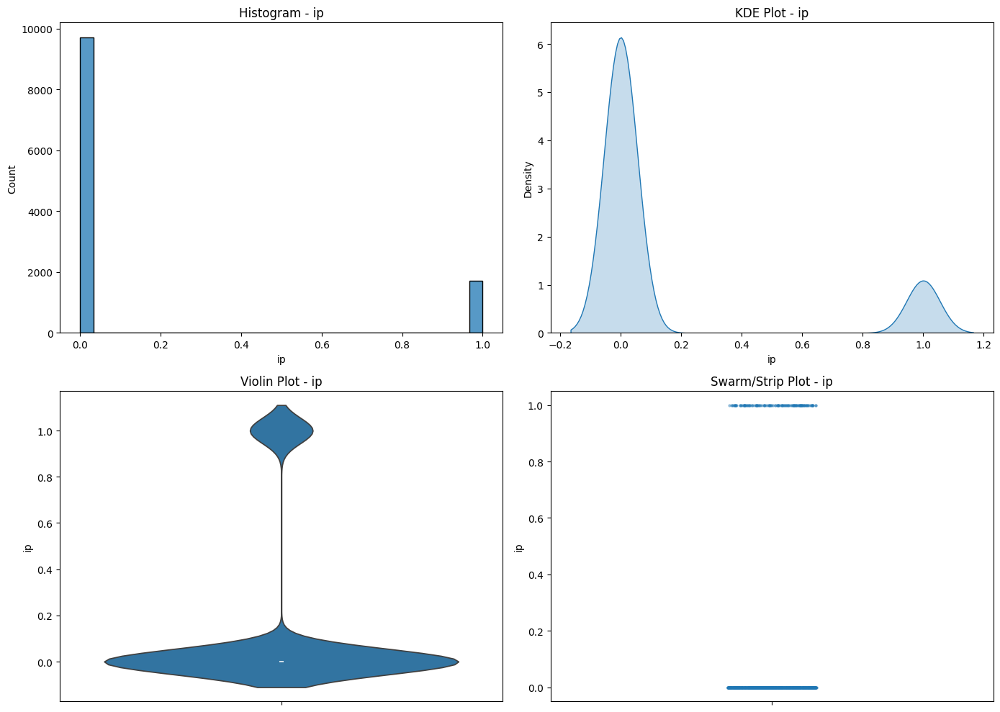

Feature: nb_dots
  Skewness: 5.72  (Skewed: Right)
  Kurtosis: 66.13  (Flat: False, Peaked: True)
----------------------------------------


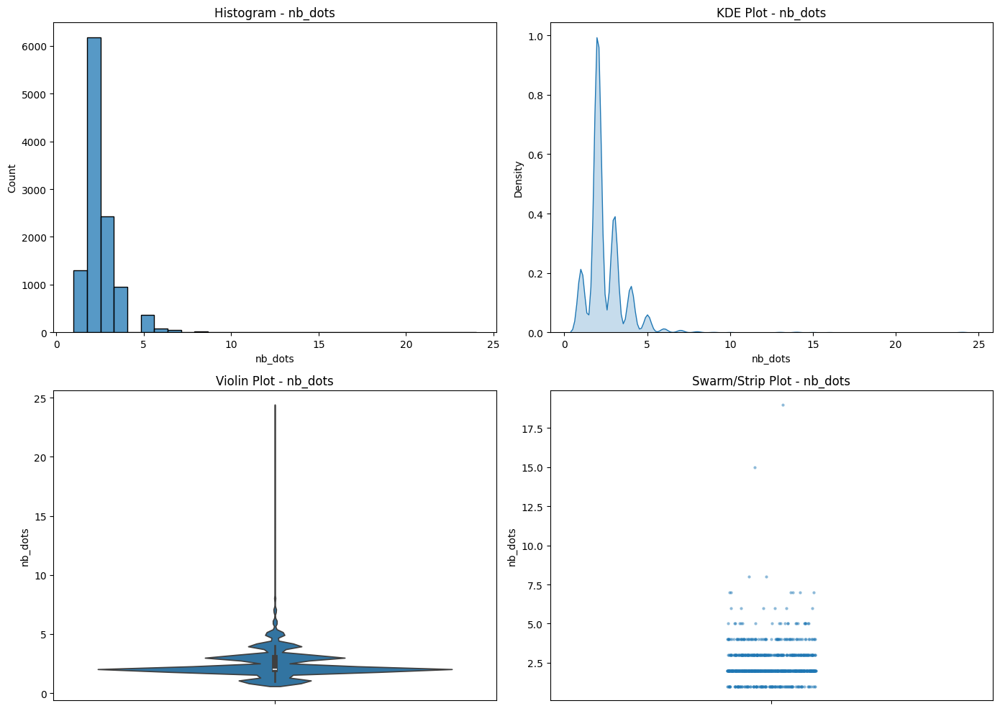

Feature: nb_hyphens
  Skewness: 4.69  (Skewed: Right)
  Kurtosis: 40.68  (Flat: False, Peaked: True)
----------------------------------------


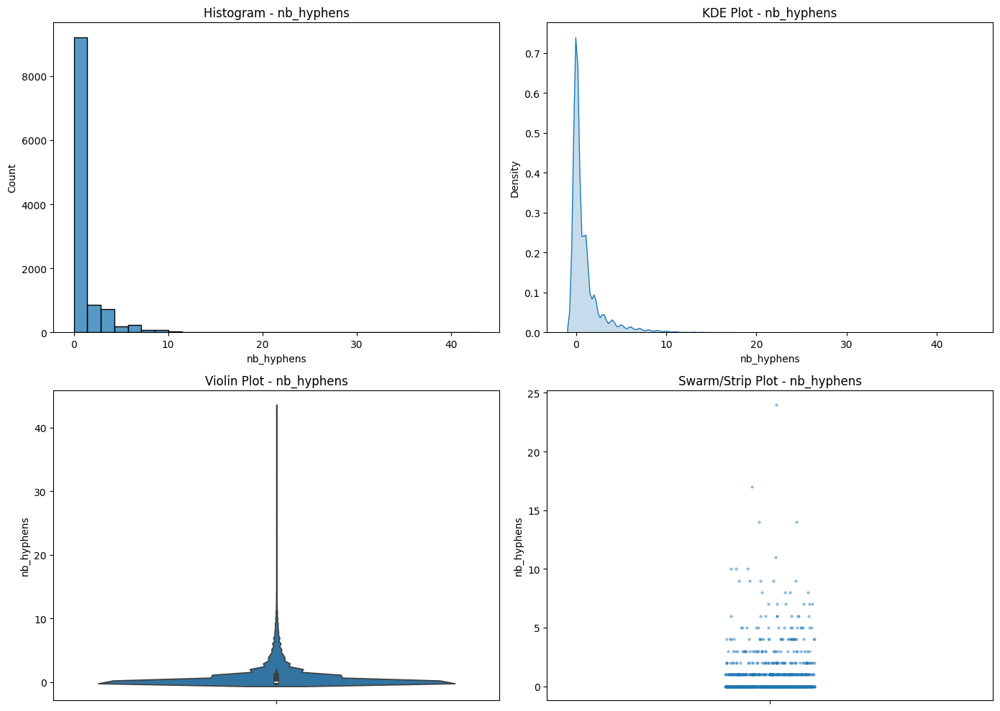

Feature: nb_at
  Skewness: 8.27  (Skewed: Right)
  Kurtosis: 95.41  (Flat: False, Peaked: True)
----------------------------------------


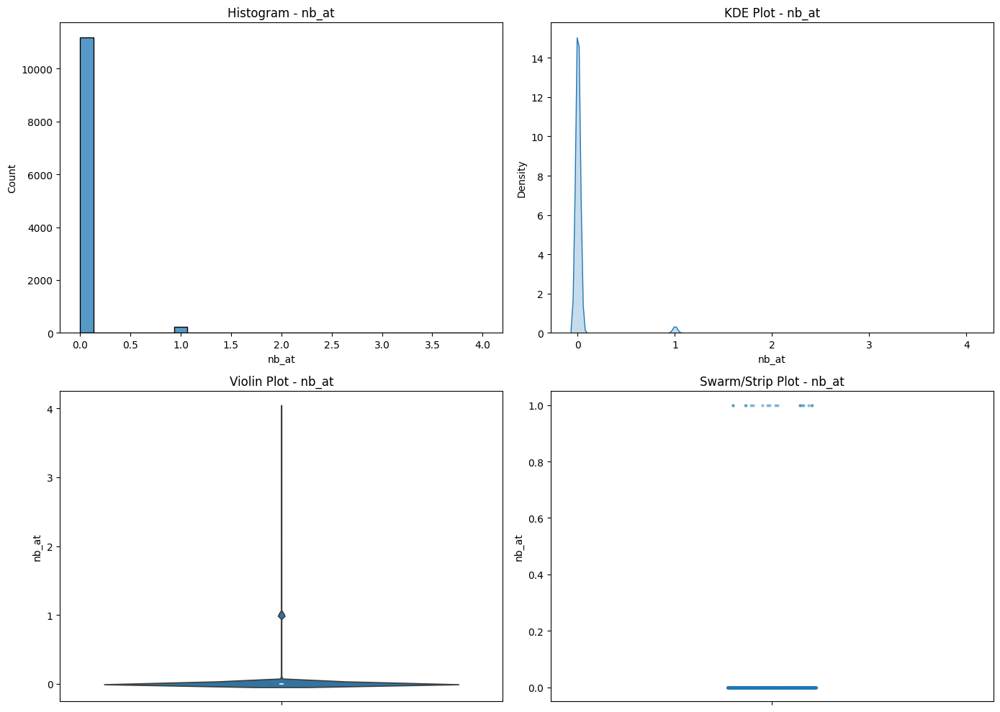

Feature: nb_qm
  Skewness: 2.49  (Skewed: Right)
  Kurtosis: 6.06  (Flat: False, Peaked: True)
----------------------------------------


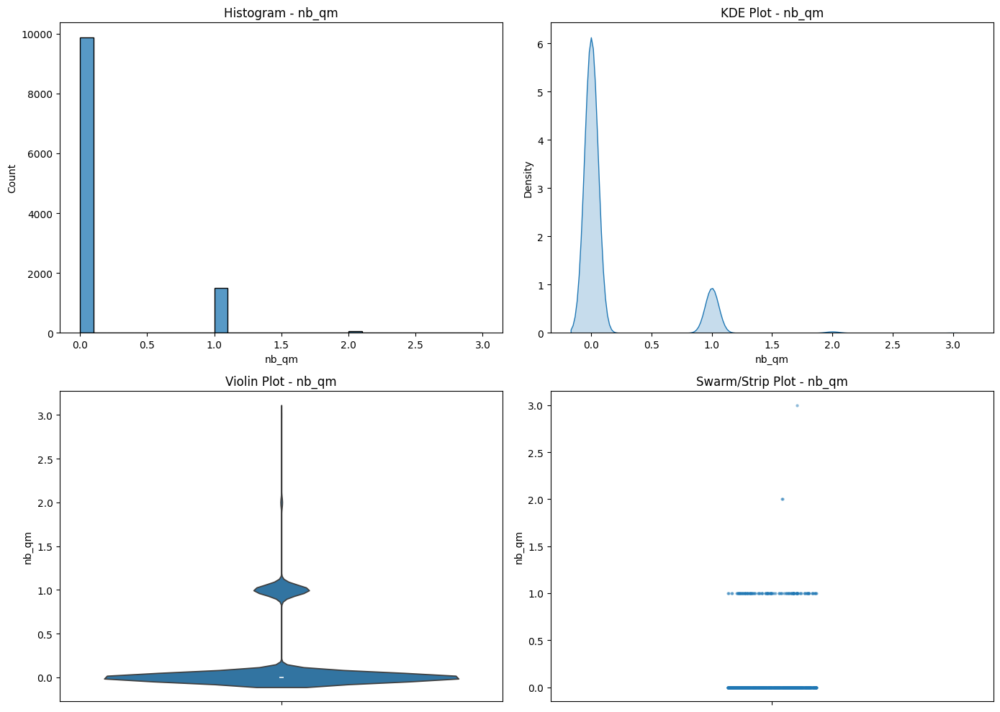

Feature: nb_and
  Skewness: 9.72  (Skewed: Right)
  Kurtosis: 139.08  (Flat: False, Peaked: True)
----------------------------------------


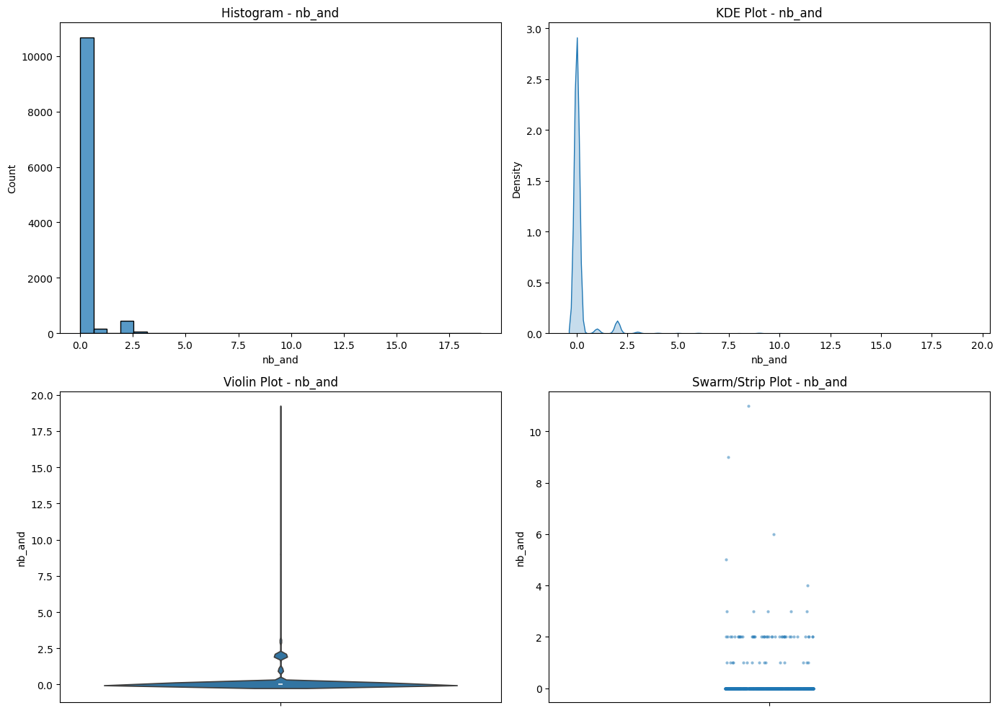

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: nb_or
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


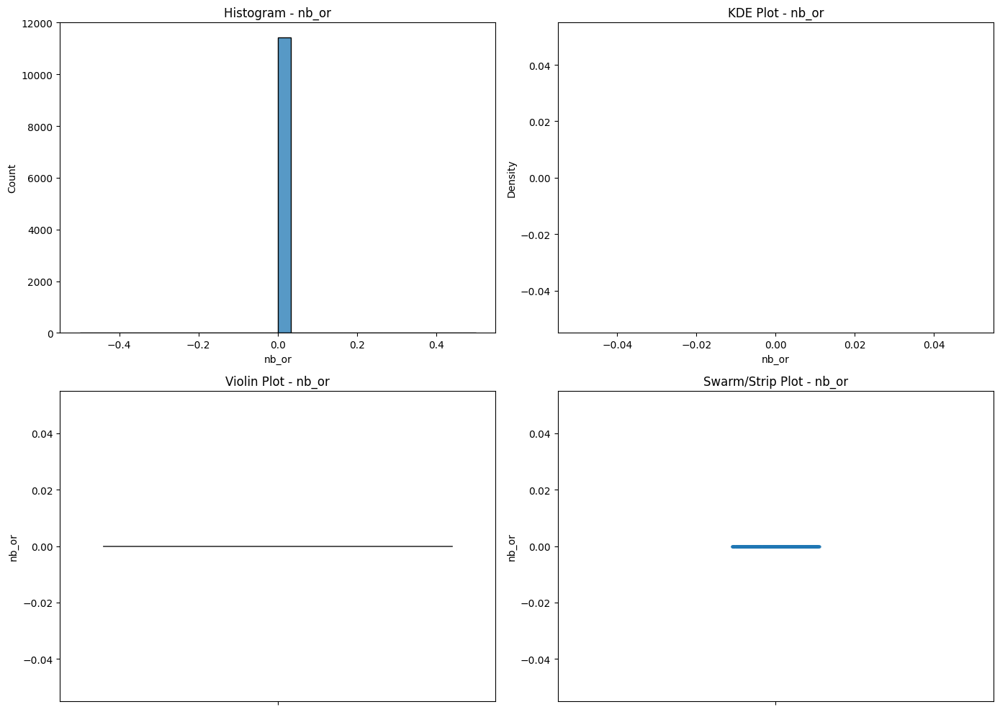

Feature: nb_eq
  Skewness: 6.53  (Skewed: Right)
  Kurtosis: 70.88  (Flat: False, Peaked: True)
----------------------------------------


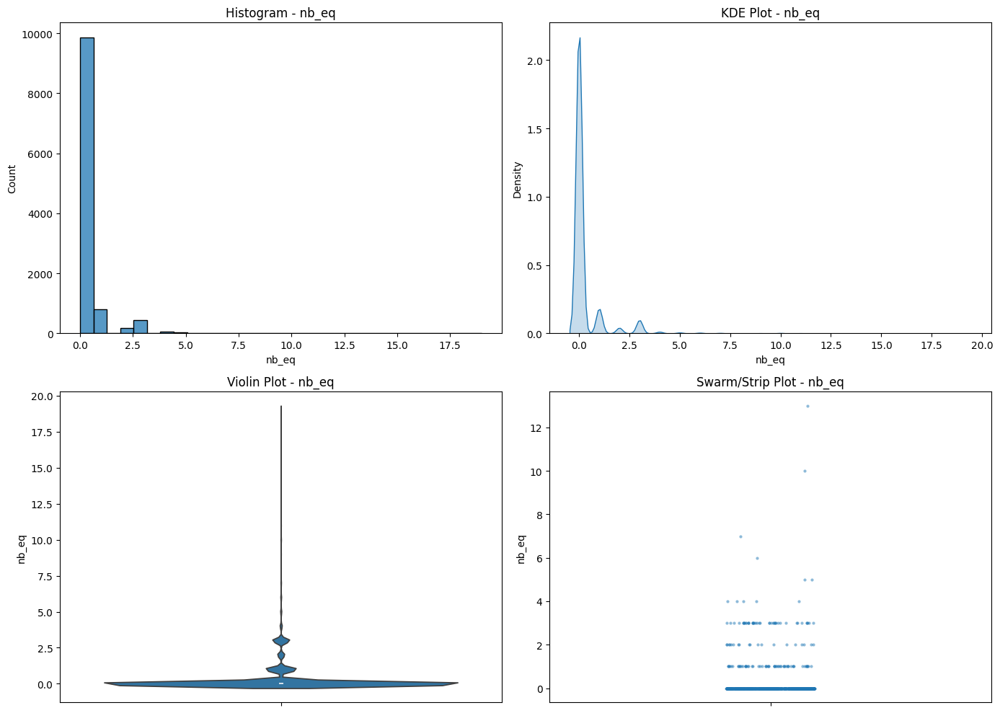

Feature: nb_underscore
  Skewness: 7.26  (Skewed: Right)
  Kurtosis: 82.98  (Flat: False, Peaked: True)
----------------------------------------


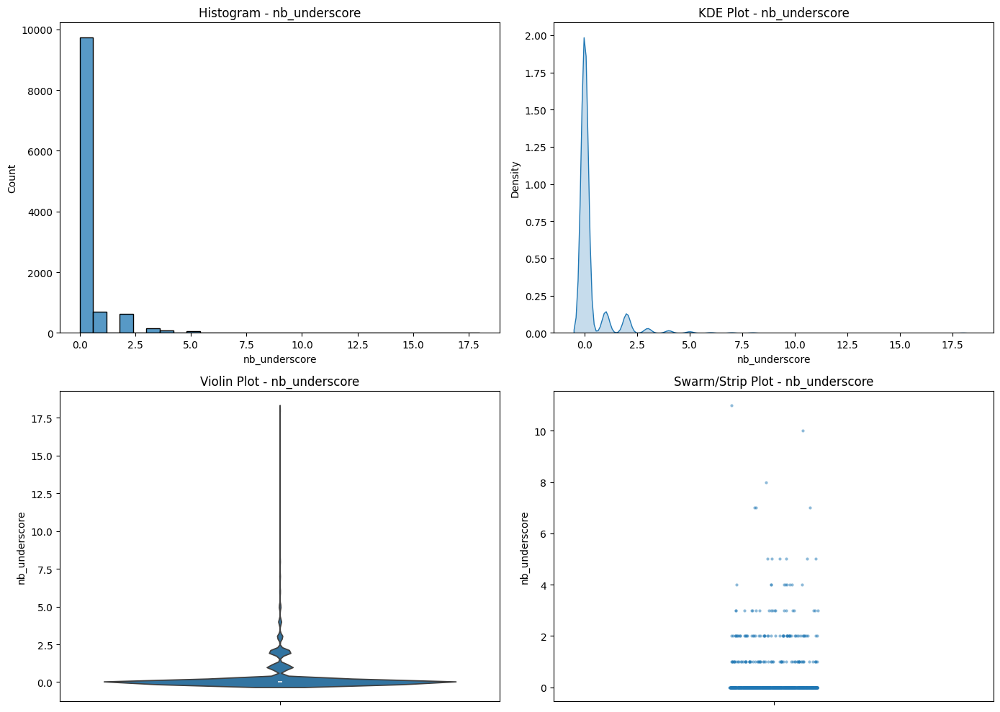

Feature: nb_tilde
  Skewness: 12.14  (Skewed: Right)
  Kurtosis: 145.40  (Flat: False, Peaked: True)
----------------------------------------


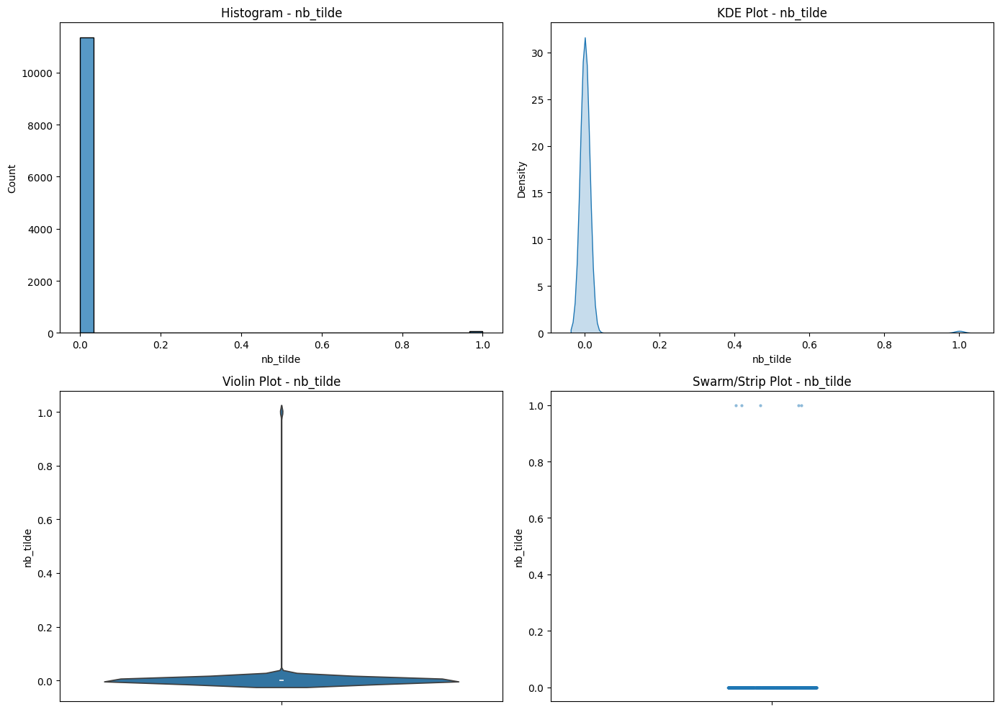

Feature: nb_percent
  Skewness: 35.42  (Skewed: Right)
  Kurtosis: 1871.56  (Flat: False, Peaked: True)
----------------------------------------


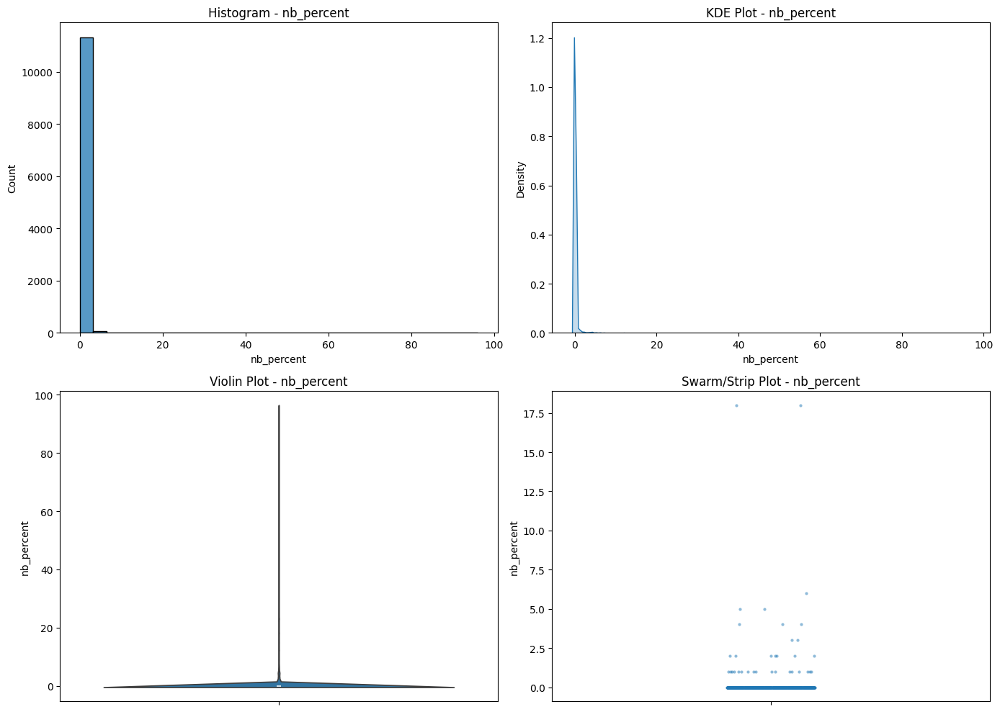

Feature: nb_slash
  Skewness: 2.73  (Skewed: Right)
  Kurtosis: 18.29  (Flat: False, Peaked: True)
----------------------------------------


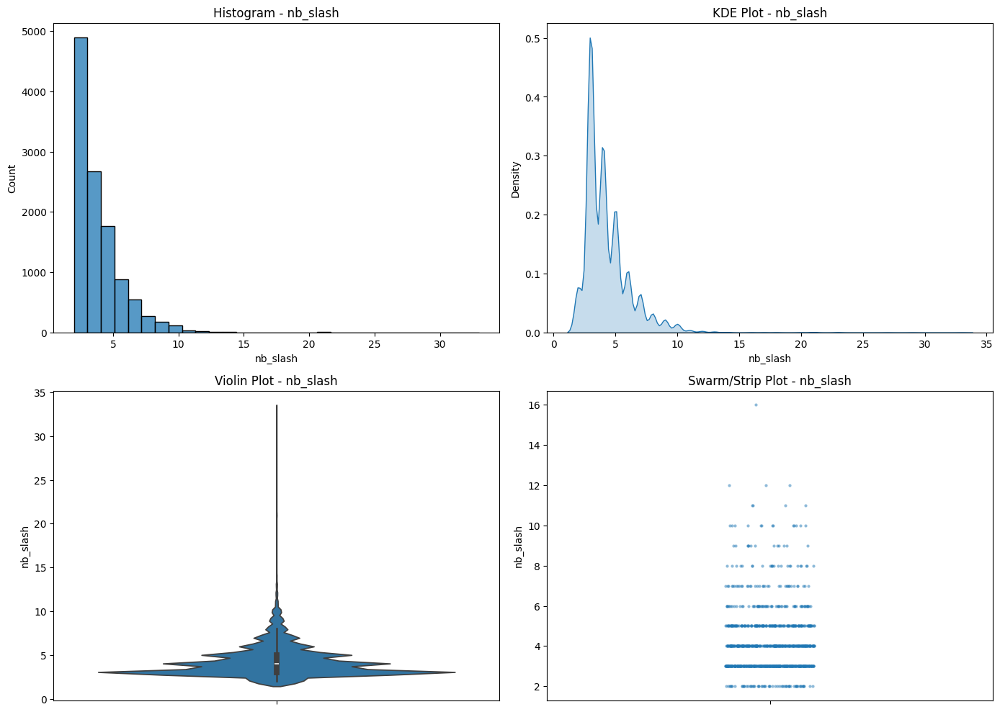

Feature: nb_star
  Skewness: 37.76  (Skewed: Right)
  Kurtosis: 1423.75  (Flat: False, Peaked: True)
----------------------------------------


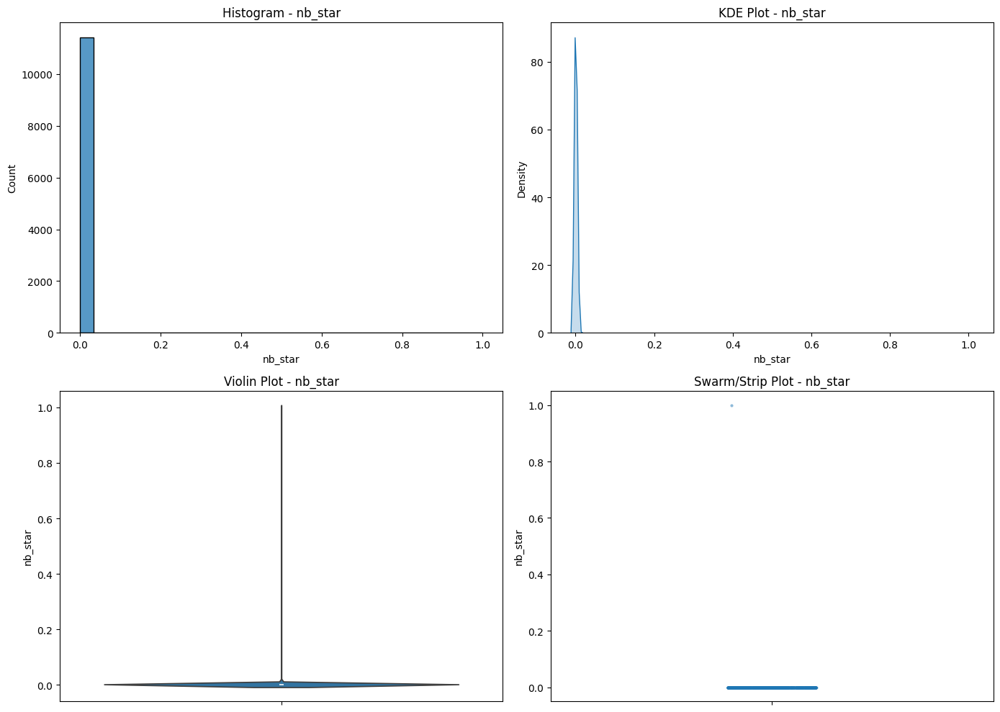

Feature: nb_colon
  Skewness: 11.38  (Skewed: Right)
  Kurtosis: 166.26  (Flat: False, Peaked: True)
----------------------------------------


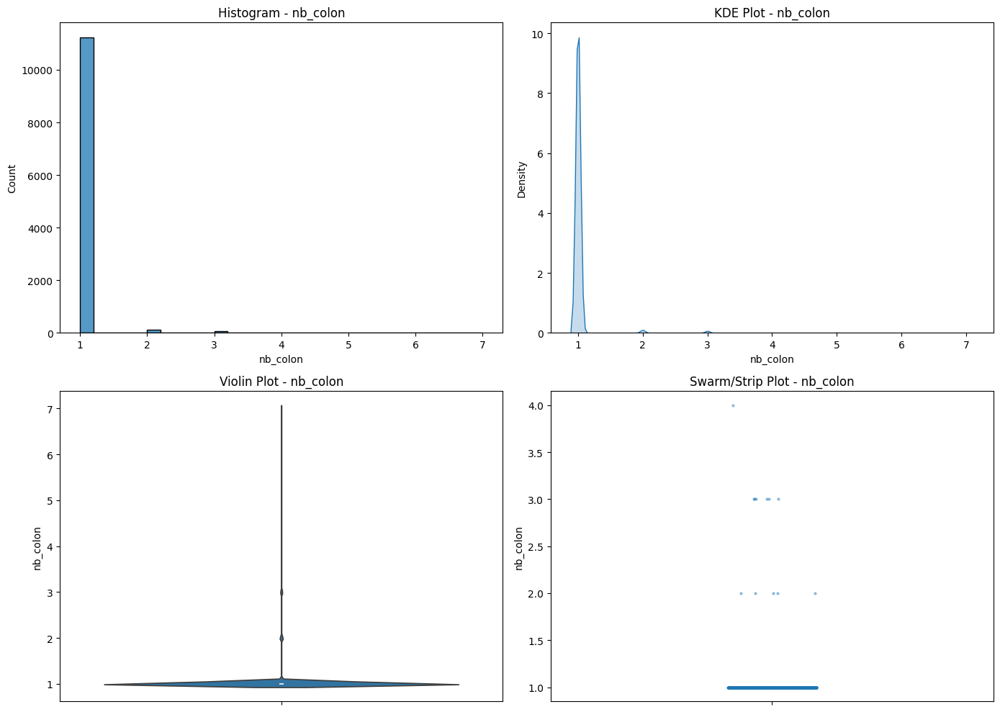

Feature: nb_comma
  Skewness: 31.69  (Skewed: Right)
  Kurtosis: 1112.03  (Flat: False, Peaked: True)
----------------------------------------


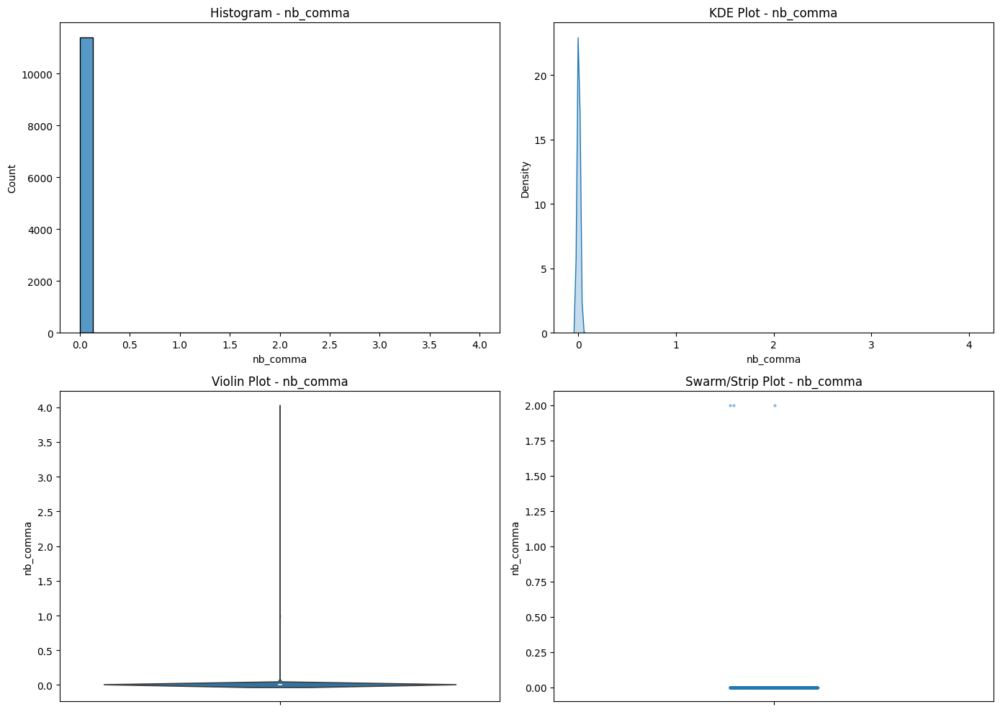

Feature: nb_semicolumn
  Skewness: 16.16  (Skewed: Right)
  Kurtosis: 339.11  (Flat: False, Peaked: True)
----------------------------------------


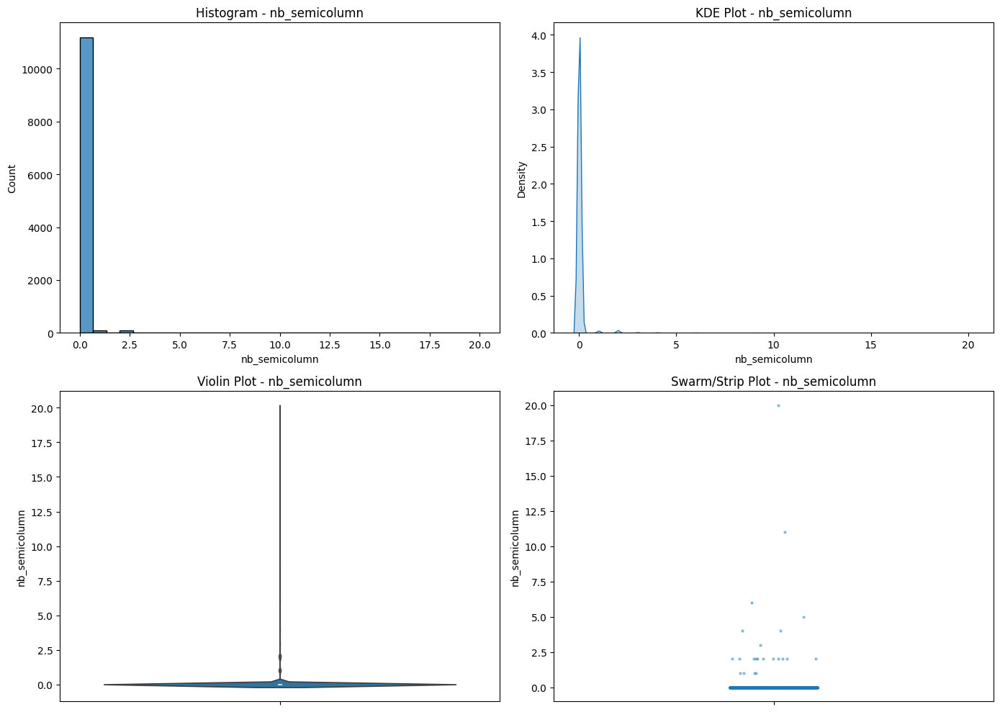

Feature: nb_dollar
  Skewness: 55.65  (Skewed: Right)
  Kurtosis: 3693.99  (Flat: False, Peaked: True)
----------------------------------------


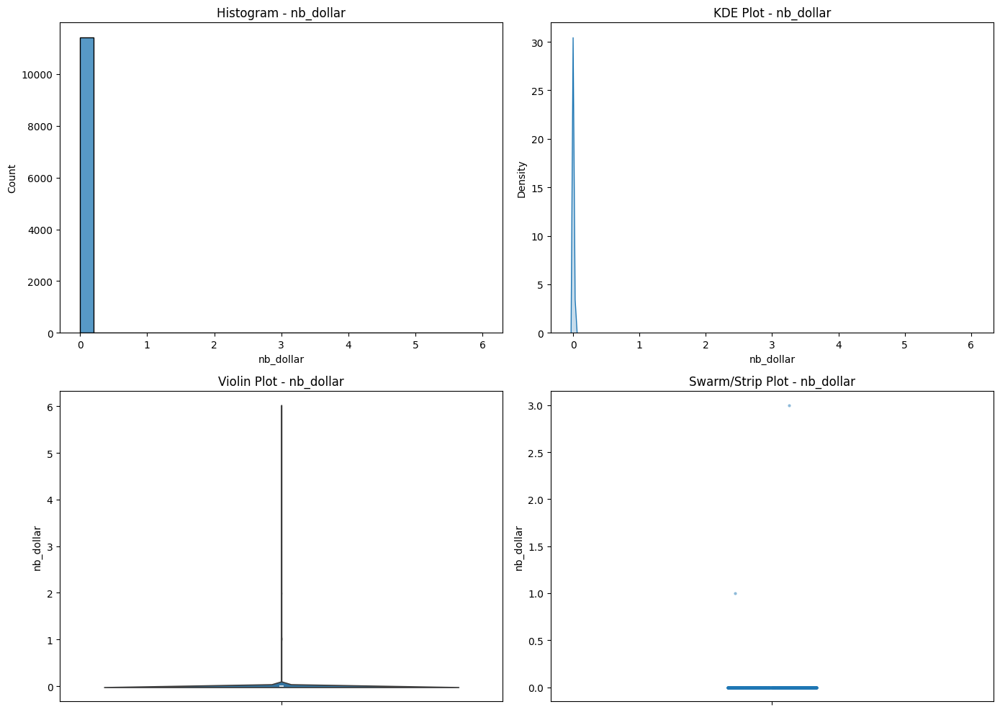

Feature: nb_space
  Skewness: 25.42  (Skewed: Right)
  Kurtosis: 996.69  (Flat: False, Peaked: True)
----------------------------------------


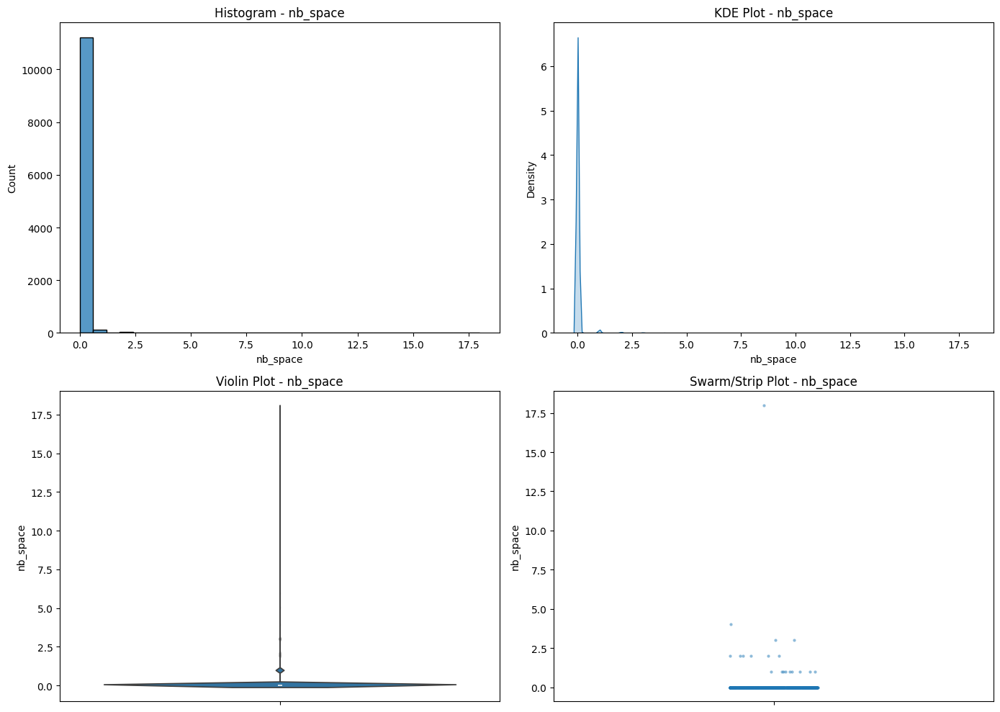

Feature: nb_www
  Skewness: 0.26  (Skewed: Right)
  Kurtosis: -1.79  (Flat: True, Peaked: False)
----------------------------------------


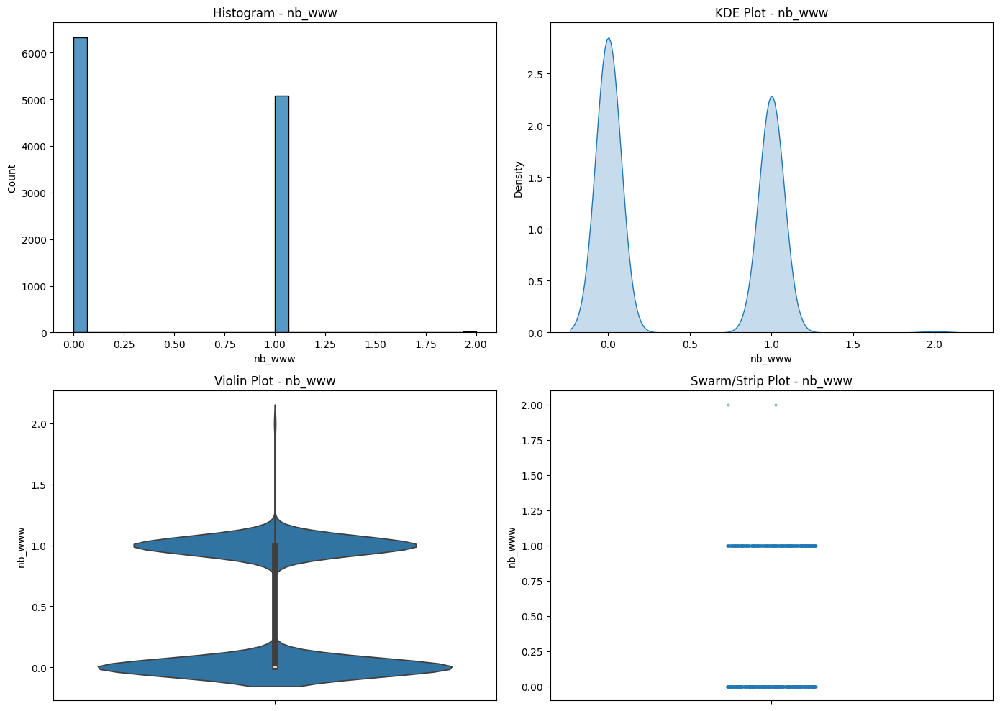

Feature: nb_com
  Skewness: 3.78  (Skewed: Right)
  Kurtosis: 23.43  (Flat: False, Peaked: True)
----------------------------------------


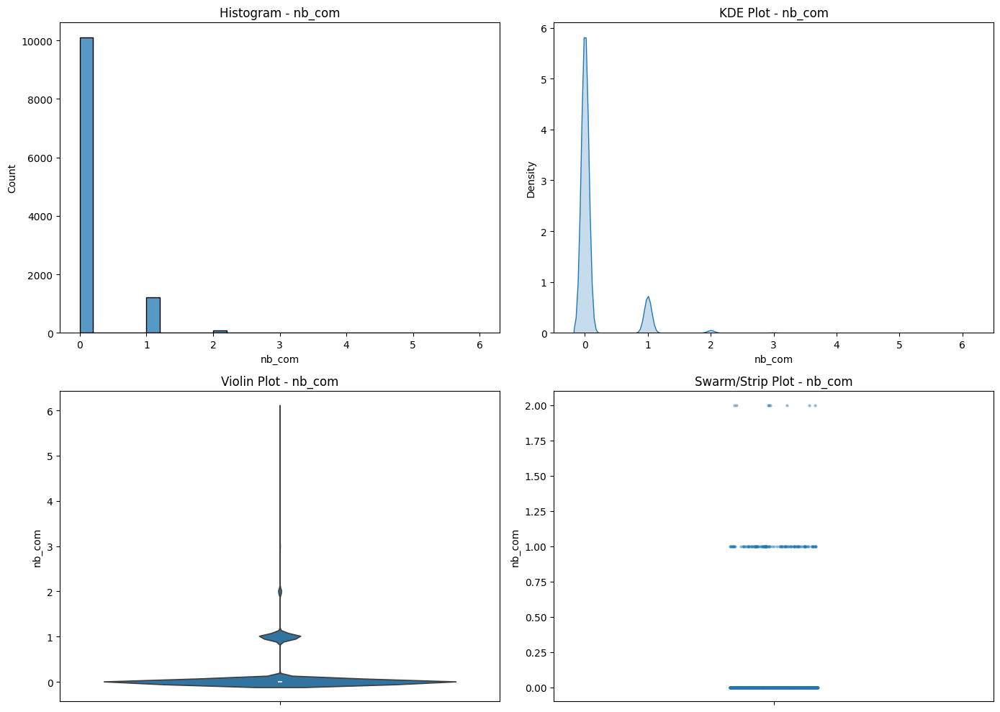

Feature: nb_dslash
  Skewness: 12.22  (Skewed: Right)
  Kurtosis: 147.41  (Flat: False, Peaked: True)
----------------------------------------


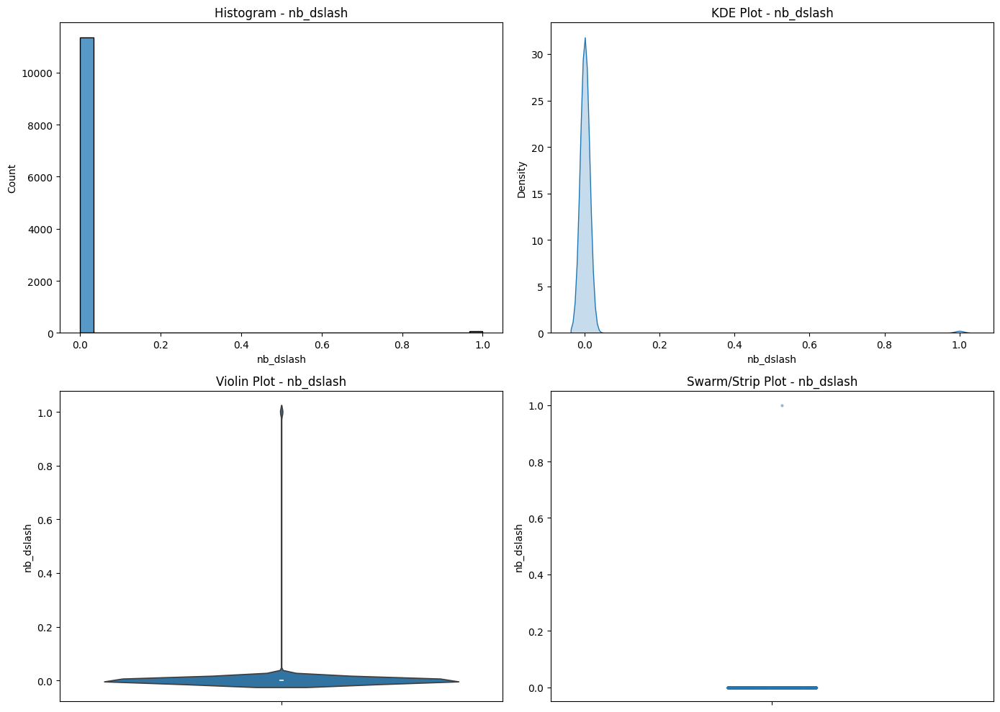

Feature: http_in_path
  Skewness: 14.82  (Skewed: Right)
  Kurtosis: 284.13  (Flat: False, Peaked: True)
----------------------------------------


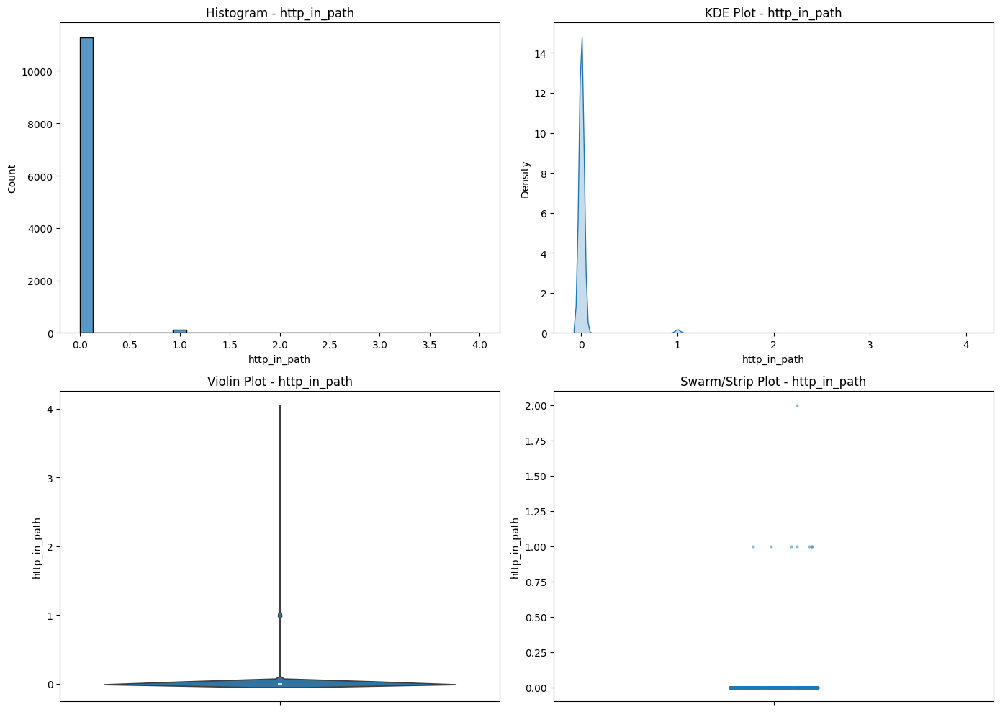

Feature: https_token
  Skewness: -0.46  (Skewed: Left)
  Kurtosis: -1.79  (Flat: True, Peaked: False)
----------------------------------------


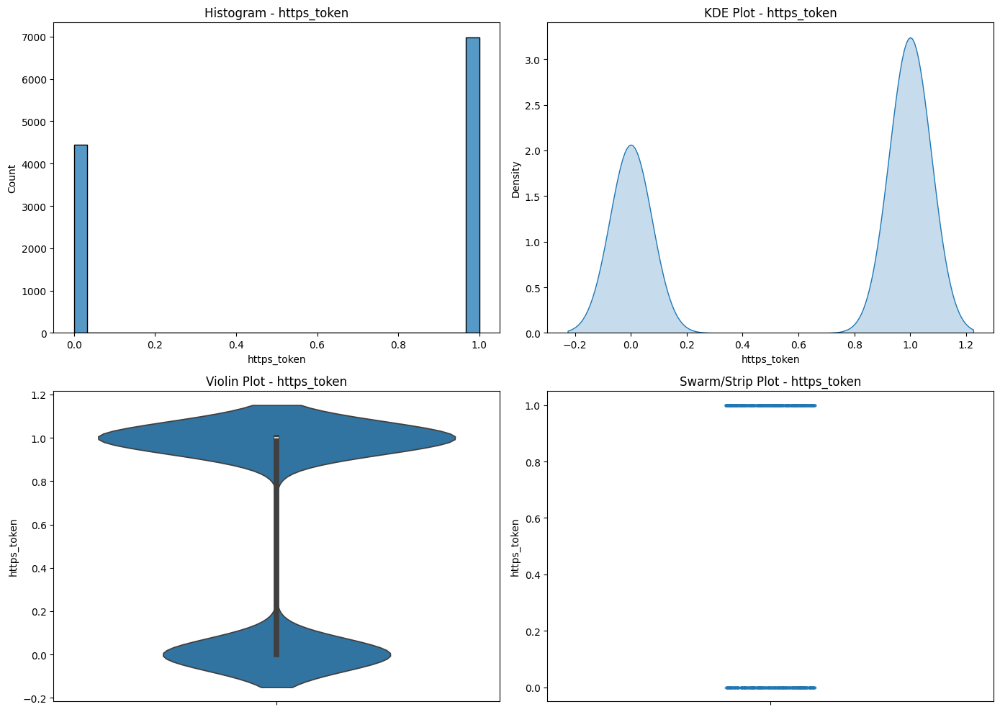

Feature: ratio_digits_url
  Skewness: 2.19  (Skewed: Right)
  Kurtosis: 5.34  (Flat: False, Peaked: True)
----------------------------------------


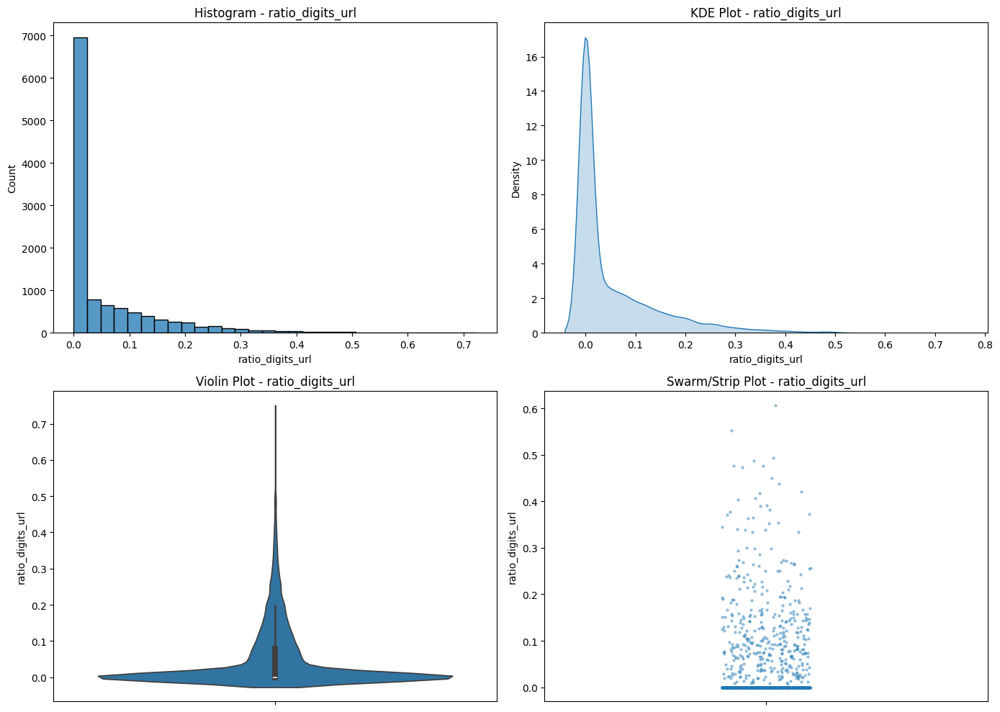

Feature: ratio_digits_host
  Skewness: 5.59  (Skewed: Right)
  Kurtosis: 36.58  (Flat: False, Peaked: True)
----------------------------------------


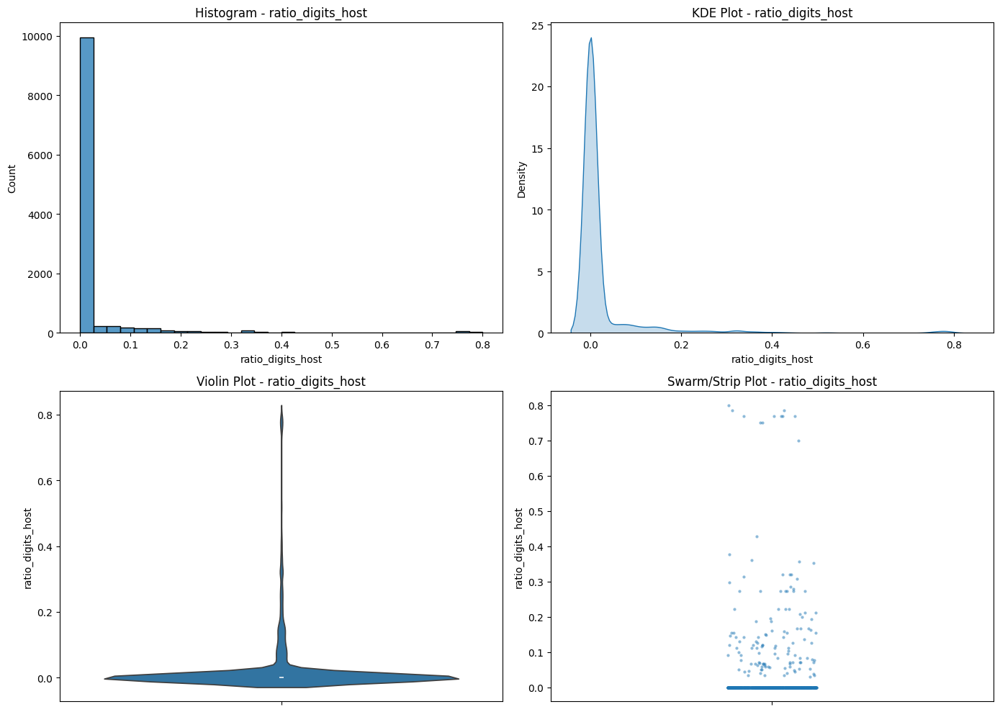

Feature: punycode
  Skewness: 53.43  (Skewed: Right)
  Kurtosis: 2852.50  (Flat: False, Peaked: True)
----------------------------------------


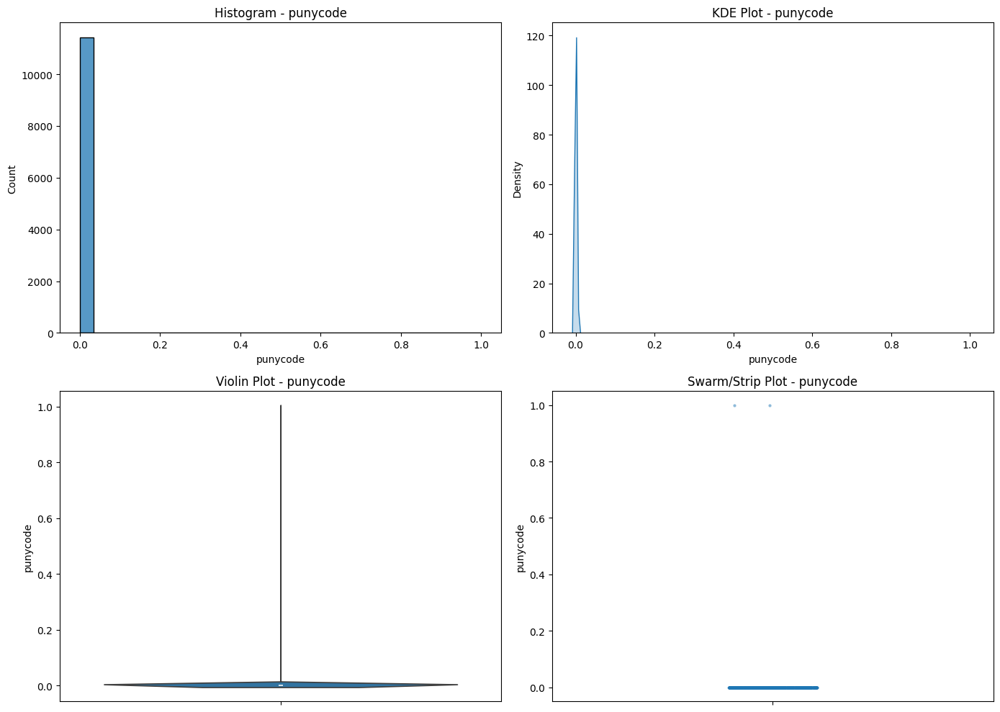

Feature: port
  Skewness: 20.50  (Skewed: Right)
  Kurtosis: 418.34  (Flat: False, Peaked: True)
----------------------------------------


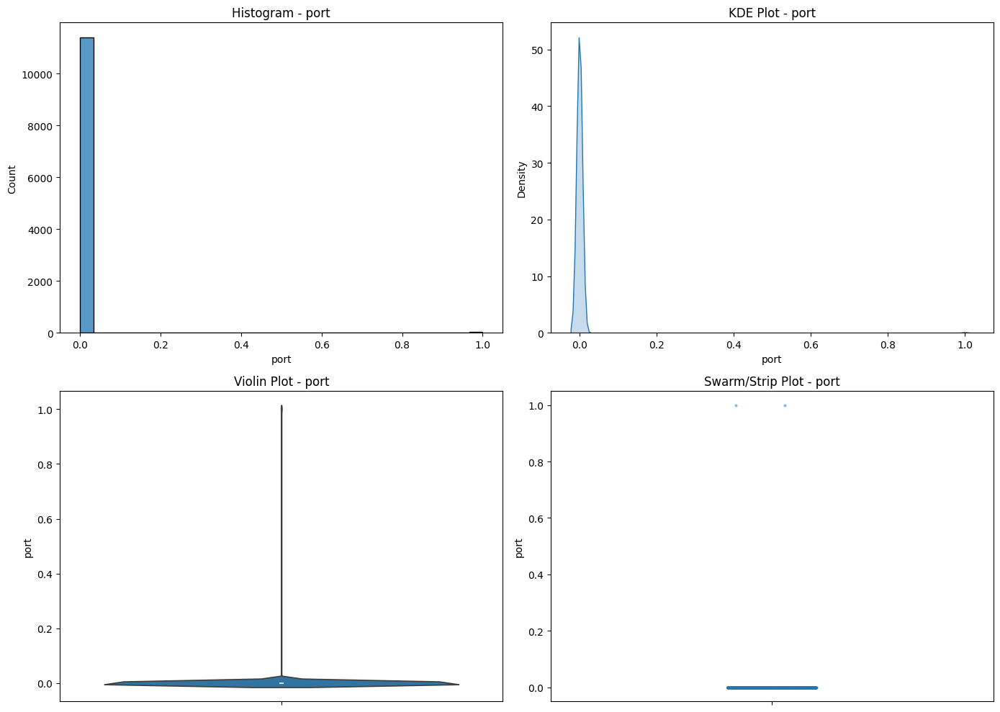

Feature: tld_in_path
  Skewness: 3.51  (Skewed: Right)
  Kurtosis: 10.31  (Flat: False, Peaked: True)
----------------------------------------


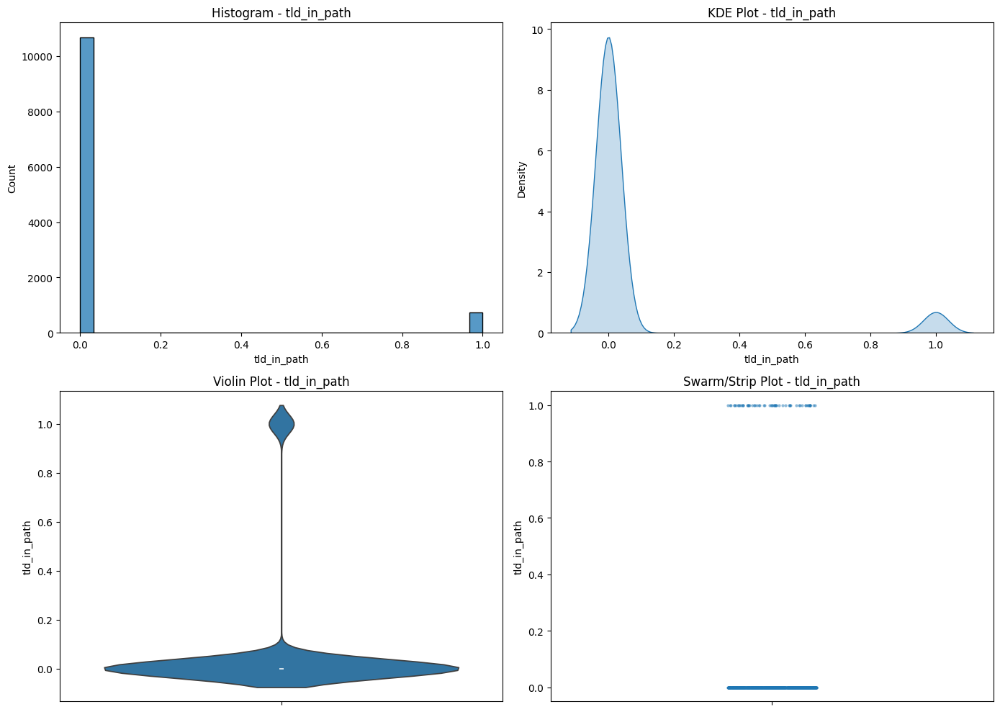

Feature: tld_in_subdomain
  Skewness: 4.12  (Skewed: Right)
  Kurtosis: 15.00  (Flat: False, Peaked: True)
----------------------------------------


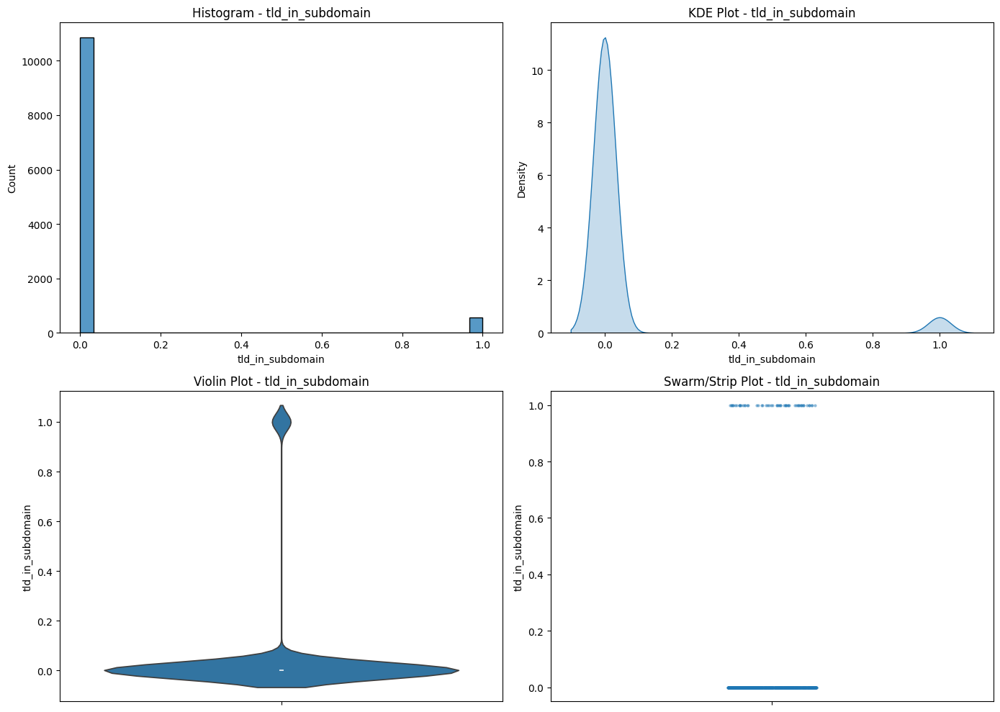

Feature: abnormal_subdomain
  Skewness: 6.58  (Skewed: Right)
  Kurtosis: 41.30  (Flat: False, Peaked: True)
----------------------------------------


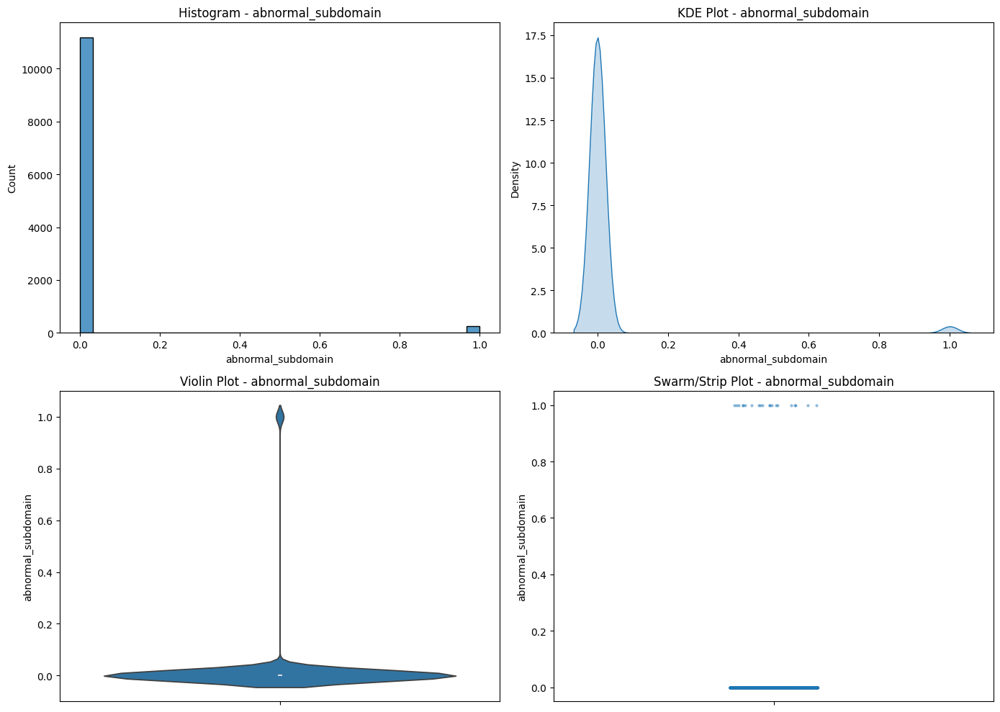

Feature: nb_subdomains
  Skewness: -0.24  (Skewed: Left)
  Kurtosis: -0.67  (Flat: True, Peaked: False)
----------------------------------------


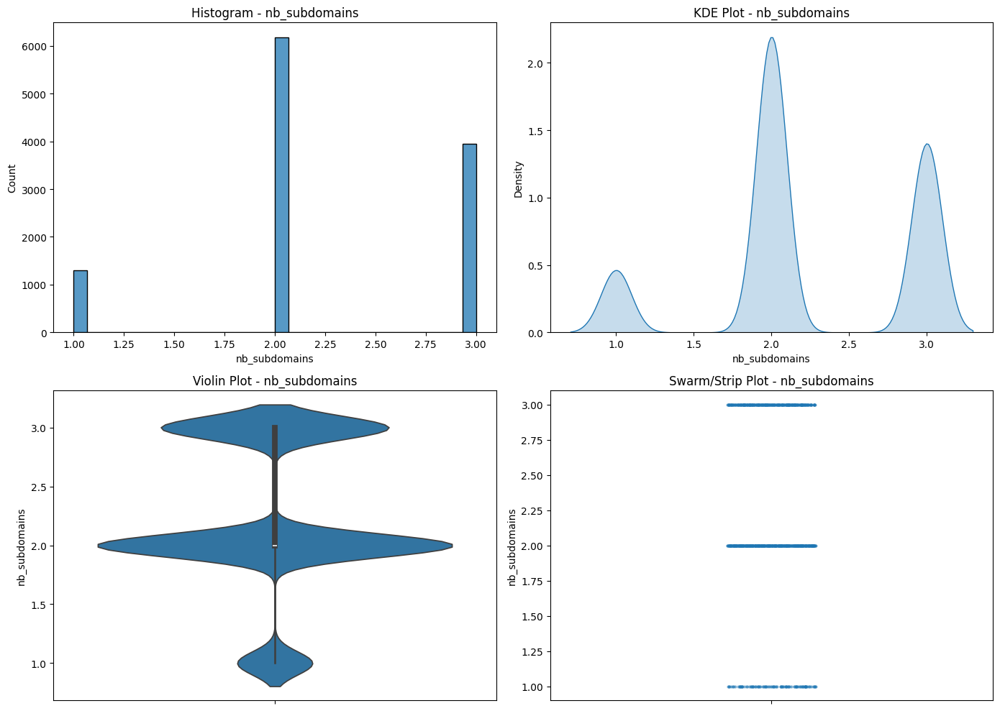

Feature: prefix_suffix
  Skewness: 1.48  (Skewed: Right)
  Kurtosis: 0.19  (Flat: True, Peaked: False)
----------------------------------------


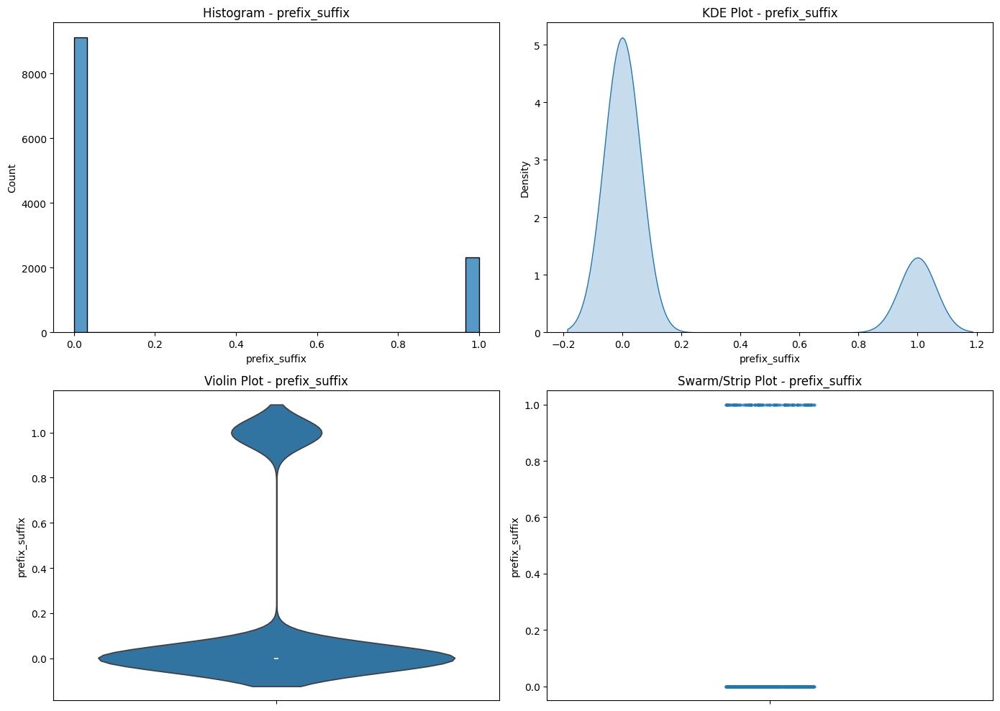

Feature: random_domain
  Skewness: 3.02  (Skewed: Right)
  Kurtosis: 7.10  (Flat: False, Peaked: True)
----------------------------------------


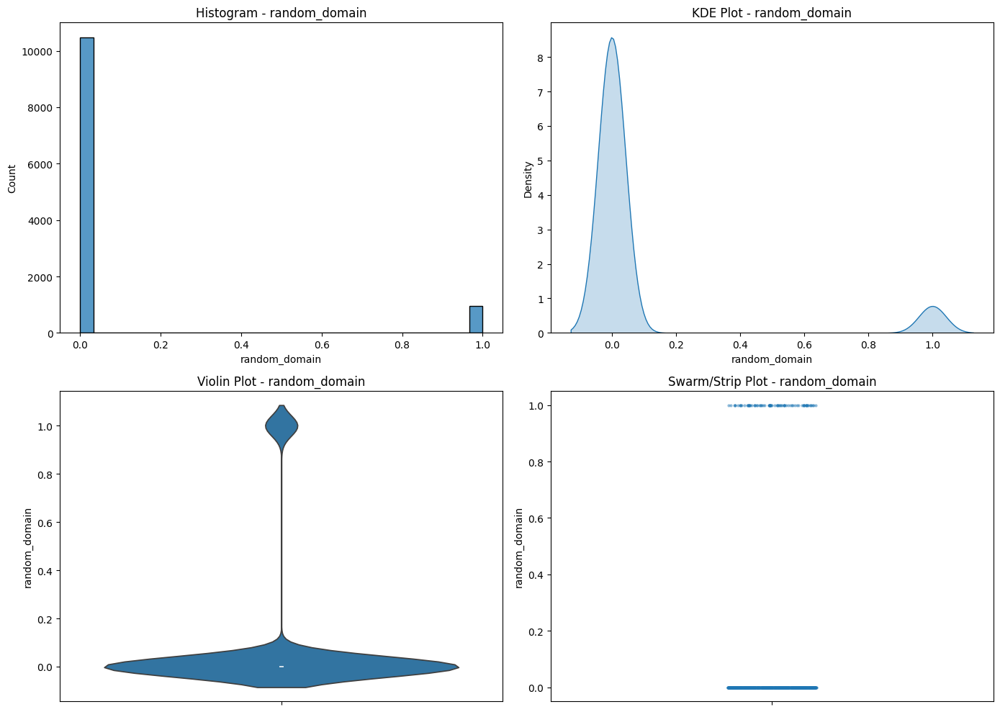

Feature: shortening_service
  Skewness: 2.29  (Skewed: Right)
  Kurtosis: 3.24  (Flat: False, Peaked: True)
----------------------------------------


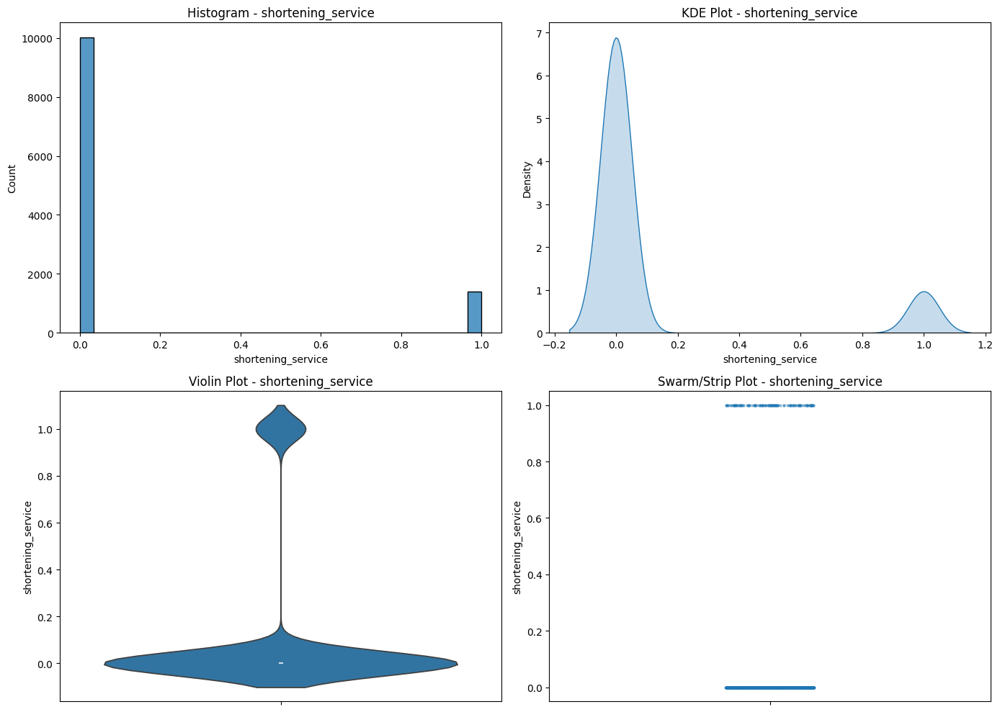

Feature: path_extension
  Skewness: 75.58  (Skewed: Right)
  Kurtosis: 5710.00  (Flat: False, Peaked: True)
----------------------------------------


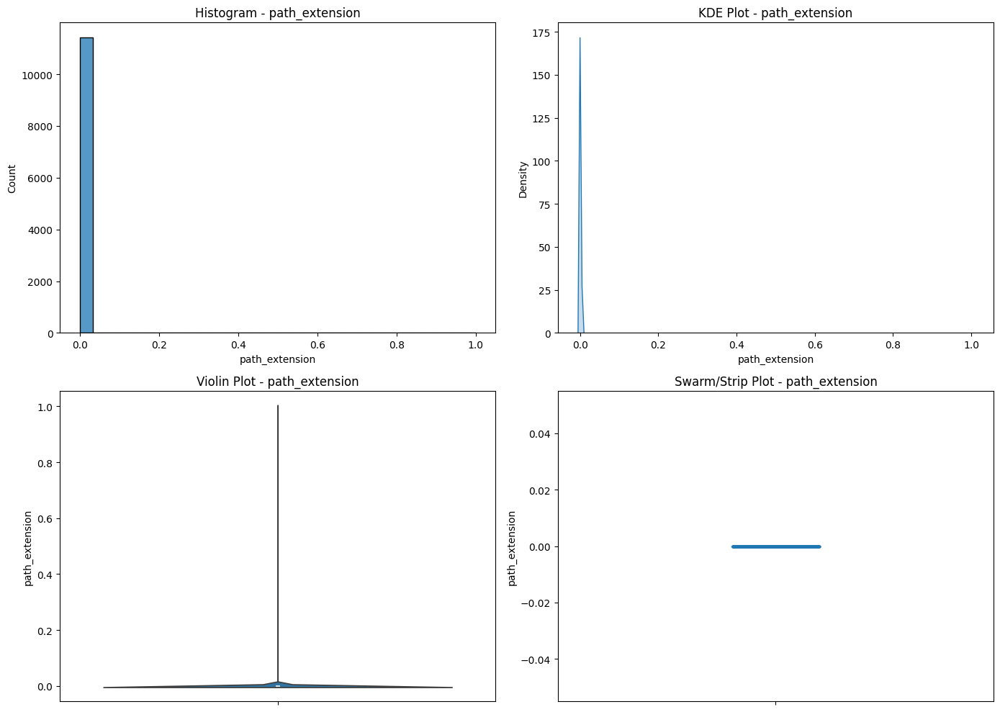

Feature: nb_redirection
  Skewness: 1.57  (Skewed: Right)
  Kurtosis: 3.52  (Flat: False, Peaked: True)
----------------------------------------


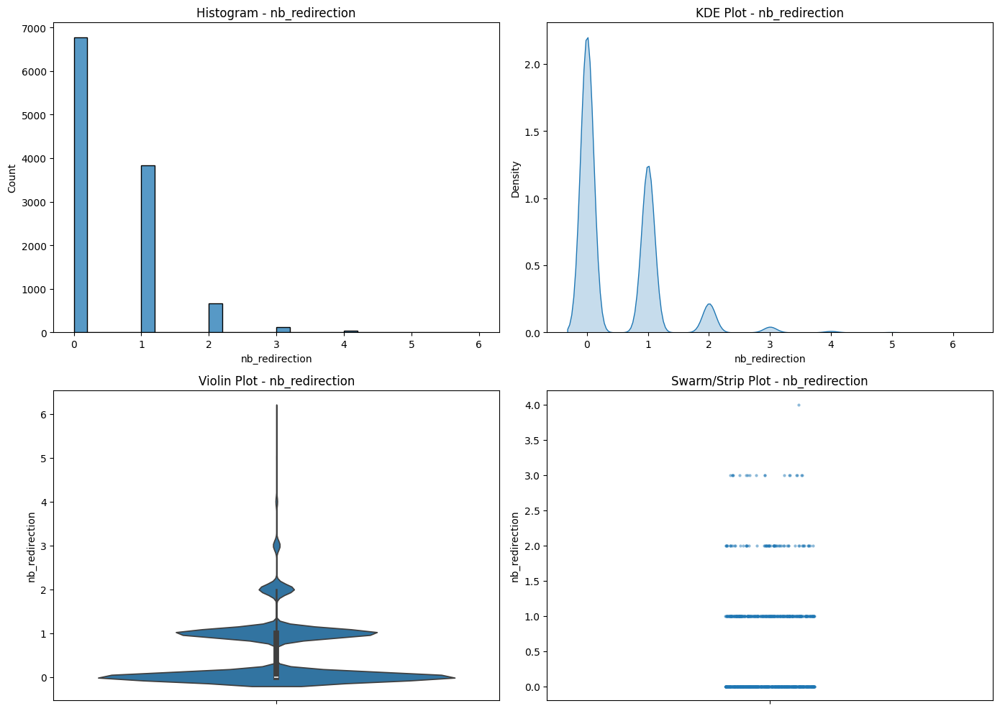

Feature: nb_external_redirection
  Skewness: 17.73  (Skewed: Right)
  Kurtosis: 312.50  (Flat: False, Peaked: True)
----------------------------------------


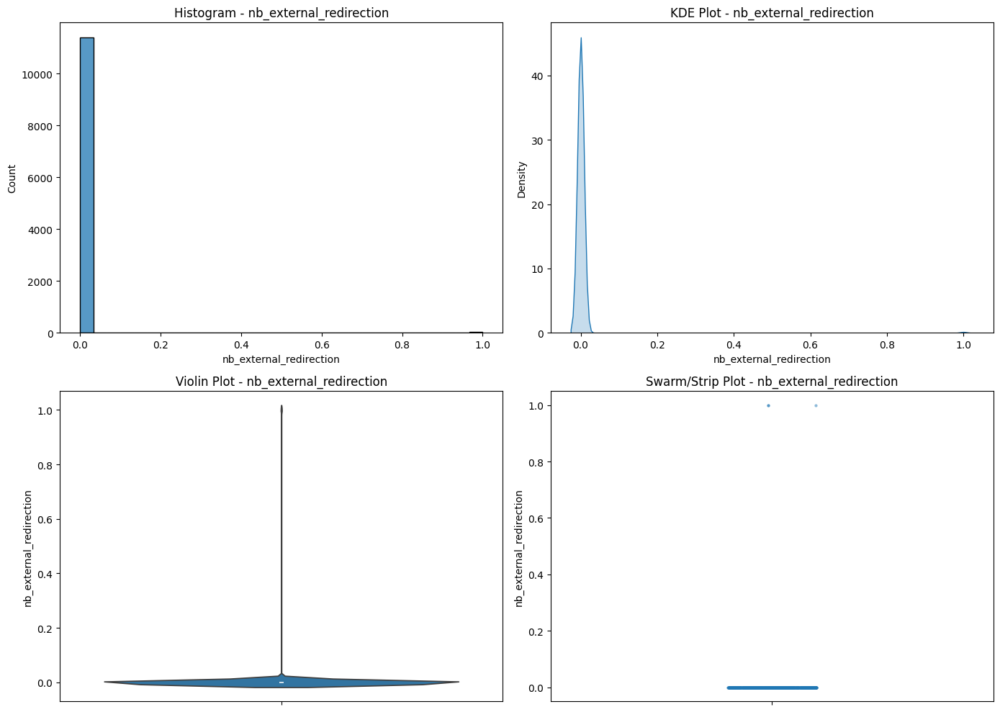

Feature: length_words_raw
  Skewness: 5.37  (Skewed: Right)
  Kurtosis: 60.74  (Flat: False, Peaked: True)
----------------------------------------


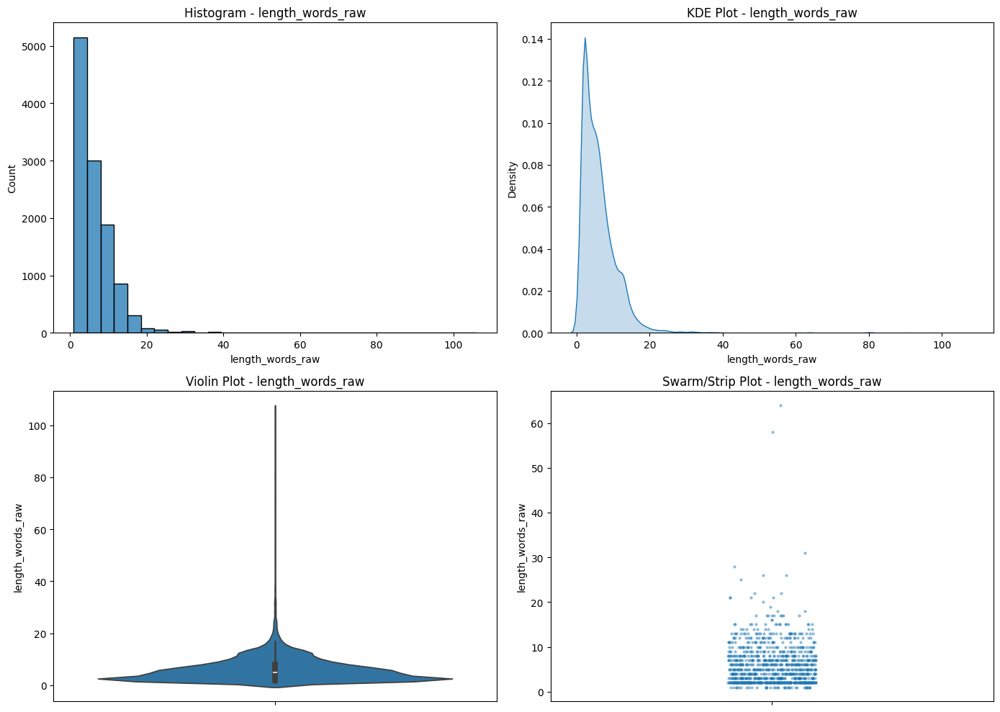

Feature: char_repeat
  Skewness: 15.75  (Skewed: Right)
  Kurtosis: 393.58  (Flat: False, Peaked: True)
----------------------------------------


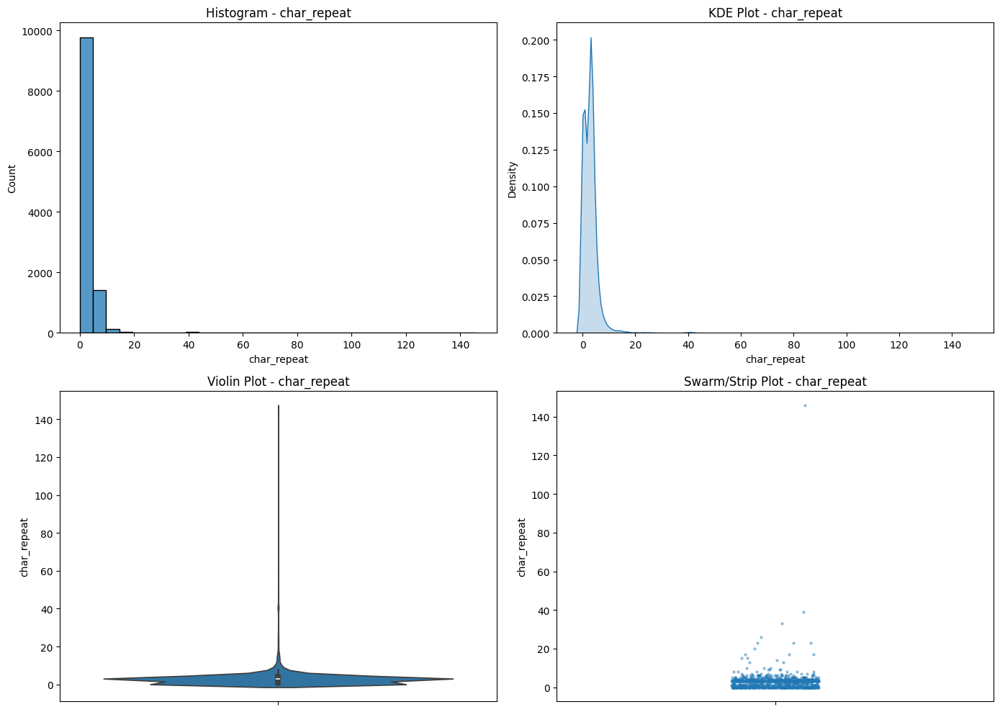

Feature: shortest_words_raw
  Skewness: 3.16  (Skewed: Right)
  Kurtosis: 15.72  (Flat: False, Peaked: True)
----------------------------------------


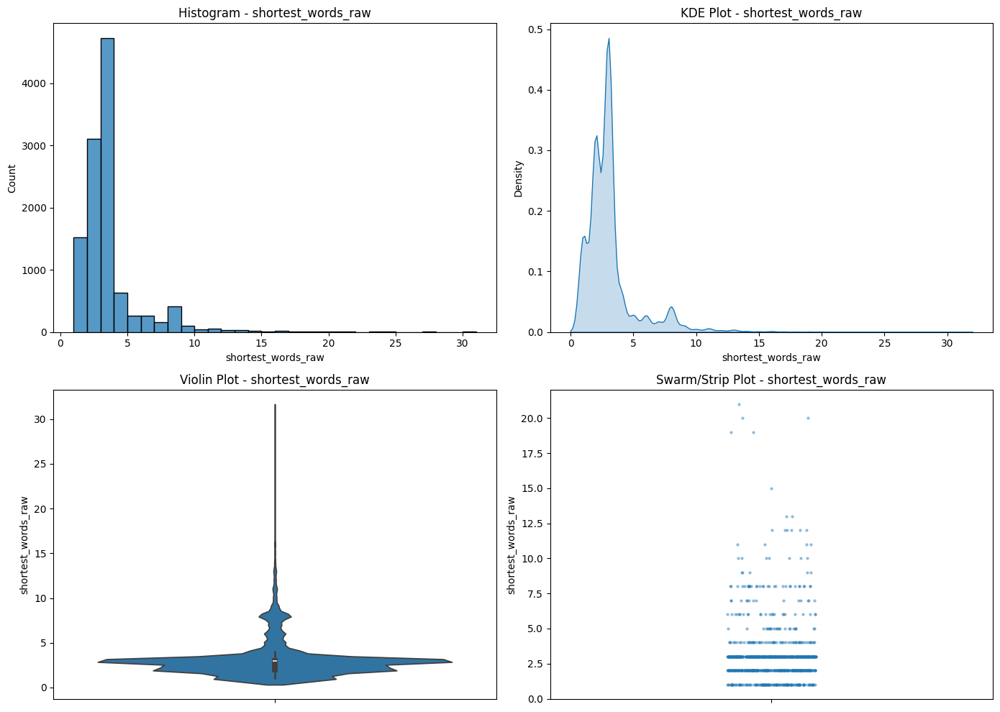

Feature: shortest_word_host
  Skewness: 2.27  (Skewed: Right)
  Kurtosis: 6.95  (Flat: False, Peaked: True)
----------------------------------------


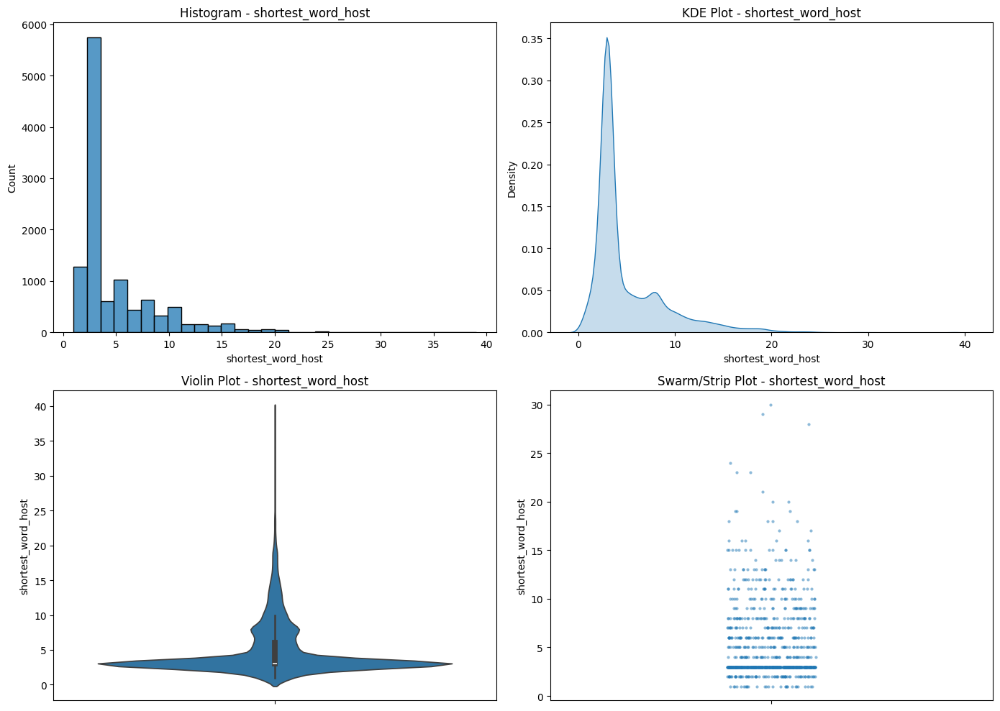

Feature: shortest_word_path
  Skewness: 4.69  (Skewed: Right)
  Kurtosis: 38.26  (Flat: False, Peaked: True)
----------------------------------------


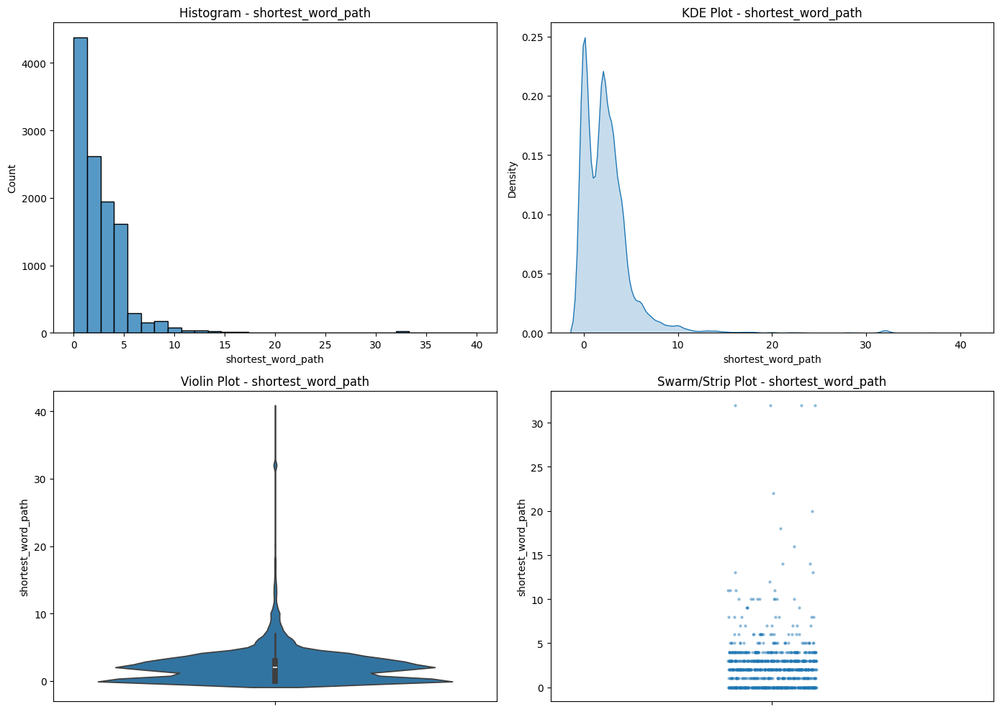

Feature: longest_words_raw
  Skewness: 13.53  (Skewed: Right)
  Kurtosis: 294.65  (Flat: False, Peaked: True)
----------------------------------------


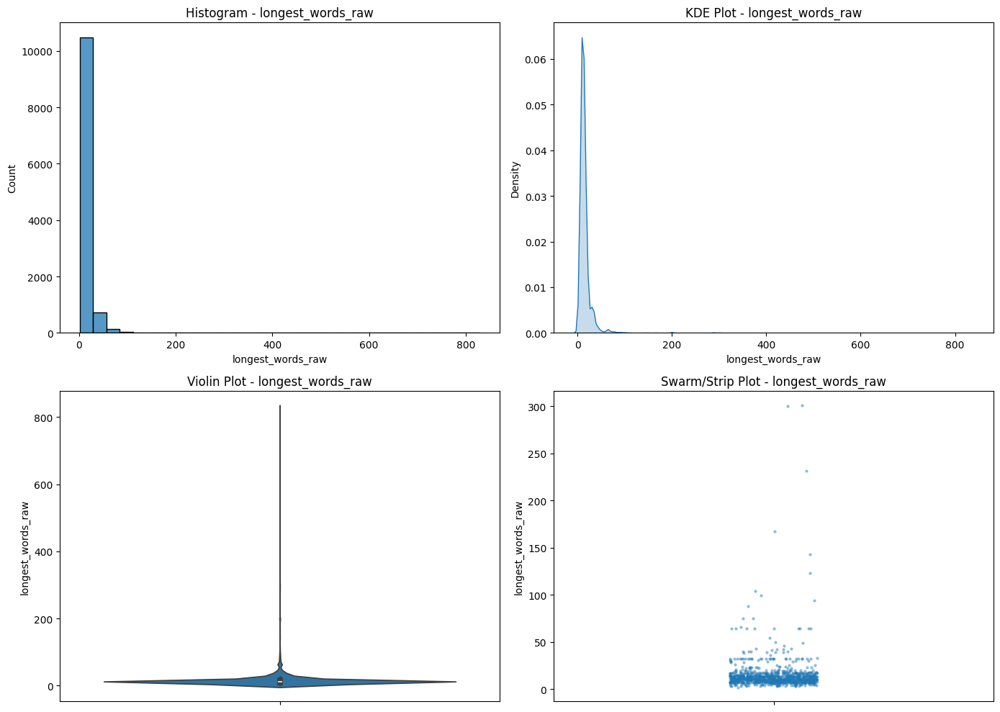

Feature: longest_word_host
  Skewness: 1.63  (Skewed: Right)
  Kurtosis: 7.20  (Flat: False, Peaked: True)
----------------------------------------


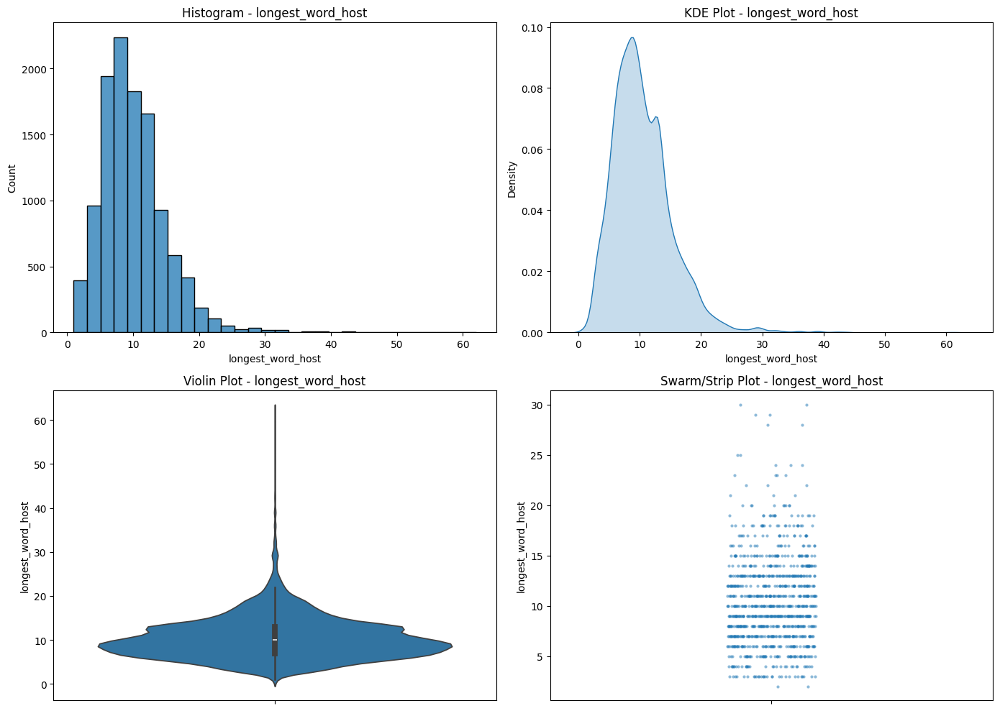

Feature: longest_word_path
  Skewness: 12.39  (Skewed: Right)
  Kurtosis: 256.75  (Flat: False, Peaked: True)
----------------------------------------


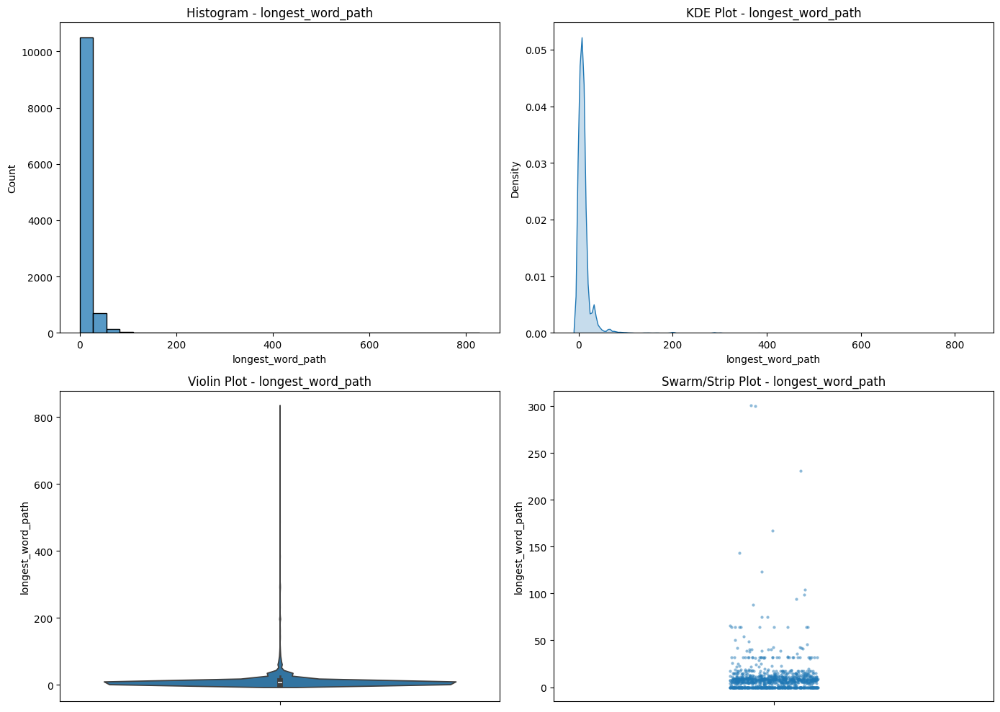

Feature: avg_words_raw
  Skewness: 9.55  (Skewed: Right)
  Kurtosis: 189.37  (Flat: False, Peaked: True)
----------------------------------------


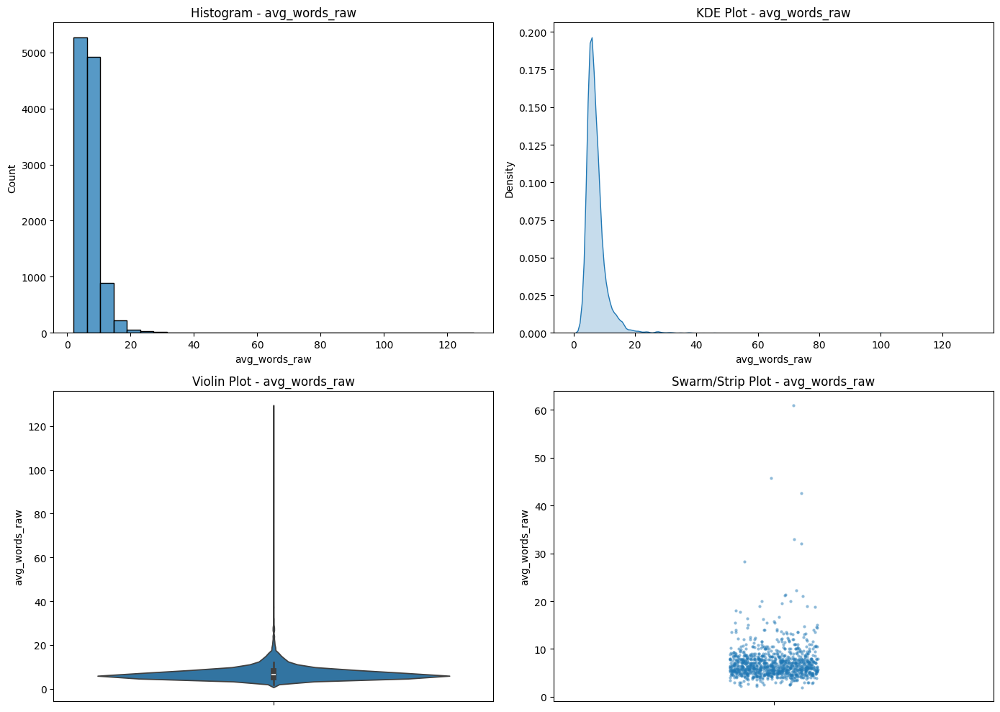

Feature: avg_word_host
  Skewness: 1.75  (Skewed: Right)
  Kurtosis: 5.93  (Flat: False, Peaked: True)
----------------------------------------


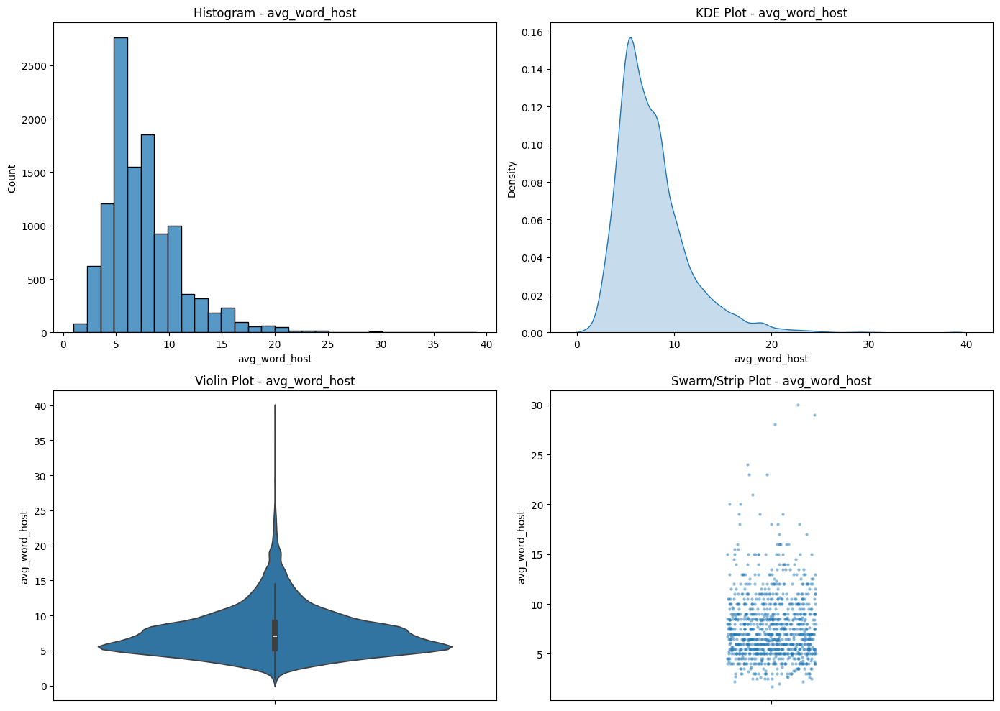

Feature: avg_word_path
  Skewness: 13.44  (Skewed: Right)
  Kurtosis: 335.96  (Flat: False, Peaked: True)
----------------------------------------


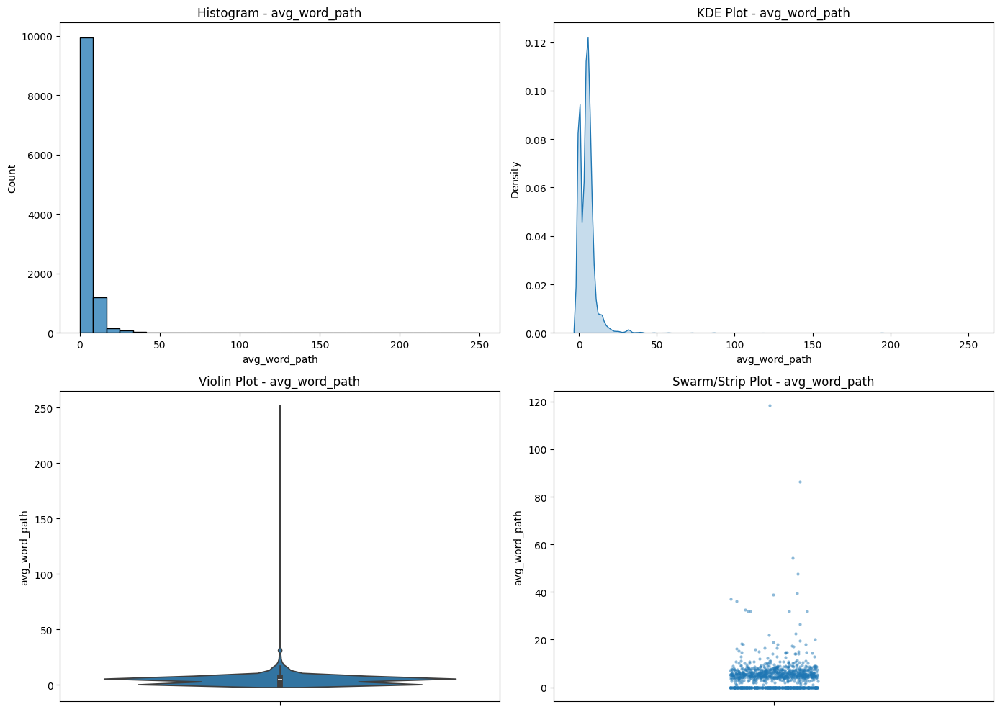

Feature: phish_hints
  Skewness: 3.22  (Skewed: Right)
  Kurtosis: 12.51  (Flat: False, Peaked: True)
----------------------------------------


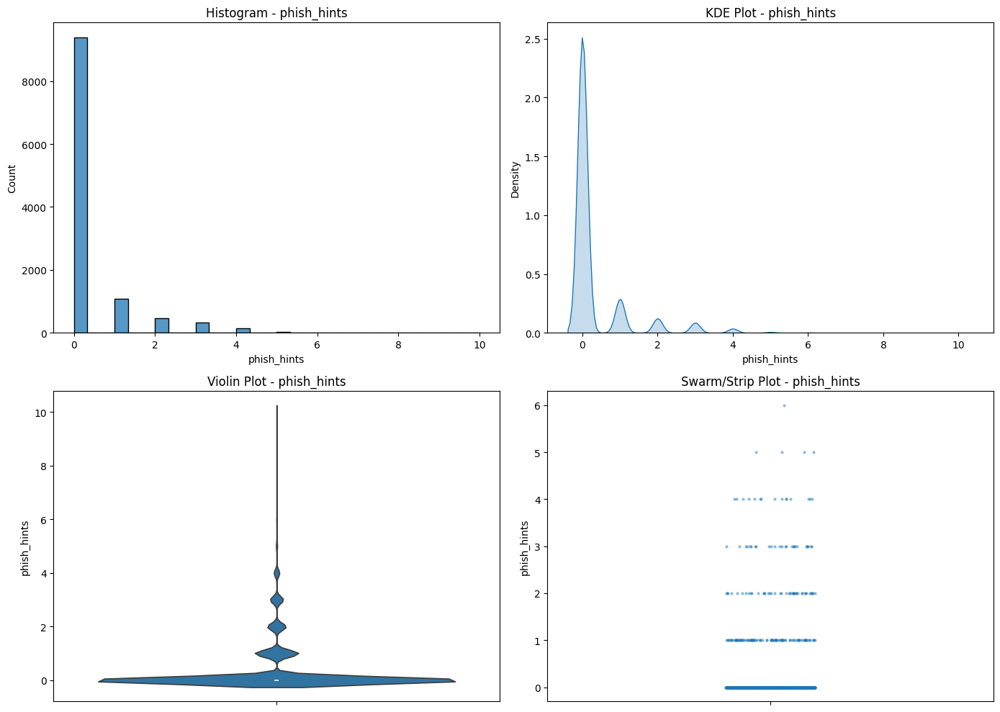

Feature: domain_in_brand
  Skewness: 2.59  (Skewed: Right)
  Kurtosis: 4.71  (Flat: False, Peaked: True)
----------------------------------------


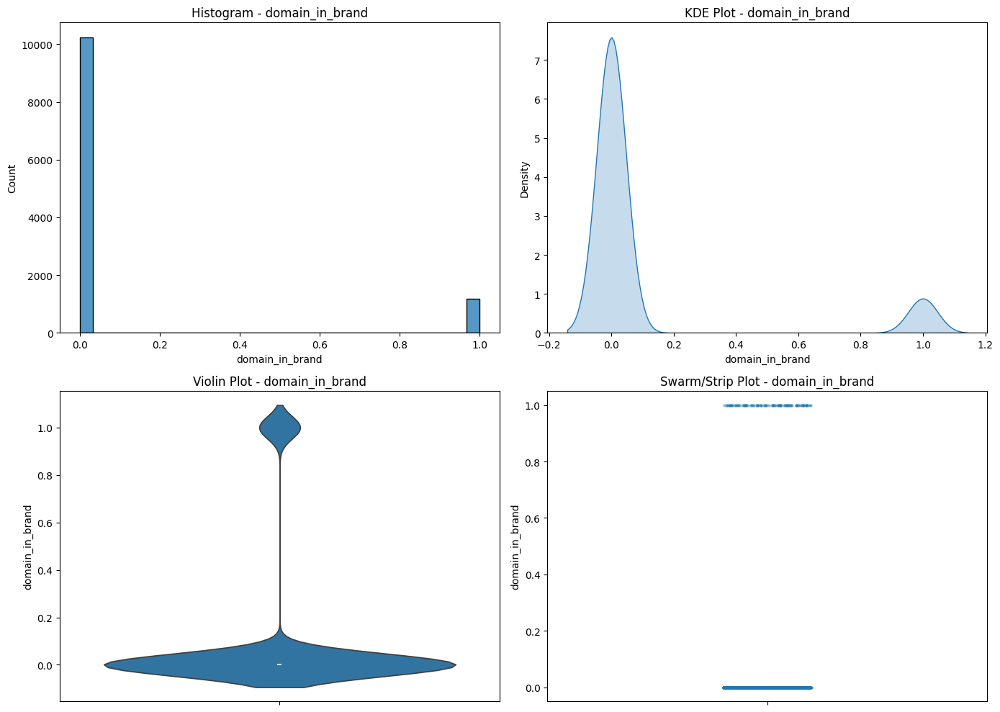

Feature: brand_in_subdomain
  Skewness: 15.50  (Skewed: Right)
  Kurtosis: 238.20  (Flat: False, Peaked: True)
----------------------------------------


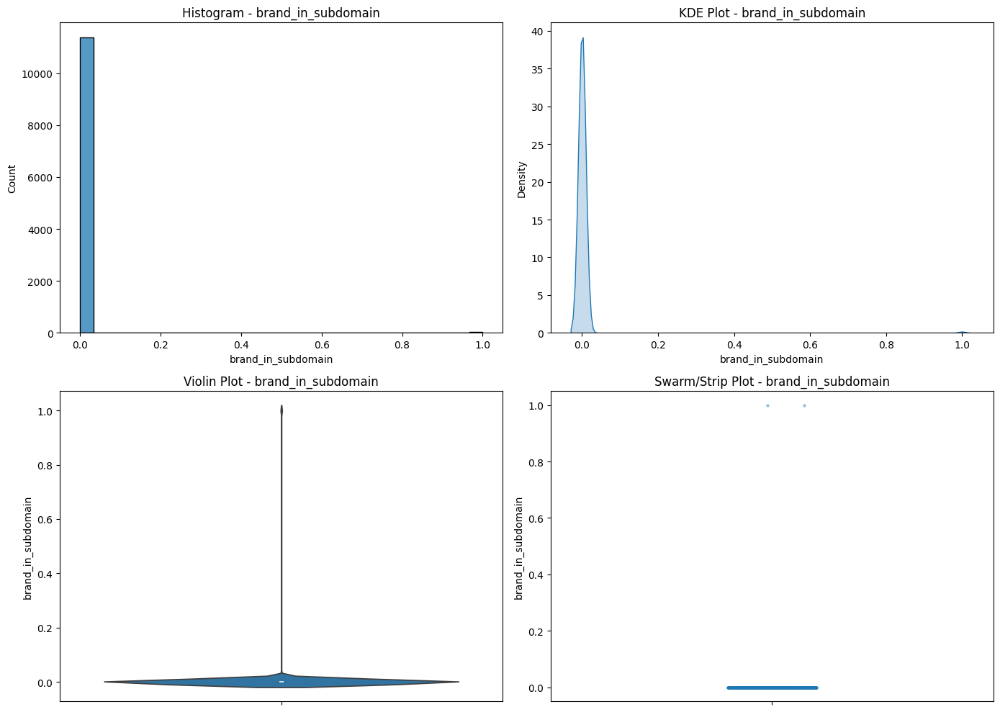

Feature: brand_in_path
  Skewness: 14.18  (Skewed: Right)
  Kurtosis: 199.11  (Flat: False, Peaked: True)
----------------------------------------


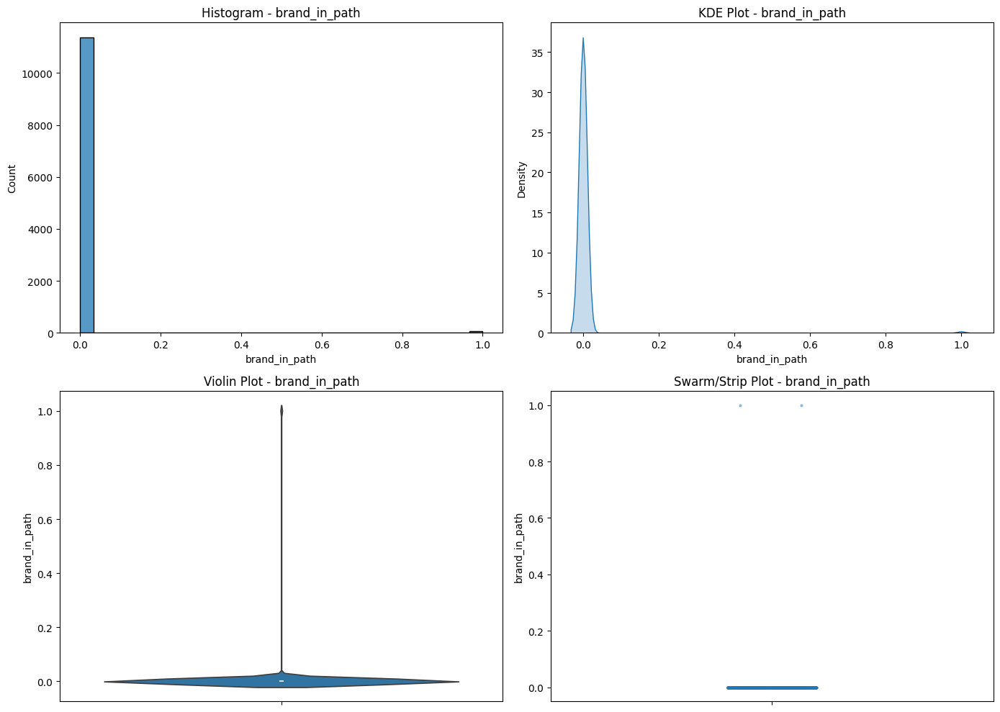

Feature: suspecious_tld
  Skewness: 7.26  (Skewed: Right)
  Kurtosis: 50.77  (Flat: False, Peaked: True)
----------------------------------------


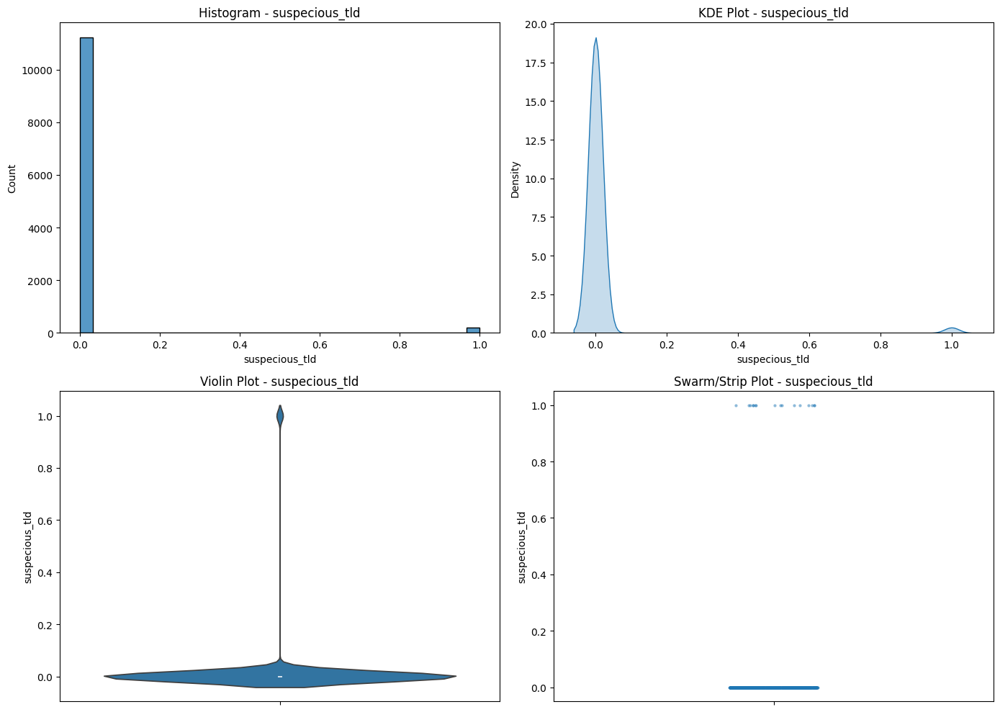

Feature: statistical_report
  Skewness: 5.52  (Skewed: Right)
  Kurtosis: 28.92  (Flat: False, Peaked: True)
----------------------------------------


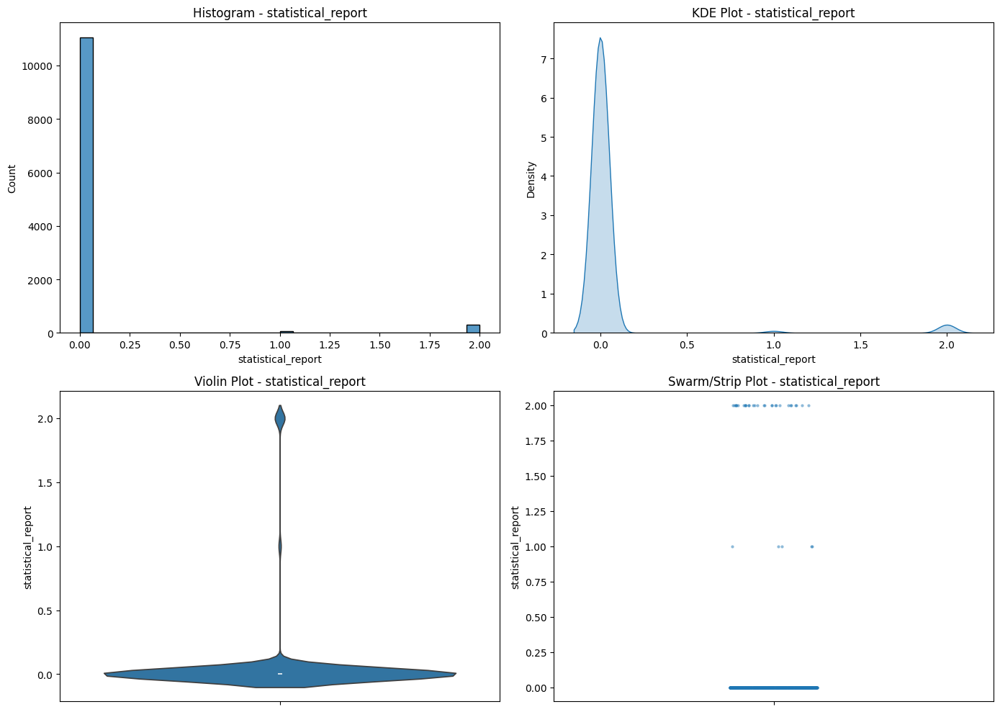

Feature: nb_hyperlinks
  Skewness: 7.67  (Skewed: Right)
  Kurtosis: 117.91  (Flat: False, Peaked: True)
----------------------------------------


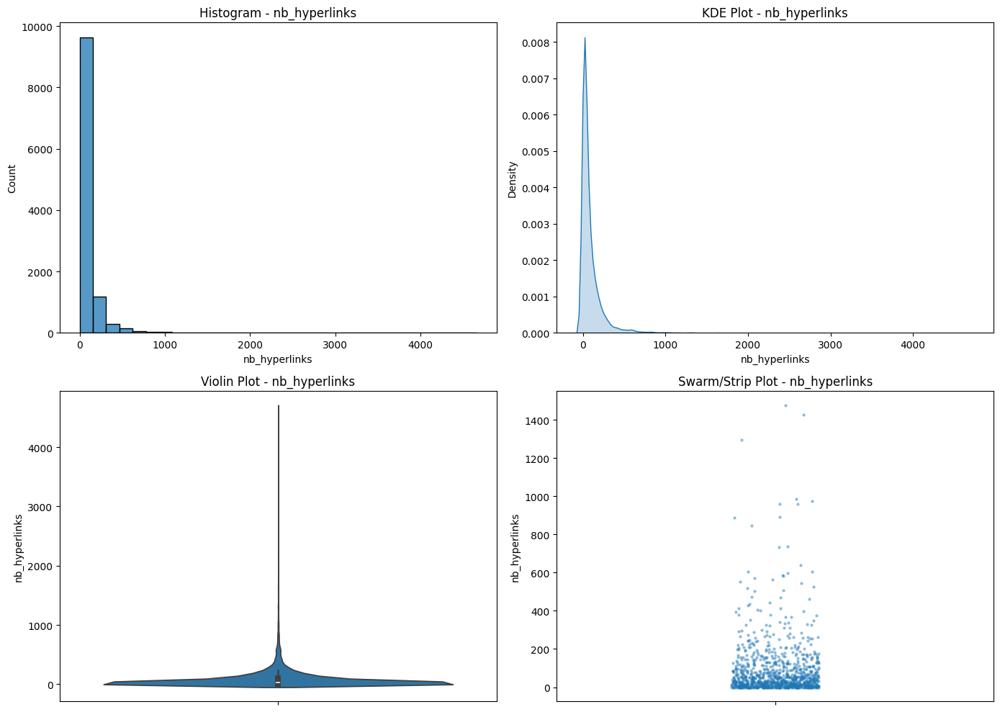

Feature: ratio_intHyperlinks
  Skewness: -0.53  (Skewed: Left)
  Kurtosis: -1.30  (Flat: True, Peaked: False)
----------------------------------------


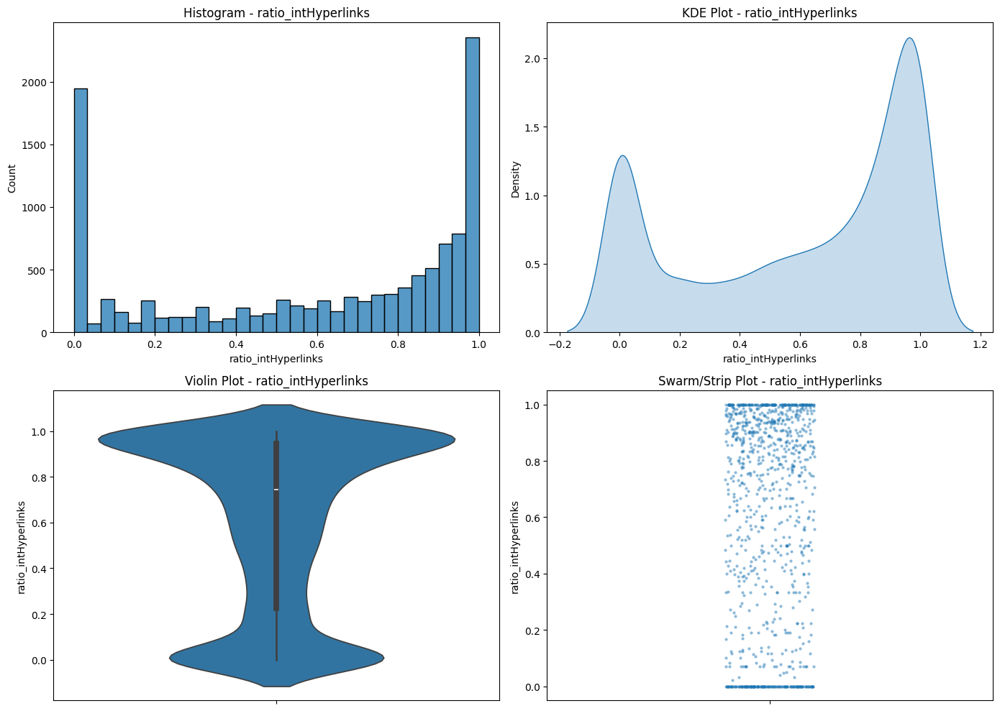

Feature: ratio_extHyperlinks
  Skewness: 1.01  (Skewed: Right)
  Kurtosis: -0.32  (Flat: True, Peaked: False)
----------------------------------------


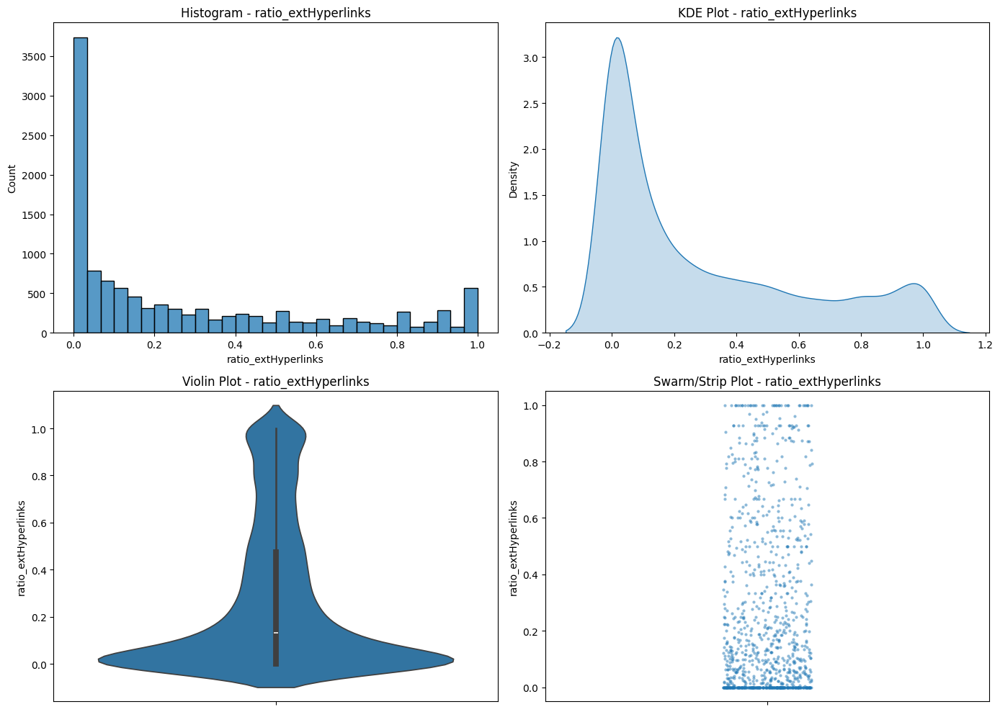

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: ratio_nullHyperlinks
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


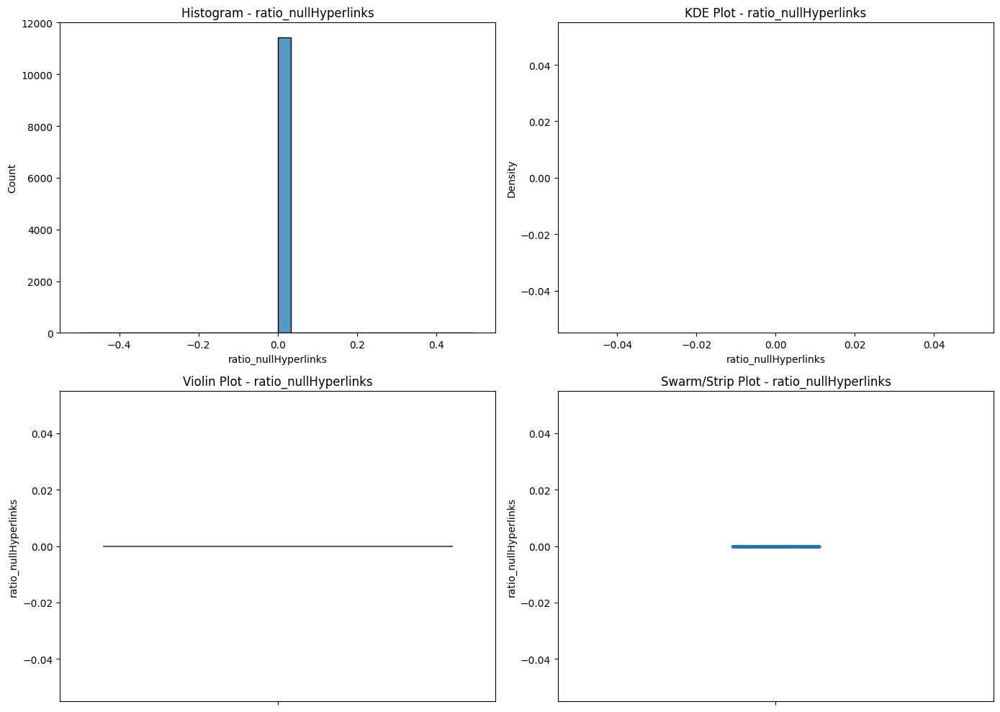

Feature: nb_extCSS
  Skewness: 23.49  (Skewed: Right)
  Kurtosis: 886.86  (Flat: False, Peaked: True)
----------------------------------------


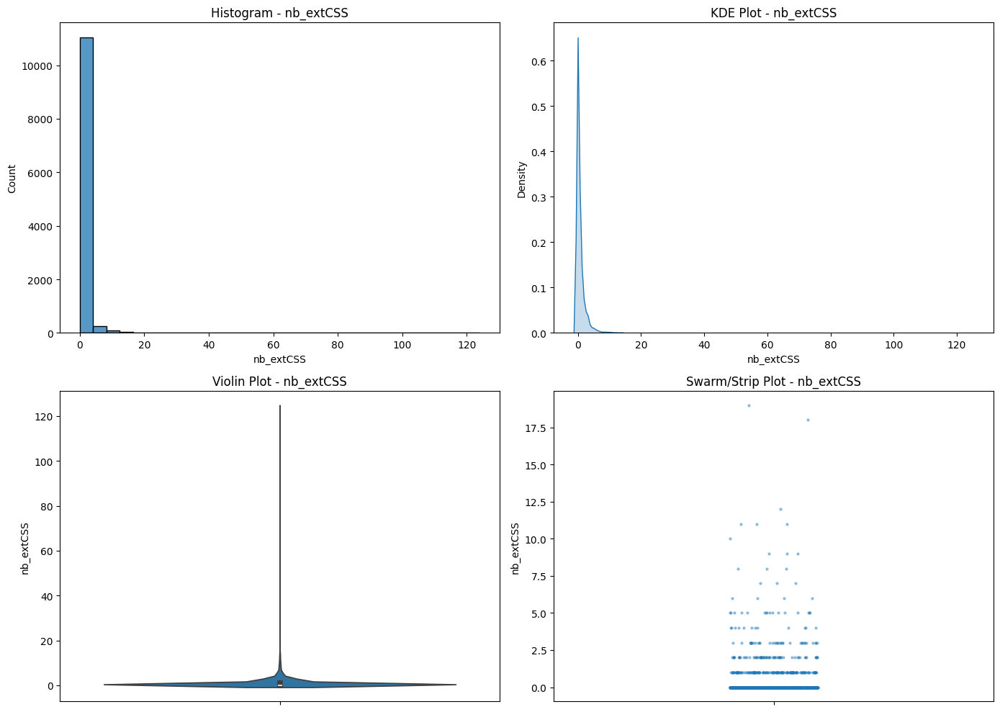

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: ratio_intRedirection
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


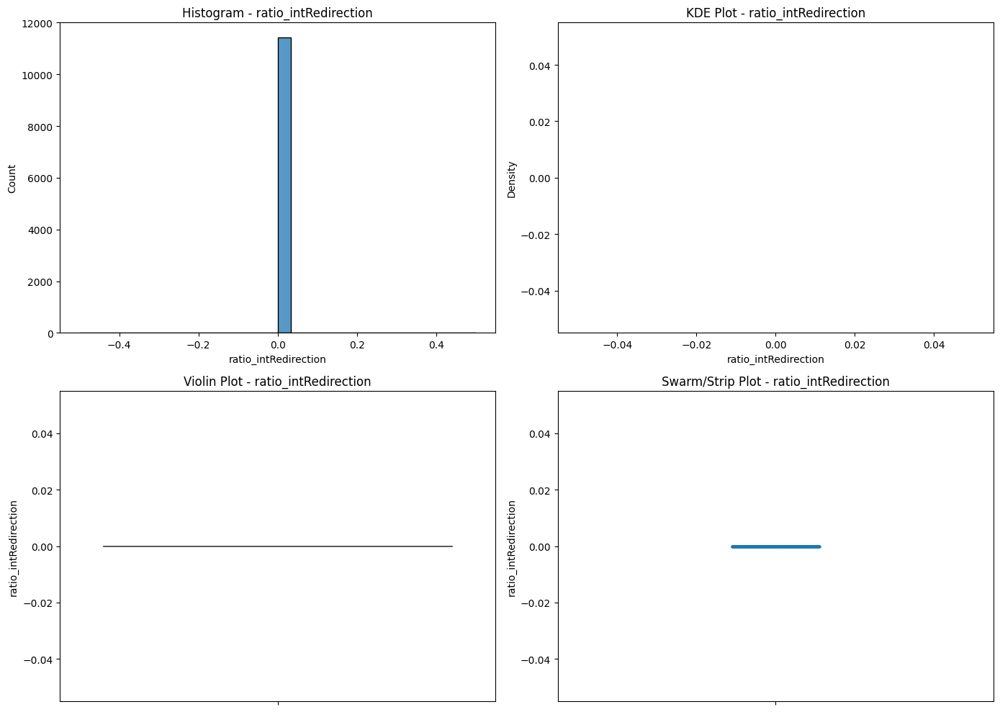

Feature: ratio_extRedirection
  Skewness: 2.30  (Skewed: Right)
  Kurtosis: 6.64  (Flat: False, Peaked: True)
----------------------------------------


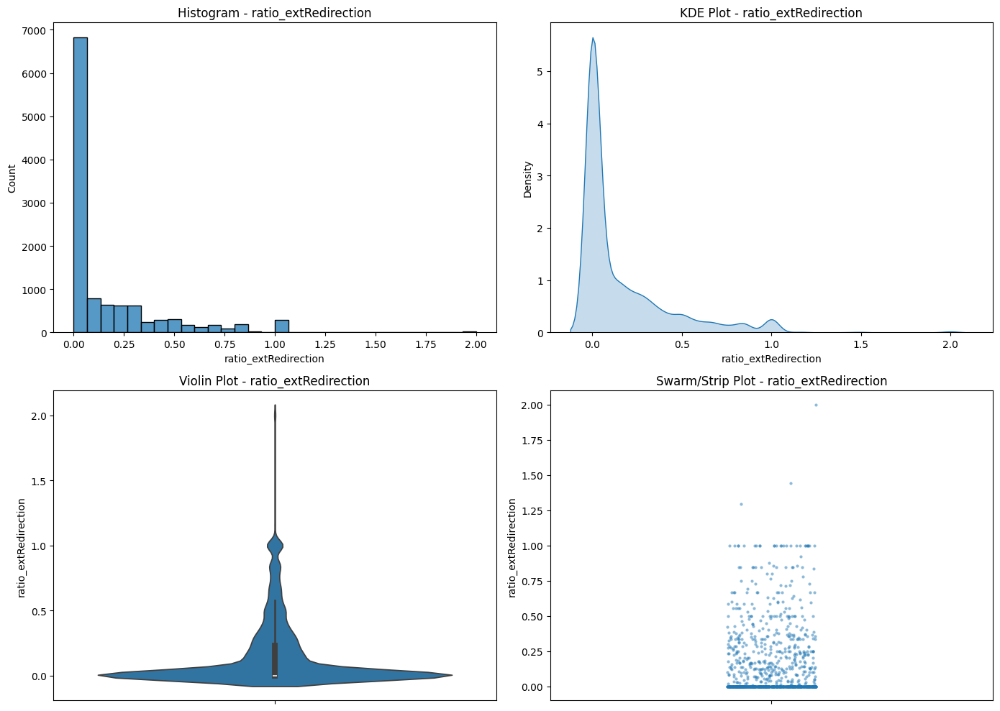

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: ratio_intErrors
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


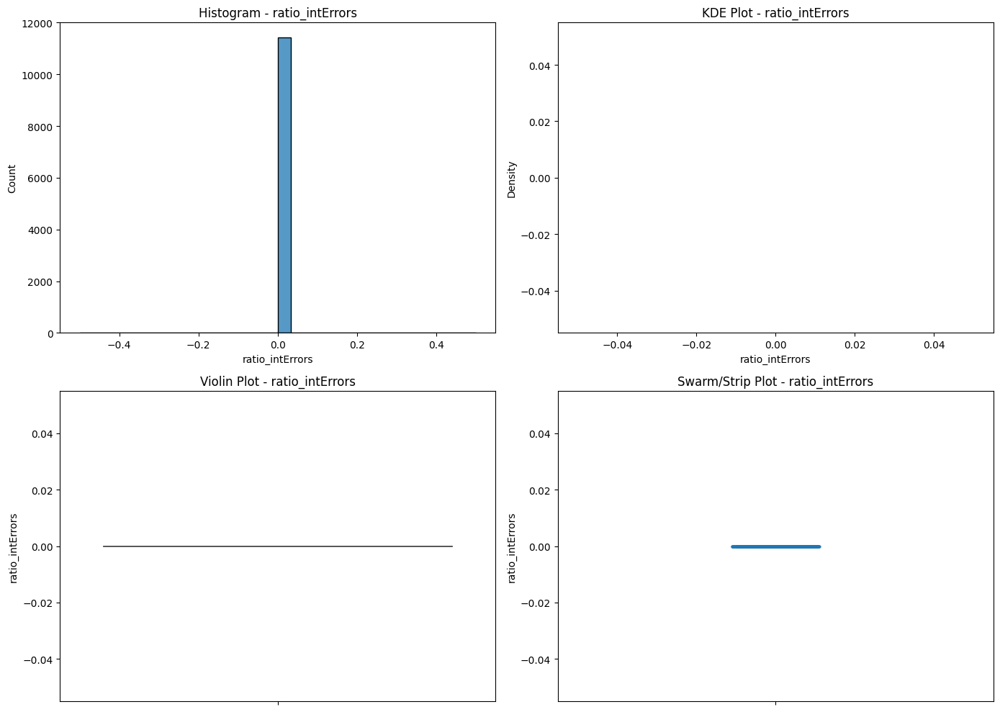

Feature: ratio_extErrors
  Skewness: 3.51  (Skewed: Right)
  Kurtosis: 13.62  (Flat: False, Peaked: True)
----------------------------------------


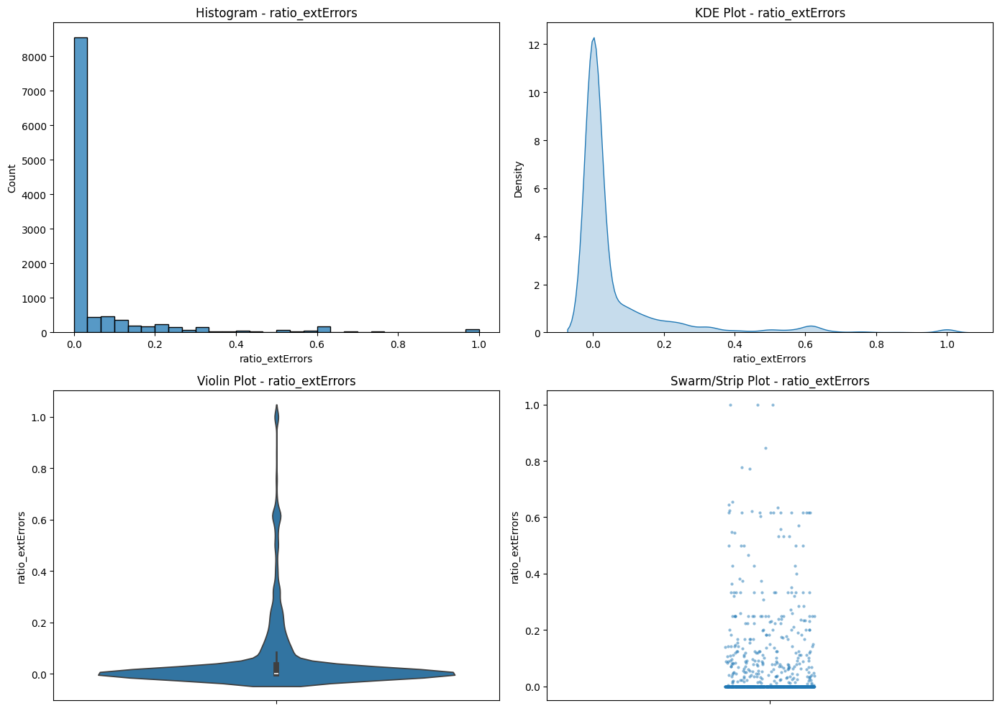

Feature: login_form
  Skewness: 3.58  (Skewed: Right)
  Kurtosis: 10.79  (Flat: False, Peaked: True)
----------------------------------------


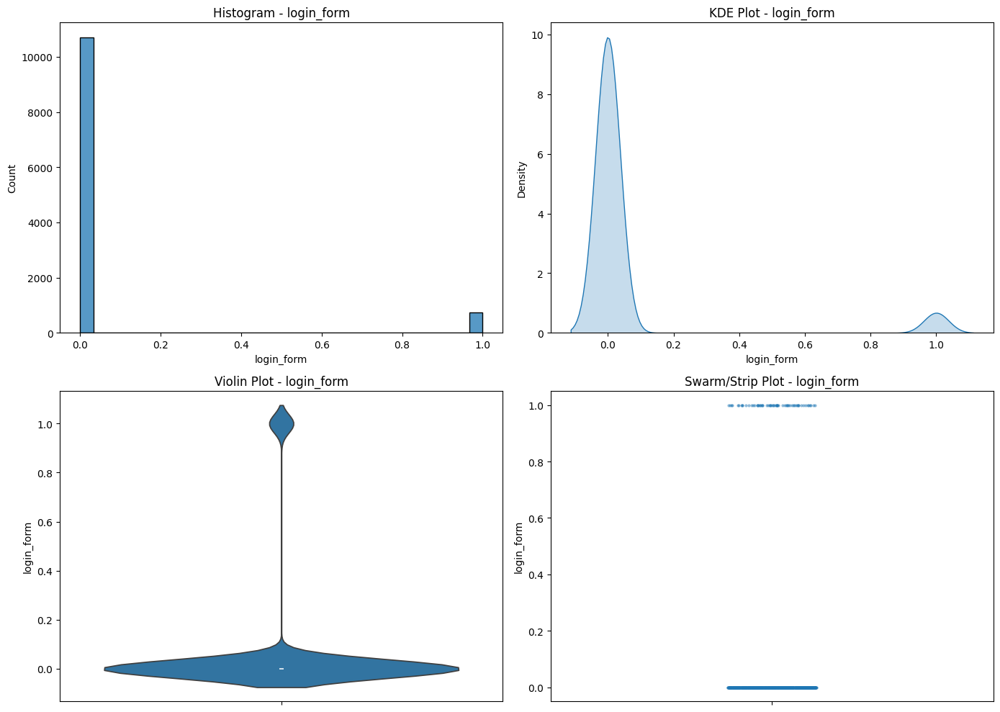

Feature: external_favicon
  Skewness: 0.23  (Skewed: Right)
  Kurtosis: -1.95  (Flat: True, Peaked: False)
----------------------------------------


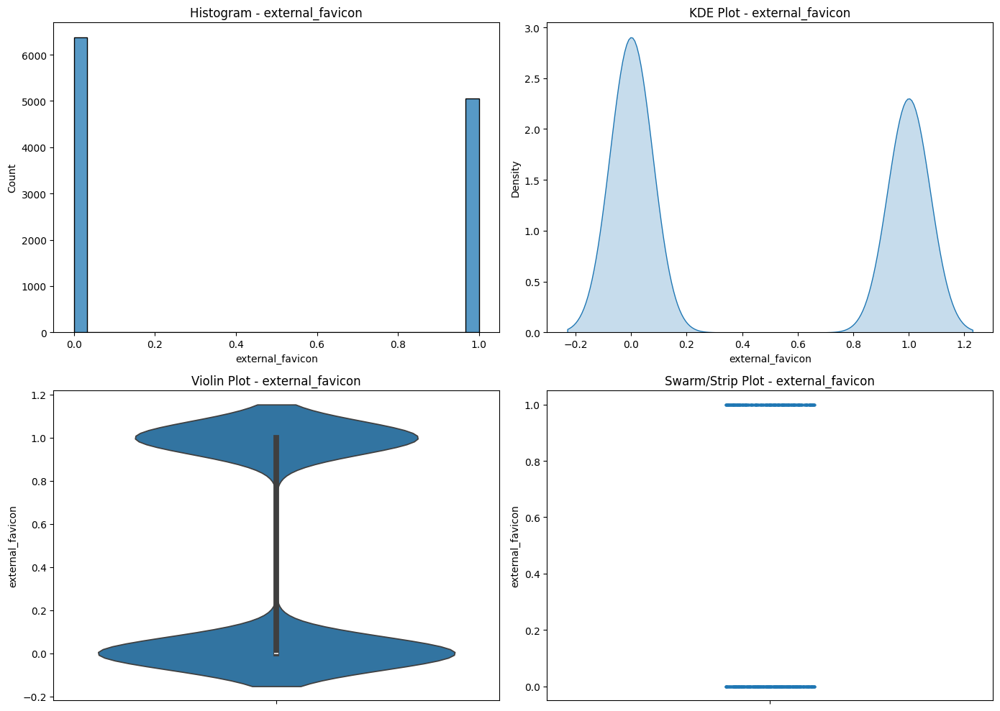

Feature: links_in_tags
  Skewness: -0.15  (Skewed: Left)
  Kurtosis: -1.67  (Flat: True, Peaked: False)
----------------------------------------


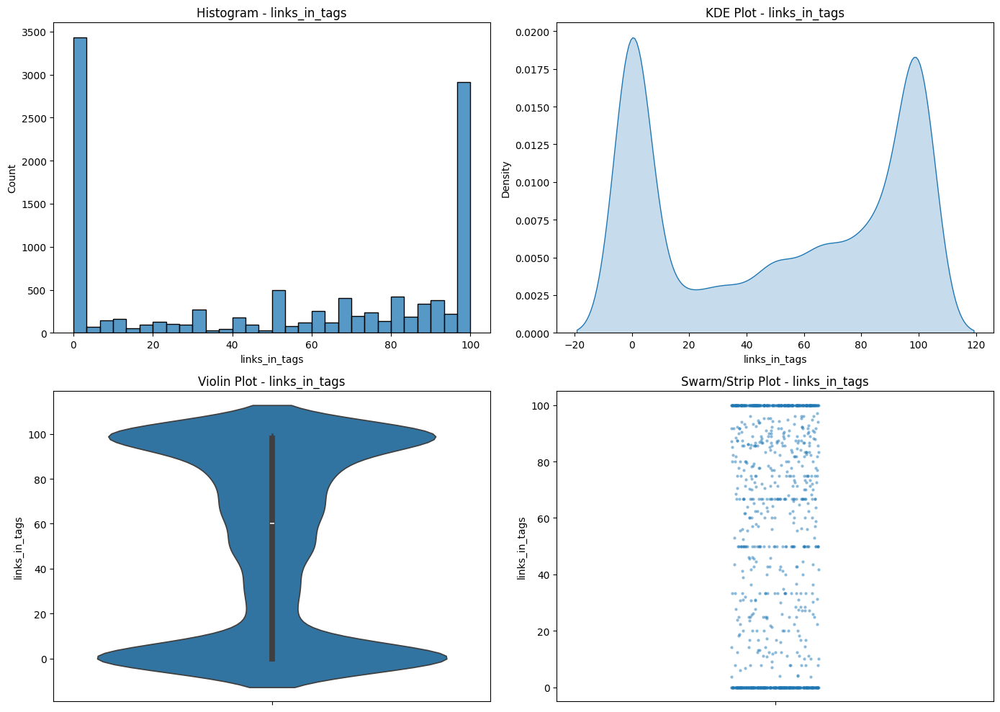

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: submit_email
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


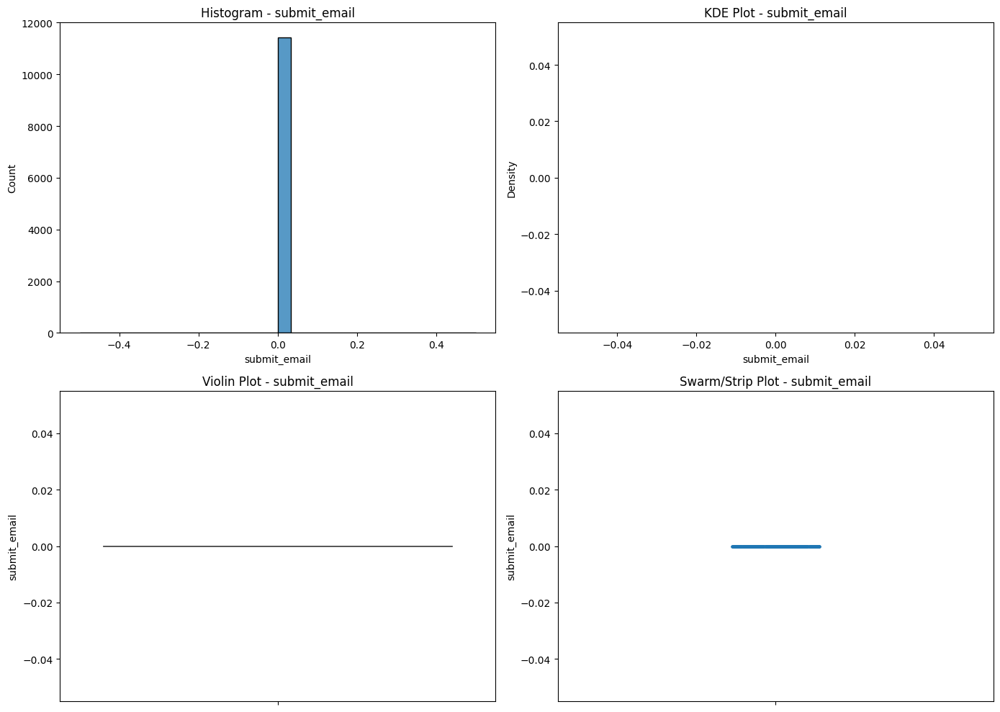

Feature: ratio_intMedia
  Skewness: 0.28  (Skewed: Right)
  Kurtosis: -1.82  (Flat: True, Peaked: False)
----------------------------------------


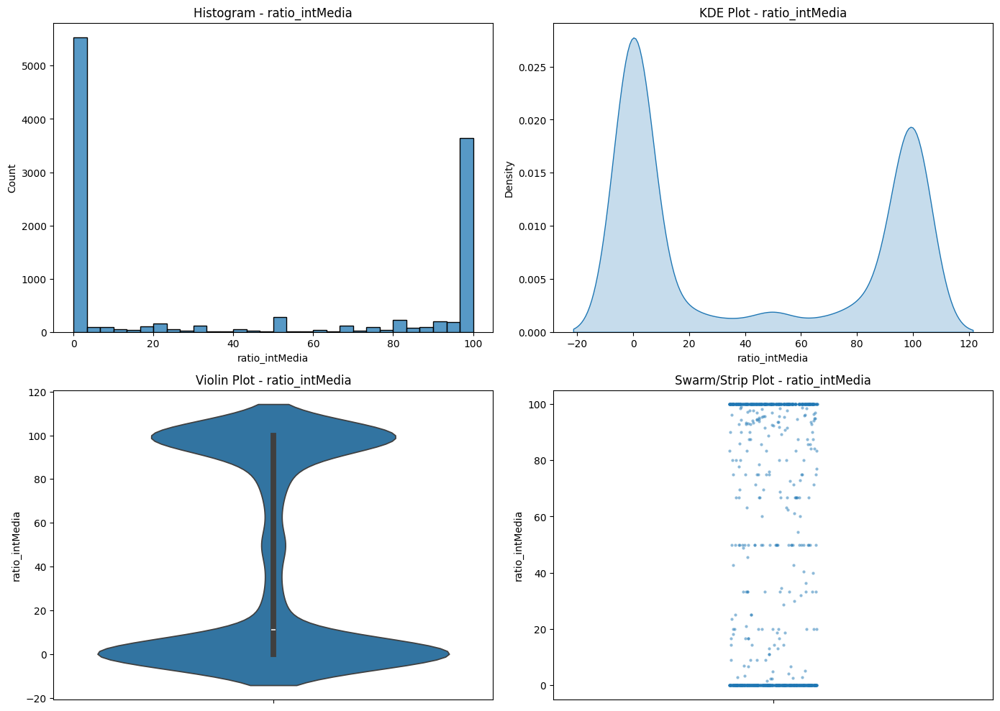

Feature: ratio_extMedia
  Skewness: 1.27  (Skewed: Right)
  Kurtosis: -0.20  (Flat: True, Peaked: False)
----------------------------------------


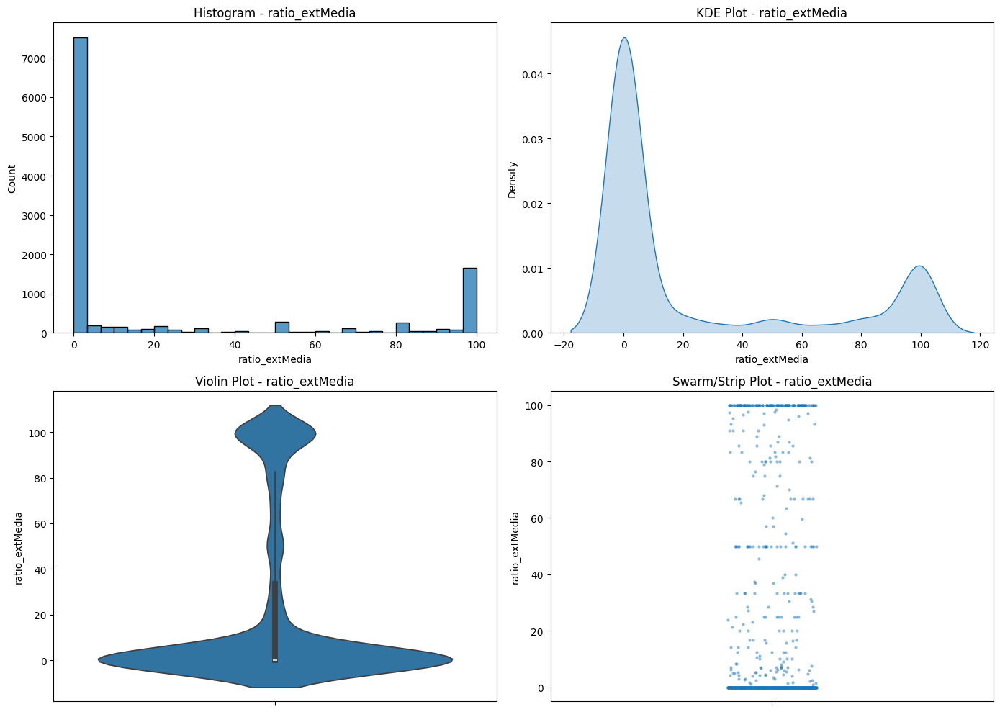

<ipython-input-29-5ae0edc9c3ba>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], fill=True, ax=axes[0, 1])


Feature: sfh
  Skewness: nan  (Skewed: Symmetric)
  Kurtosis: nan  (Flat: False, Peaked: False)
----------------------------------------


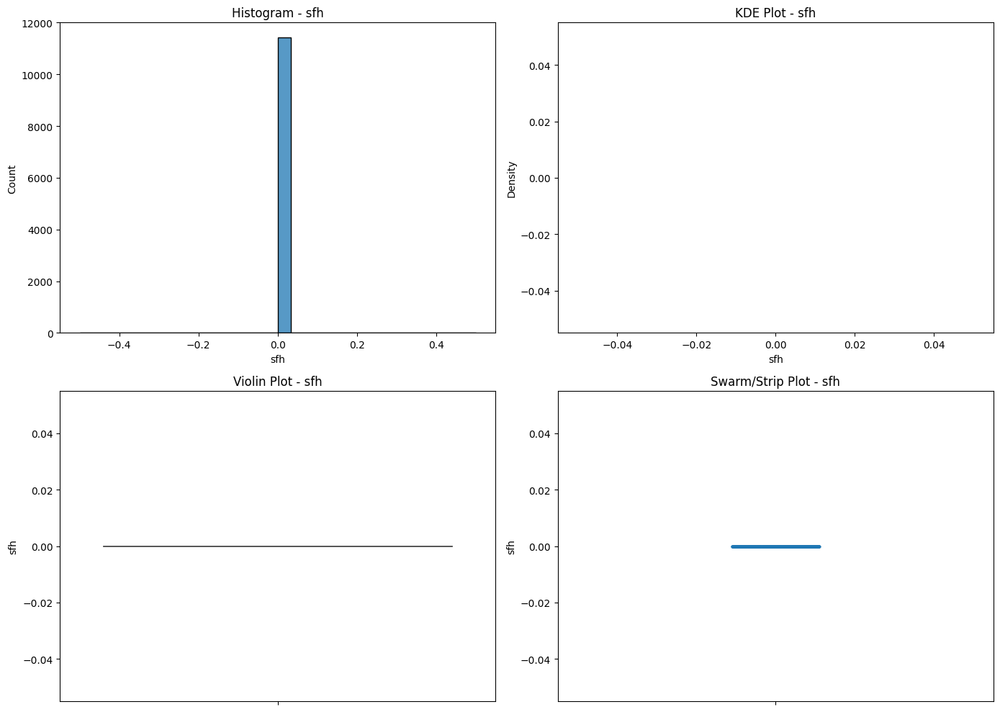

Feature: iframe
  Skewness: 27.55  (Skewed: Right)
  Kurtosis: 757.00  (Flat: False, Peaked: True)
----------------------------------------


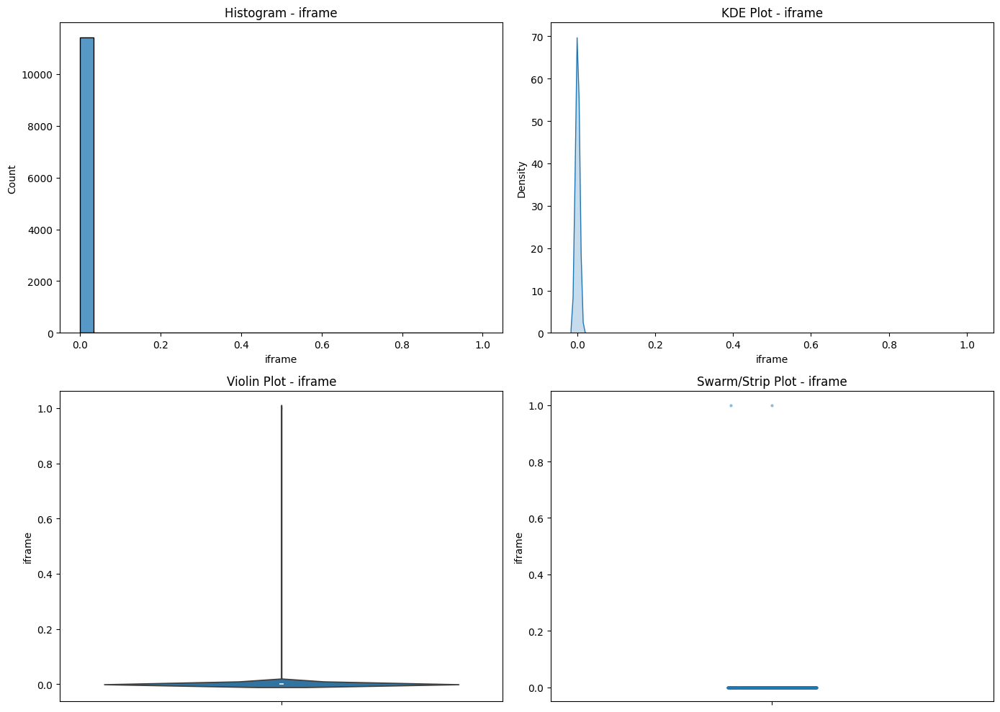

Feature: popup_window
  Skewness: 12.75  (Skewed: Right)
  Kurtosis: 160.66  (Flat: False, Peaked: True)
----------------------------------------


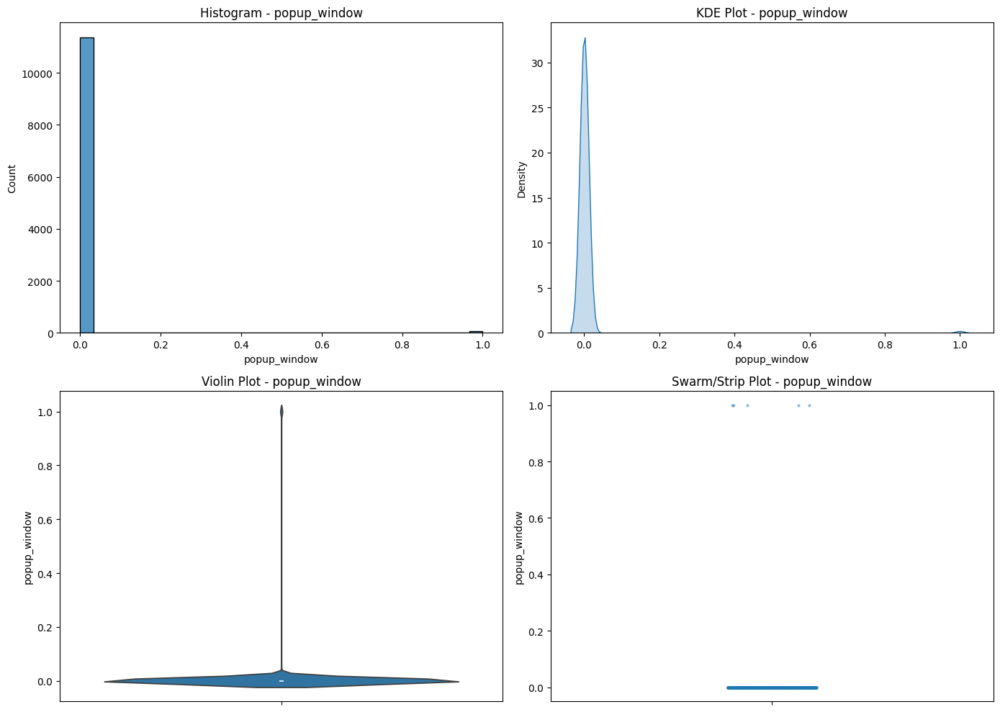

Feature: safe_anchor
  Skewness: 0.51  (Skewed: Right)
  Kurtosis: -1.35  (Flat: True, Peaked: False)
----------------------------------------


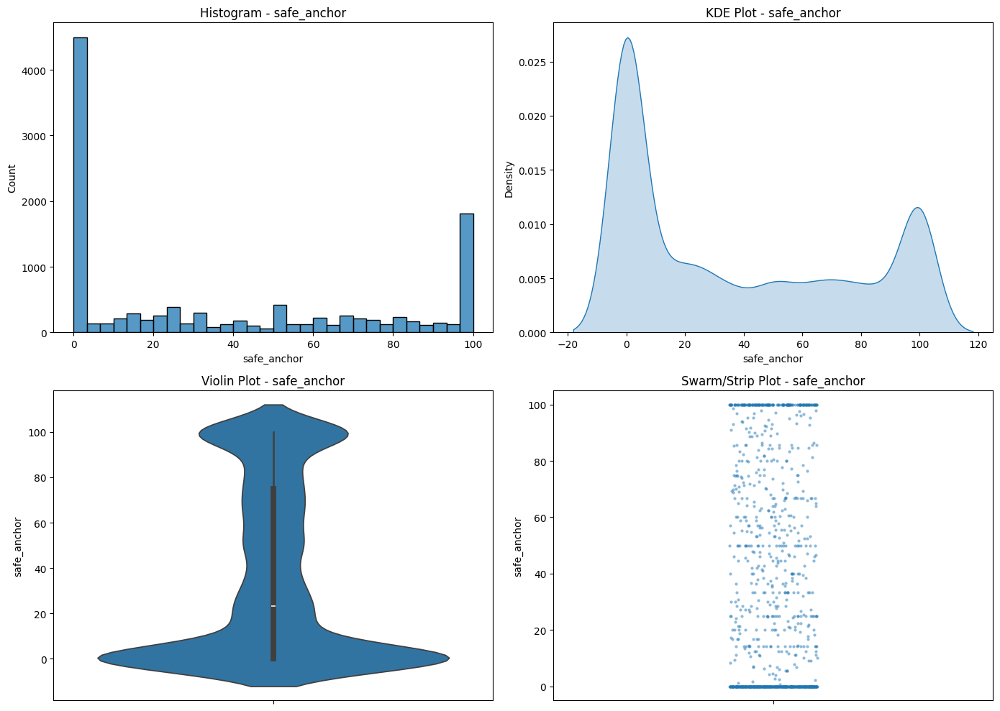

Feature: onmouseover
  Skewness: 29.60  (Skewed: Right)
  Kurtosis: 874.23  (Flat: False, Peaked: True)
----------------------------------------


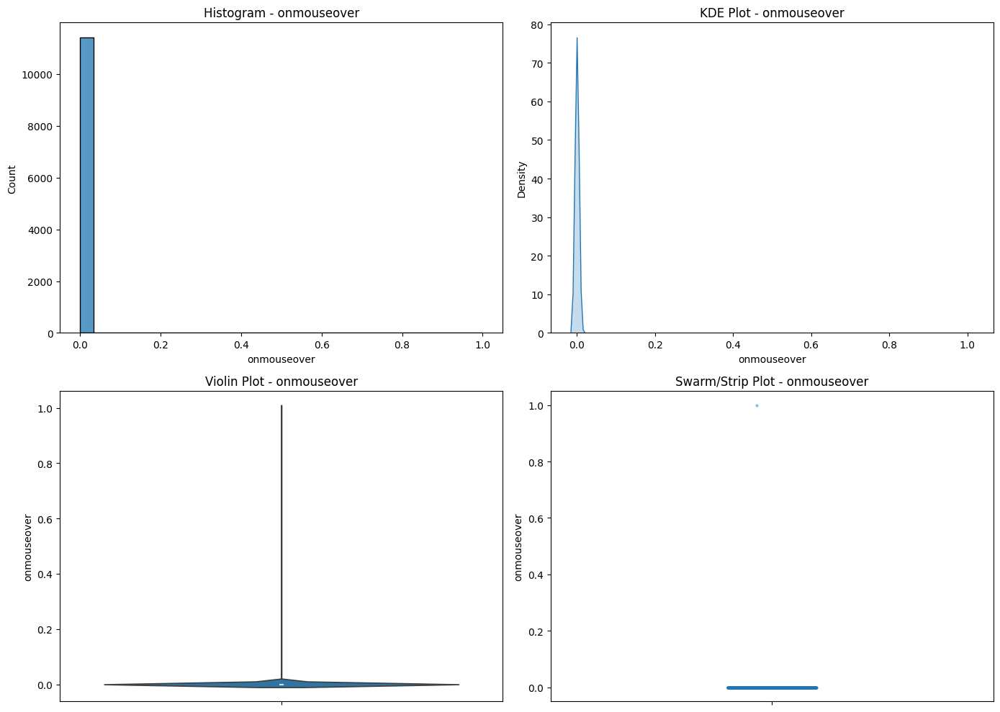

Feature: right_clic
  Skewness: 26.67  (Skewed: Right)
  Kurtosis: 709.38  (Flat: False, Peaked: True)
----------------------------------------


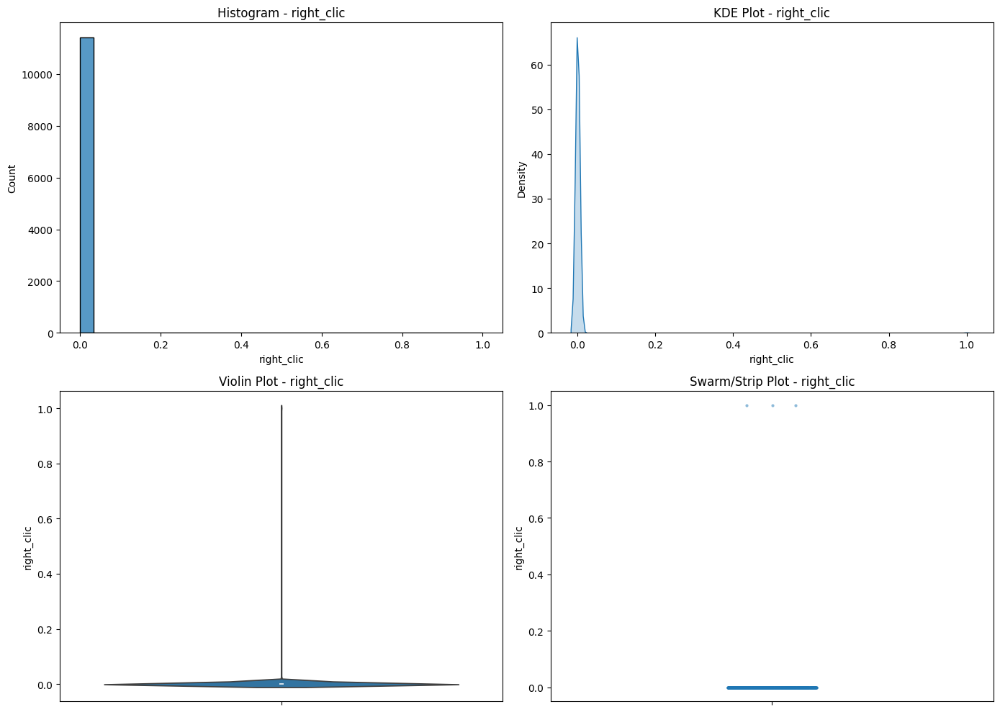

Feature: empty_title
  Skewness: 2.27  (Skewed: Right)
  Kurtosis: 3.16  (Flat: False, Peaked: True)
----------------------------------------


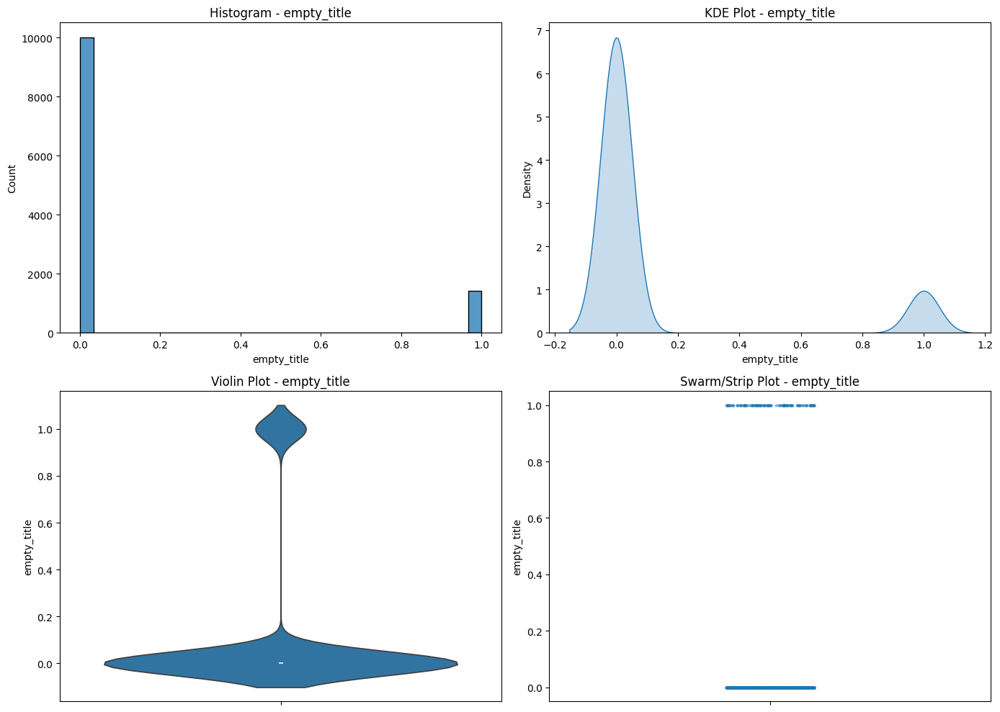

Feature: domain_in_title
  Skewness: -1.32  (Skewed: Left)
  Kurtosis: -0.25  (Flat: True, Peaked: False)
----------------------------------------


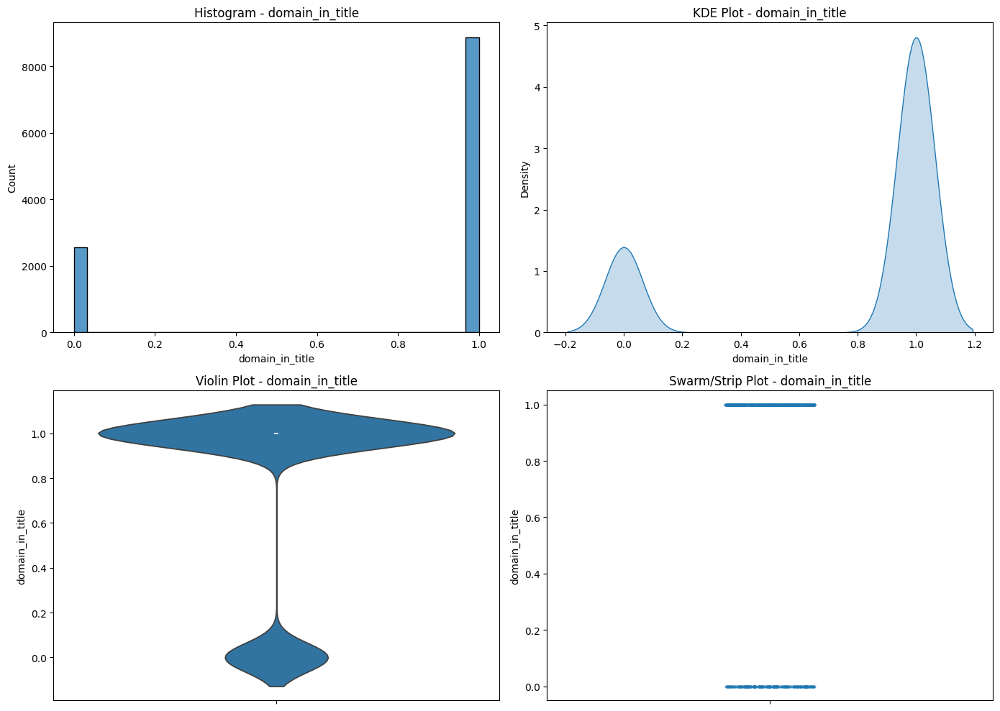

Feature: domain_with_copyright
  Skewness: 0.24  (Skewed: Right)
  Kurtosis: -1.94  (Flat: True, Peaked: False)
----------------------------------------


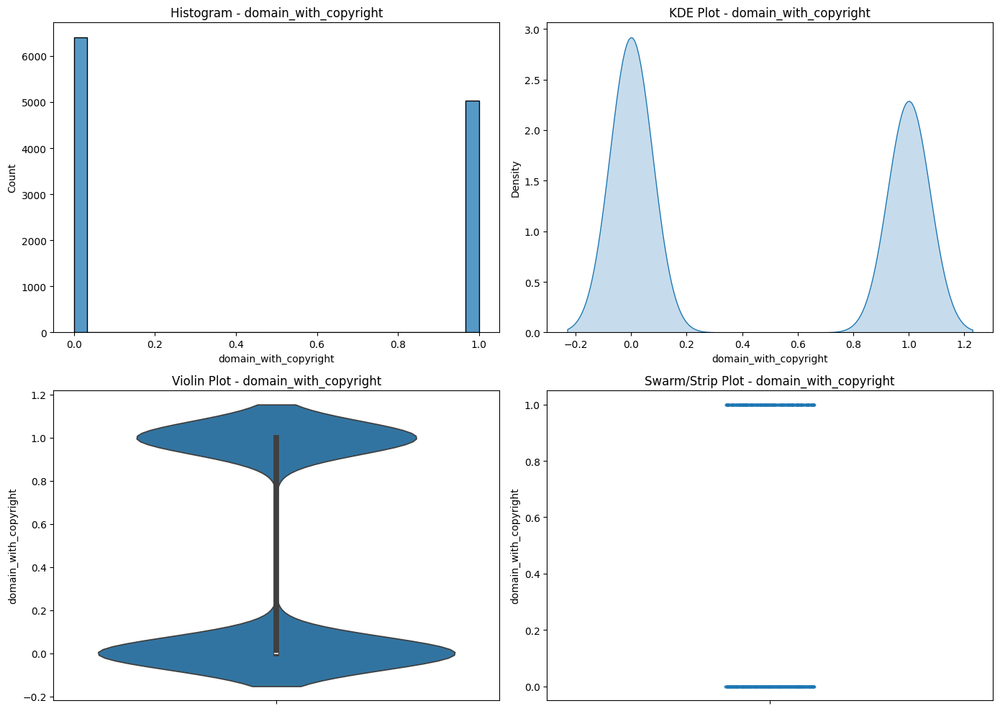

Feature: whois_registered_domain
  Skewness: 3.29  (Skewed: Right)
  Kurtosis: 8.80  (Flat: False, Peaked: True)
----------------------------------------


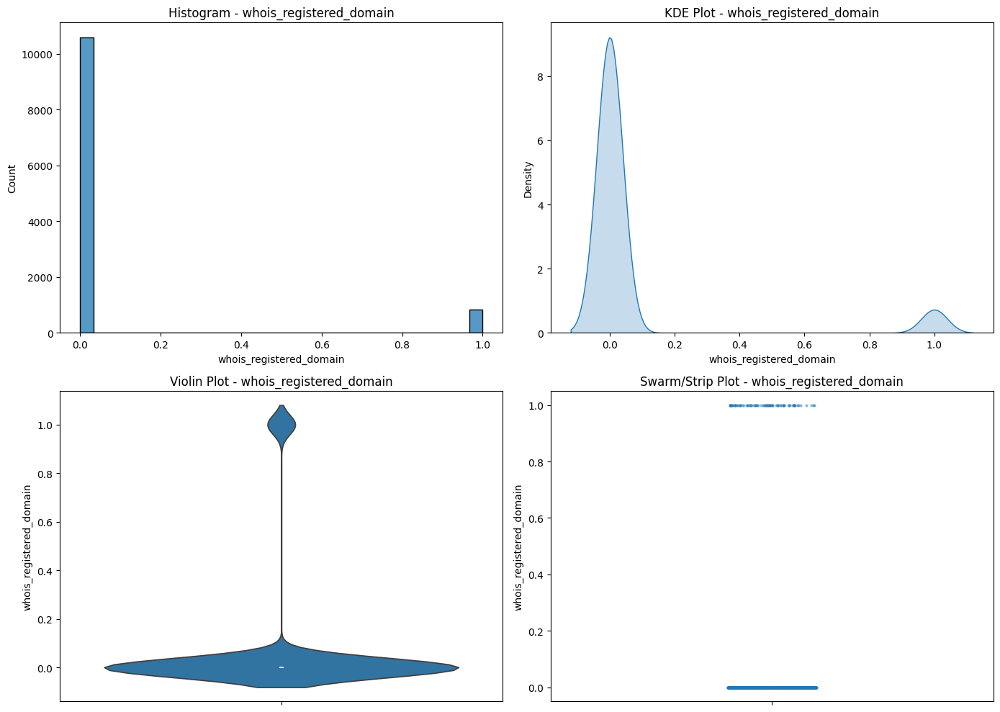

Feature: domain_registration_length
  Skewness: 9.82  (Skewed: Right)
  Kurtosis: 294.55  (Flat: False, Peaked: True)
----------------------------------------


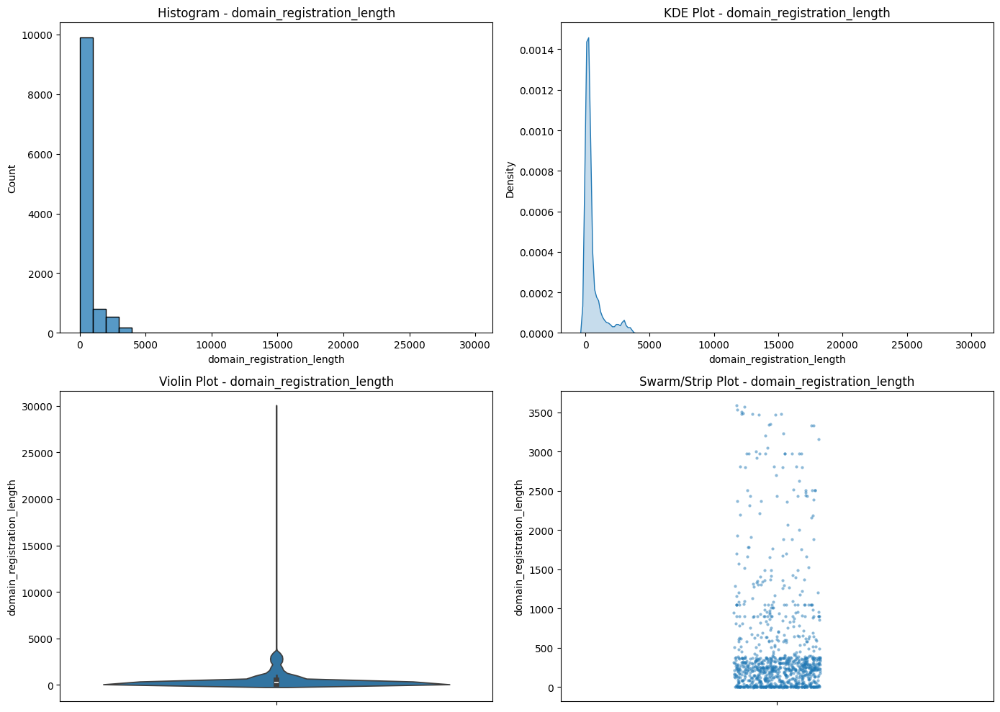

Feature: domain_age
  Skewness: 0.16  (Skewed: Right)
  Kurtosis: -1.10  (Flat: True, Peaked: False)
----------------------------------------


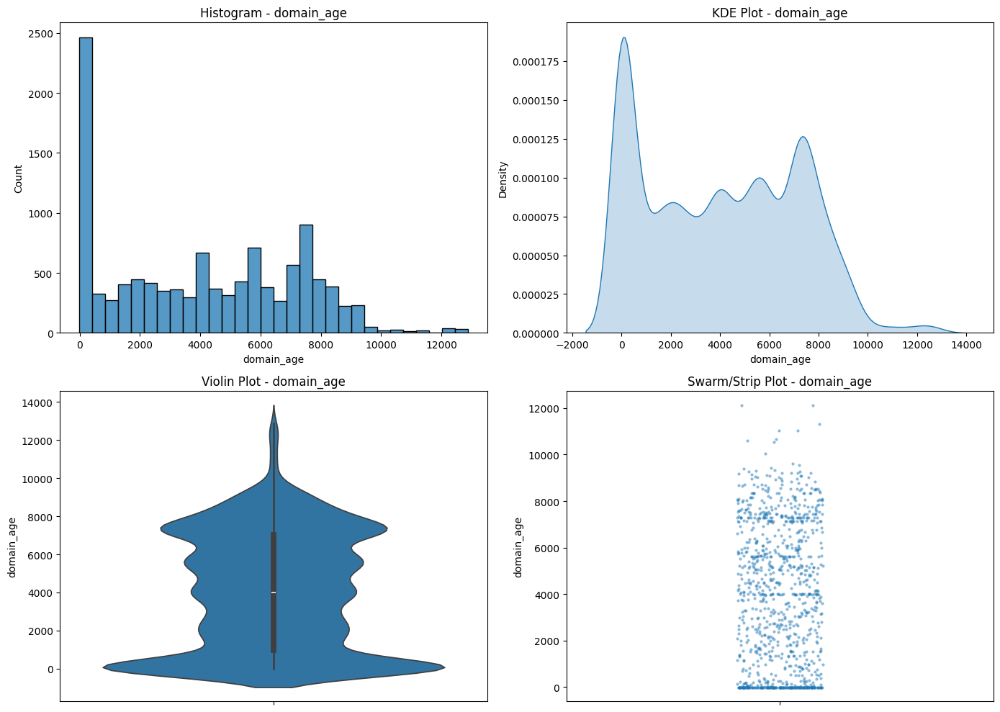

Feature: web_traffic
  Skewness: 2.78  (Skewed: Right)
  Kurtosis: 7.30  (Flat: False, Peaked: True)
----------------------------------------


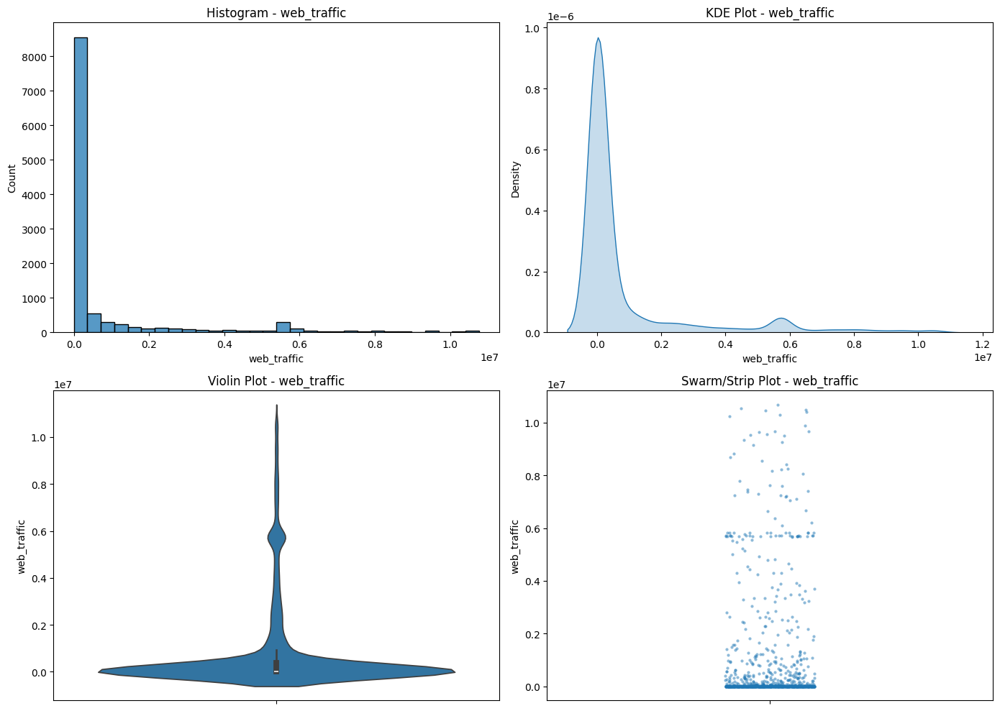

Feature: dns_record
  Skewness: 6.83  (Skewed: Right)
  Kurtosis: 44.72  (Flat: False, Peaked: True)
----------------------------------------


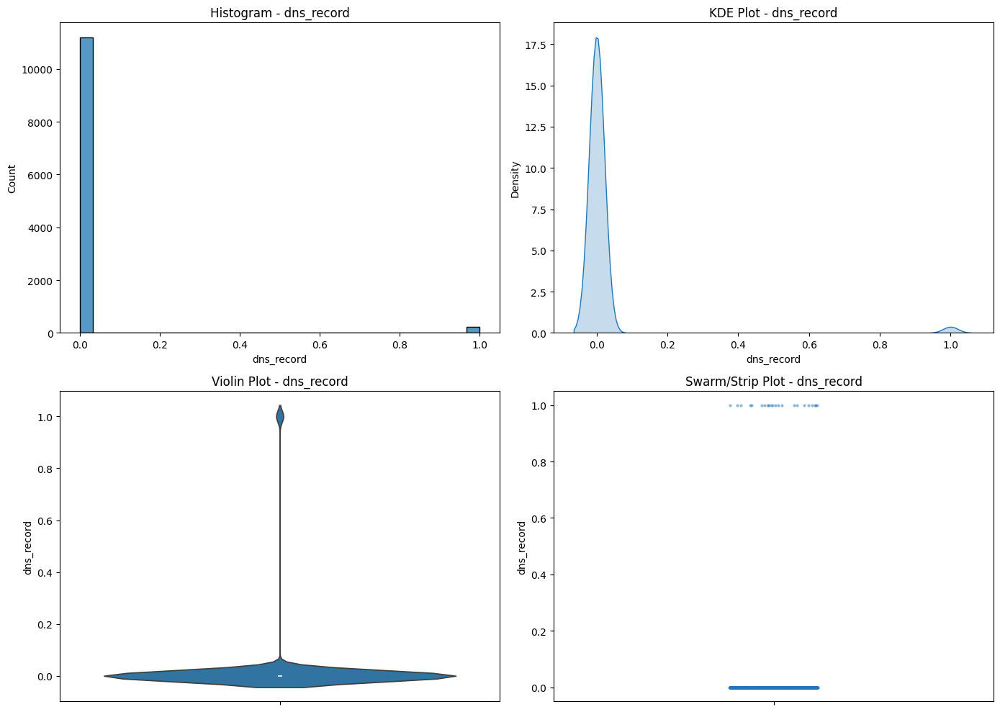

Feature: google_index
  Skewness: -0.14  (Skewed: Left)
  Kurtosis: -1.98  (Flat: True, Peaked: False)
----------------------------------------


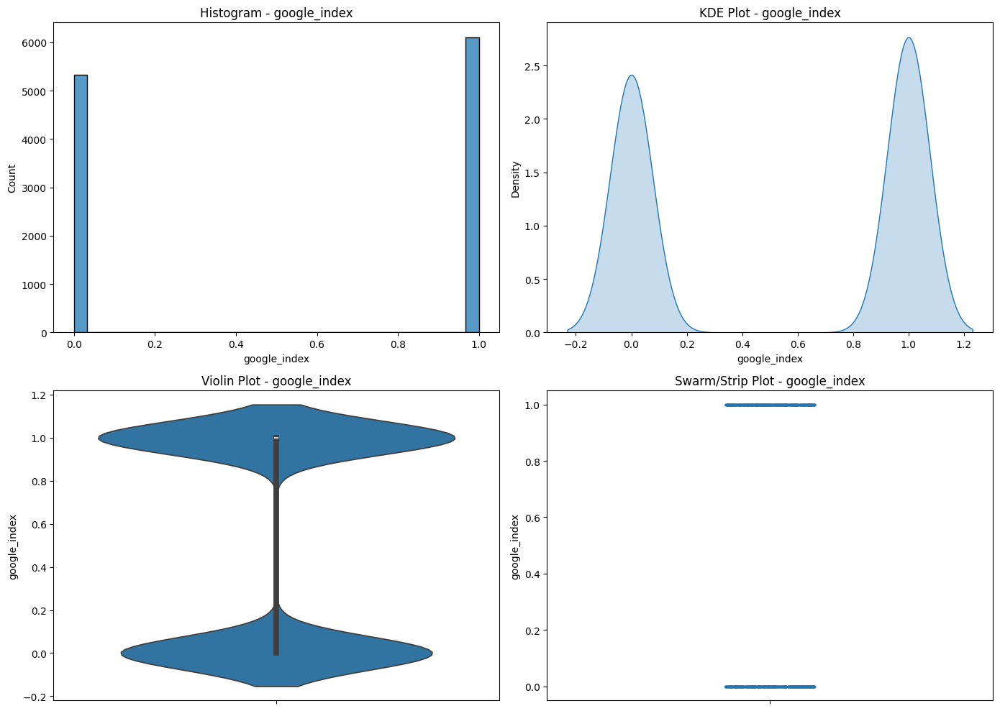

Feature: page_rank
  Skewness: 0.45  (Skewed: Right)
  Kurtosis: -0.39  (Flat: True, Peaked: False)
----------------------------------------


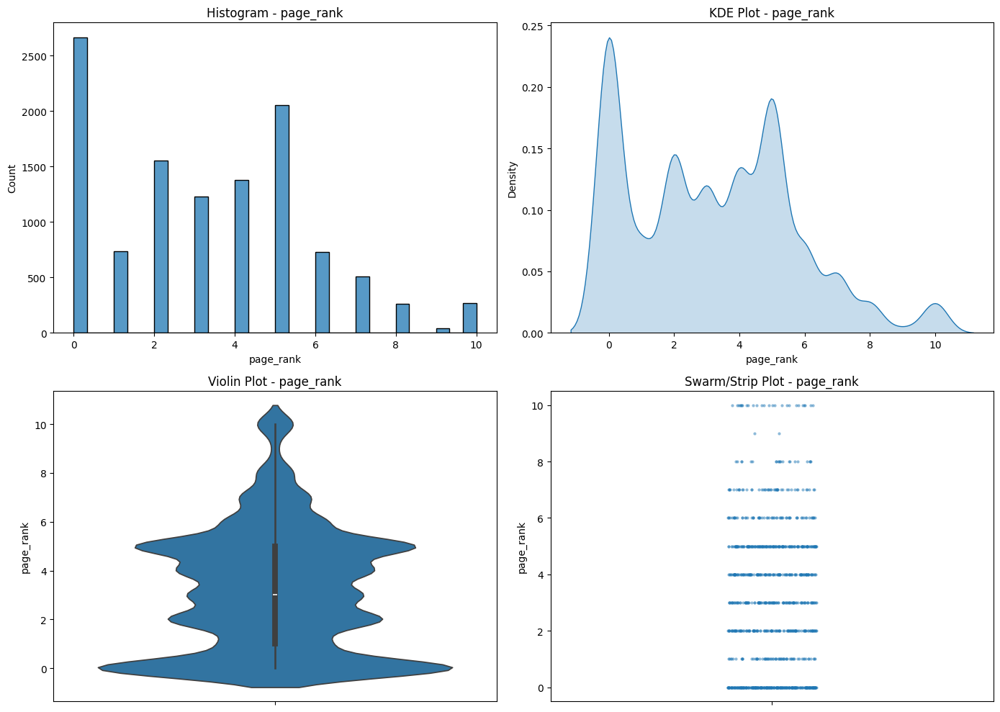

In [29]:
# Get numerical columns
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

# Loop through each numerical column
for col in numeric_cols:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2x2 grid for all plots

    # Histogram (without KDE)
    sns.histplot(df[col], bins=30, kde=False, ax=axes[0, 0])
    axes[0, 0].set_title(f"Histogram - {col}")

    # KDE Plot
    sns.kdeplot(df[col], fill=True, ax=axes[0, 1])
    axes[0, 1].set_title(f"KDE Plot - {col}")

    # Violin Plot
    sns.violinplot(y=df[col], ax=axes[1, 0])
    axes[1, 0].set_title(f"Violin Plot - {col}")

    # Swarm Plot Optimized (Uses Strip Plot if dataset > 2,000 rows)
    if len(df) < 2000:
        sns.swarmplot(y=df[col], ax=axes[1, 1], size=3)
    else:
        sample_size = min(1000, len(df[col].dropna()))  # Reduce sample size for large datasets
        sample_df = df[col].dropna().sample(sample_size, random_state=42)
        sns.stripplot(y=sample_df, ax=axes[1, 1], size=3, jitter=True, alpha=0.5)  # Faster alternative

    axes[1, 1].set_title(f"Swarm/Strip Plot - {col}")

    # Print Summary Statistics
    col_skewness = skew(df[col].dropna())
    col_kurtosis = kurtosis(df[col].dropna())
    print(f"Feature: {col}")
    print(f"  Skewness: {col_skewness:.2f}  (Skewed: {'Right' if col_skewness > 0 else 'Left' if col_skewness < 0 else 'Symmetric'})")
    print(f"  Kurtosis: {col_kurtosis:.2f}  (Flat: {col_kurtosis < 3}, Peaked: {col_kurtosis > 3})")
    print("-" * 40)

    plt.tight_layout()
    plt.show()


**Source: ChatGPT**

📌 What is Kurtosis?

Kurtosis is a statistical measure that describes the "tailedness" or "peakedness" of a distribution. It tells us how heavy or light the tails of a distribution are compared to a normal distribution.

📊 Types of Kurtosis

There are three main types of kurtosis:

- Mesokurtic (Normal Kurtosis, ≈ 3)

Similar to a normal distribution.
Moderate tails and peak.

Example: IQ scores, height distribution.

- Leptokurtic (High Kurtosis, > 3)

Heavy tails (more outliers).
Sharper peak in the middle.

Example: Stock market crashes (rare extreme values occur frequently).

- Platykurtic (Low Kurtosis, < 3)

Light tails (fewer outliers).
Flatter peak.

Example: Uniform distribution.

**Find means, medians, and modes:**

In [30]:
# Get numerical columns
numeric_cols = df.select_dtypes(include=[np.number])

# Compute statistics
means = numeric_cols.mean()
medians = numeric_cols.median()
modes = numeric_cols.mode().iloc[0]  # Mode can have multiple values, take the first

# Combine into a DataFrame
stats_df = pd.DataFrame({
    "Mean": means,
    "Median": medians,
    "Mode": modes
})

# Display results
print(stats_df)

                          Mean  Median  Mode
length_url           61.126684    47.0  26.0
length_hostname      21.090289    19.0  16.0
ip                    0.150569     0.0   0.0
nb_dots               2.480752     2.0   2.0
nb_hyphens            0.997550     0.0   0.0
...                        ...     ...   ...
domain_age         4062.543745  3993.0  -1.0
web_traffic      856756.643307  1651.0   0.0
dns_record            0.020122     0.0   0.0
google_index          0.533946     1.0   1.0
page_rank             3.185739     3.0   0.0

[87 rows x 3 columns]


**Draw a bar plot to indicate total counts of each categorical variable in a given column:**

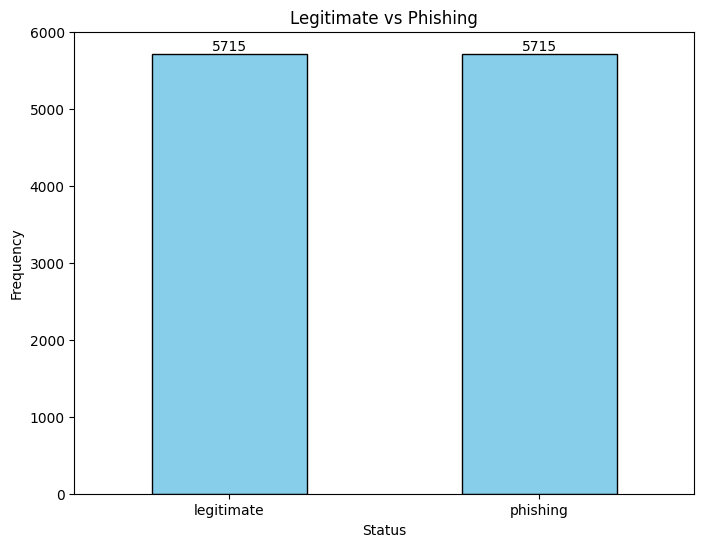

In [31]:
status_counts = df['status'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
ax = status_counts.plot(kind='bar', color='skyblue', edgecolor='black')

# Display the exact value on top of each bar
for i, value in enumerate(status_counts):
    ax.text(i, value + 0.1, str(value), ha='center', va='bottom', fontsize=10)

plt.xlabel('Status')
plt.ylabel('Frequency')
plt.title('Legitimate vs Phishing')
plt.xticks(rotation=0)
plt.show()

### Conclusions:

- Are the data what you expect?  Are the data likely to be usable?  If they are not useable, find some new data!

The data is likely to be usable, however some columns seem to be unuseful.

- What is the overall shape of the distribution?  Is it normal, skewed, bimodal, uniform, etc.?

Overwall, we could say that it is skewed.

- Are there any outliers present?  (Data points that are far from the others.)

Yes!

- What are the minimum and maximum values represented in each histogram?

It varies a lot depending on the feature/column. Please refer to the individual histograms.

- How do bin sizes affect the histogram?  Does changing the bin width reveal different patterns in the data?

Bin sizes do not seem to affect the histogram a lot. I tried with 30, 40 and 50 for the size.

- Does the distribution appear normal, or does it have a different distribution?

Most of the features are right-skewed, a skewness value greater than 0 and are also peaked.

# 4. Storytelling With Data graph

Reproduce any graph of your choice in p. 52-68 of the Storytelling With Data book as best you can.  (The second half of chapter two).  You do not have to get the exact data values right, just the overall look and feel.

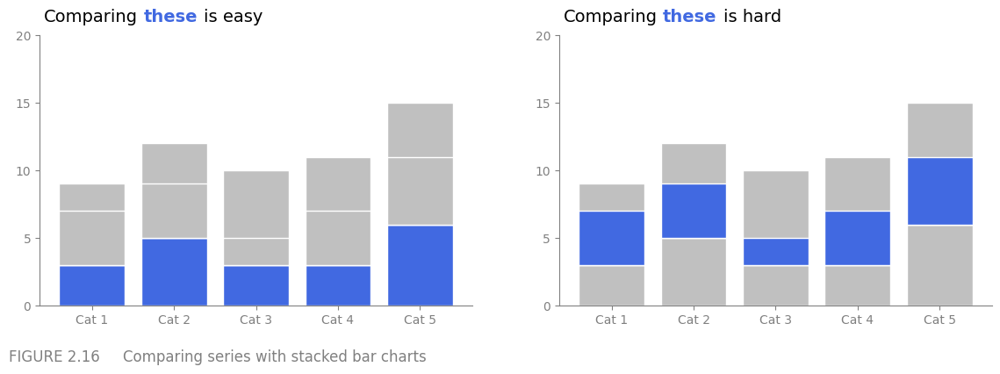

In [32]:
# Initial code is from: https://www.geeksforgeeks.org/create-a-stacked-bar-plot-in-matplotlib/

x = ['Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5']
y1 = [3, 5, 3, 3, 6]
y2 = [6, 7, 7, 8, 9]
y3 = [4, 4, 2, 4, 5]

# Create a figure with two subplots (side by side)
fig, axs = plt.subplots(1, 2, figsize=(14, 4))

# Plot the chart on the first subplot (left)
axs[0].bar(x, y1, color='royalblue', edgecolor='white')
axs[0].bar(x, y2, bottom=y1, color='silver', edgecolor='white')
axs[0].bar(x, y3, bottom=y1, color='silver', edgecolor='white')

# Title for the first plot with 'these' in royalblue and bold
axs[0].text(0.01, 1.05, 'Comparing', transform=axs[0].transAxes, fontsize=14, color='black')
axs[0].text(0.24, 1.05, 'these', transform=axs[0].transAxes, fontsize=14, color='royalblue', fontweight='bold')
axs[0].text(0.38, 1.05, 'is easy', transform=axs[0].transAxes, fontsize=14, color='black')

# Borders (spines) for the first plot
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].spines['bottom'].set_color('gray')
axs[0].spines['left'].set_color('gray')

# Set ticks to gray for the first plot
axs[0].tick_params(axis='x', colors='grey')
axs[0].tick_params(axis='y', colors='grey')
axs[0].set_yticks(np.arange(0, 21, 5))  # Set y-axis ticks from 0 to 20, with intervals of 5

# Plot the chart on the second subplot (right)
axs[1].bar(x, y1, color='silver', edgecolor='white')
axs[1].bar(x, y2, bottom=y1, color='silver', edgecolor='white')
axs[1].bar(x, y3, bottom=y1, color='royalblue', edgecolor='white')

# Title for the second plot with 'these' in royalblue and bold
axs[1].text(0.01, 1.05, 'Comparing', transform=axs[1].transAxes, fontsize=14, color='black')
axs[1].text(0.24, 1.05, 'these', transform=axs[1].transAxes, fontsize=14, color='royalblue', fontweight='bold')
axs[1].text(0.38, 1.05, 'is hard', transform=axs[1].transAxes, fontsize=14, color='black')

# Borders (spines) for the second plot
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].spines['bottom'].set_color('gray')
axs[1].spines['left'].set_color('gray')

# Set ticks to gray for the second plot
axs[1].tick_params(axis='x', colors='grey')
axs[1].tick_params(axis='y', colors='grey')
axs[1].set_yticks(np.arange(0, 21, 5))  # Set y-axis ticks from 0 to 20, with intervals of 5

# Add the reference text at the bottom of the figure
fig.text(0.1, -0.05, 'FIGURE 2.16     Comparing series with stacked bar charts', ha='left', fontsize=12, color='grey')

# Show the plot
plt.show()